# G-18 Analysis and Visualization of Pollution using UV Aerosol Index UVAI as a proxy variable (Notebook 1 of 2)



**Additional Packages required to run the code:**

- conda update --all

- conda install geopandas

- conda install descartes

## Table Of Contents

| Section.No| Subsection | Title |
| :- | :- | :- |
| **1** | | **G-18 Analysis And Visualization of Pollution using UV Aerosol Index UVAI as a proxy variable**|
|  | **1.1**|Table of Contents|
|  | **1.2**|Done by|
| **2** | |**Loading Data** |
| **3** | | **Visualizing for Individual cities**|
|  | **3.1** | **Delhi** |
|  | 3.1.1 | Loading and Visualizing |
|  | 3.1.2 | Plotting Maps and Insights|
|  | **3.2** | **Mumbai** |
|  | 3.2.1 | Loading and Visualizing |
|  | 3.2.2 | Plotting Maps and Insights|
|  | **3.3** | **Pune**  |
|  | 3.3.1 | Loading and Visualizing |
|  | 3.3.2 | Plotting Maps and Insights|
|  | **3.4** | **Ahmedabad** |
|  | 3.4.1 | Loading and Visualizing |
|  | 3.4.2 | Plotting Maps and Insights|
|  | **3.5** | **Bangalore** |
|  | 3.5.1 | Loading and Visualizing |
|  | 3.5.2 | Plotting Maps and Insights|
|  | **3.6** | **Bhopal** |
|  | 3.6.1 | Loading and Visualizing |
|  | 3.6.2 | Plotting Maps and Insights|
|  | **3.7** | **Bhubaneshwar** |
|  | 3.7.1 | Loading and Visualizing |
|  | 3.7.2 | Plotting Maps and Insights|
|  | **3.8** | **Chennai** |
|  | 3.8.1 | Loading and Visualizing |
|  | 3.8.2 | Plotting Maps and Insights|
|  | **3.9** | **Hyderabad** |
|  | 3.9.1 | Loading and Visualizing |
|  | 3.9.2 | Plotting Maps and Insights|
|  | **3.10** | **Jaipur** |
|  | 3.10.1 | Loading and Visualizing |
|  | 3.10.2 | Plotting Maps and Insights|
|  | **3.11** | **Kolkata** |
|  | 3.11.1 | Loading and Visualizing |
|  | 3.11.2 | Plotting Maps and Insights|
| **4** | | **Visualizing for India** |
|  | **4.1** | Loading and Visualizing |
|  | **4.2** | Plotting on India Map |
|  | **4.3** | Plots for all regions |
|  | **4.4** | Summary Statistics |
|  | **4.5** | Grouping cities into Categories |
|  | **4.6** | Comparision among Group 1 and Group 2 |
|  | **4.7** | Comparative Case Study Of Group 1 and Group 2 cities with Delhi And Hyderabad as Prime Cities |

## Done By: -
| Name | Roll Number |
| :- | :- |
| Vimal Rajesh | B180336CS |
| Puchakayala Dheeraj Reddy | B180902CS |
| P Arjun | B180454CS |
| Alok Raj | B180411CS |
| Kunal Ravikumar Jagtap | B180921CS |

**Introduction**

**1. Our assigned dataset is Sentinel-5P NRTI AER AI: Near Real-Time UV Aerosol Index**

**2. Our variable/band of interest is Absorbing Aerosol Index (AAI)**

**3. The Absorbing Aerosol Index (AAI) can be used to determine the presence of UV-absorbing aerosols, such as dust and smoke.**

**4. Positive values indicate the presence of these pollutants.**

**5. Availability of our dataset is from July 10, 2018 to present(till October 13, 2020)**

**Atmospheric aerosols from human activity influence climate.**

Atmospheric aerosols are suspensions of liquid, solid, or mixed particles with highly variable chemical composition and size distribution (Putaud et al. 2010). Their variability is due to the numerous sources and varying formation mechanisms (Figure 1). Aerosol particles are either emitted directly to the atmosphere (primary aerosols) or produced in the atmosphere from precursor gases (secondary aerosols).

The Indian subcontinent, apart from being a source region for aerosols, is bordered by densely populated and industrialized areas on the east and western sides from where different aerosol species are produced and transported and is one of the regional aerosol hot spots. The Indian landmass comprises coastal regions, inland plains, semiarid regions, mountains, and plateau regions and experiences tropical and subtropical climatic conditions resulting in extreme temperatures, rainfall, and relative humidity which modulate the aerosol characteristics 

Absorbing Aerosol Index provides the measure of the prevalence of aerosols in the atmosphere, calculated by this equation on https://sentinel.esa.int/web/sentinel/technical-guides/sentinel-5p/level-2/aerosol-index using the 354/388 wavelength pair.


# Loading the data
We will load all the region data into a dictionary of dataframes. This way, we can access all of them.

In [1]:
# importing required libraries
import glob
import os
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import geopandas as gpd
import seaborn as sns
from scipy.stats import ttest_ind
import warnings
warnings.filterwarnings('ignore')
%matplotlib inline
cities1 = ["Ahmedabad", "Bangalore" , "Chennai", "Hyderabad", "Jaipur" , 
           "Pune", "Mumbai" ,"Bhopal" ,"Bhubaneshwar" , "Kolkata","Delhi"]
for x in cities1:
    print(x) # printing the cities of interest

Ahmedabad
Bangalore
Chennai
Hyderabad
Jaipur
Pune
Mumbai
Bhopal
Bhubaneshwar
Kolkata
Delhi


In [2]:
# loading the csvs into a dictionary of dataframes
df = {}
for i in cities1:
    df[i] = pd.read_csv(r'Cleaned CSVs/'+i+'/merged_csv'+i+".csv")
    df[i]= df[i].fillna(0)
    df[i]["date"]= pd.to_datetime(df[i].date)
# df

In [3]:
# Viewing the cleaned data with an example city
df["Delhi"].head(10)

,Ward_No,date,mean
0,0,2018-07-11,0.438815
1,150,2018-07-11,0.745821
2,176,2018-07-11,0.416006
3,129,2018-07-11,0.767066
4,173,2018-07-11,0.562144
5,140,2018-07-11,0.740244
6,206,2018-07-11,0.555880
7,145,2018-07-11,0.727814
8,179,2018-07-11,0.270564
9,3,2018-07-11,0.264471


# Visualising For Individual Cities
Now as we have already loaded the dataframes, lets move on to Visualising and deriving Insights from them.

## City Number 1: Delhi

### Loading and Visualizing

In [4]:
df["Delhi"]

,Ward_No,date,mean
0,0,2018-07-11,0.438815
1,150,2018-07-11,0.745821
2,176,2018-07-11,0.416006
3,129,2018-07-11,0.767066
4,173,2018-07-11,0.562144
...,...,...,...
689887,35,2020-10-13,-0.700897
689888,219,2020-10-13,-0.764063
689889,26,2020-10-13,-0.678314
689890,187,2020-10-13,-0.756840


In [5]:
# g = df1.groupby(pd.Grouper(freq="M"))
# g.mean()
Delhi = df["Delhi"].groupby(["date"]).mean()
Delhi["month"] = Delhi.index.month
Delhi["year"] = Delhi.index.year
Delhi

,mean,month,year
date,,,
2018-07-11,0.512202,7,2018
2018-07-12,0.032969,7,2018
2018-07-13,-0.495366,7,2018
2018-07-15,-1.645103,7,2018
2018-07-16,-0.672453,7,2018
...,...,...,...
2020-10-09,-0.199986,10,2020
2020-10-10,-0.842192,10,2020
2020-10-11,-0.850865,10,2020


In [6]:
# Aggregate statistics grouped by Weeks
Weekly_Delhi_mean = Delhi.groupby(pd.Grouper(freq="W-MON")).mean()
Weekly_Delhi_max = Delhi.groupby(pd.Grouper(freq="W-MON")).max()
Weekly_Delhi_min = Delhi.groupby(pd.Grouper(freq="W-MON")).min()

# Aggregate statistics grouped by Months
Monthly_Delhi_mean = Delhi.groupby(pd.Grouper(freq="M")).mean()
Monthly_Delhi_max = Delhi.groupby(pd.Grouper(freq="M")).max()
Monthly_Delhi_min = Delhi.groupby(pd.Grouper(freq="M")).min()

#Week Identifier
Weekly_Delhi_mean["week"] = Weekly_Delhi_mean.index.isocalendar().week
Weekly_Delhi_min["week"] = Weekly_Delhi_min.index.isocalendar().week
Weekly_Delhi_max["week"] = Weekly_Delhi_max.index.isocalendar().week

Monthly_Delhi_mean["week"] = Monthly_Delhi_mean.index.isocalendar().week
Monthly_Delhi_min["week"] = Monthly_Delhi_min.index.isocalendar().week
Monthly_Delhi_max["week"] = Monthly_Delhi_max.index.isocalendar().week

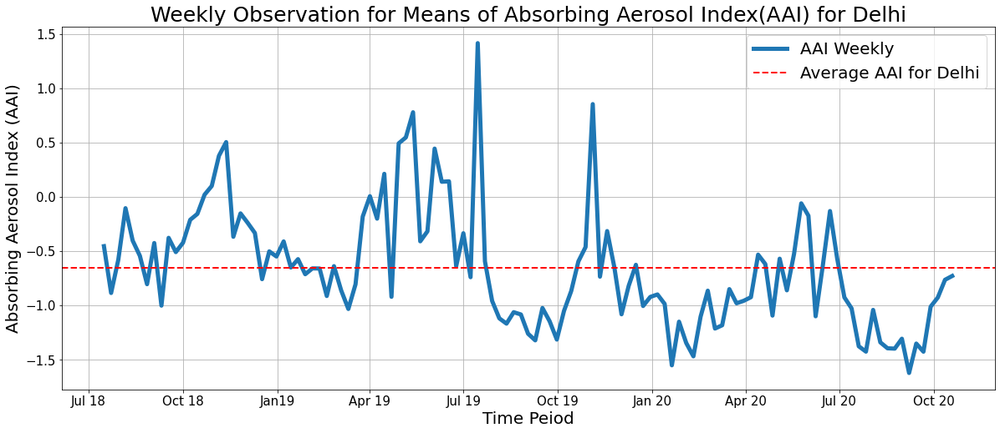

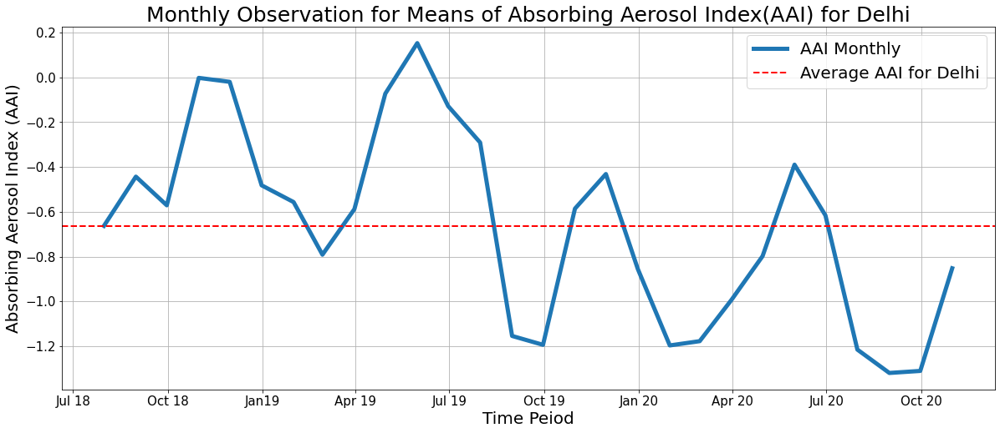

In [7]:
# Visualizing by grouping into weeekly data
plt.figure(figsize = (20,8))
plt.plot( Weekly_Delhi_mean.index.tolist(),Weekly_Delhi_mean["mean"], linewidth = 5, label = "AAI Weekly")
plt.gca().axhline(y=Weekly_Delhi_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Delhi")
plt.title("Weekly Observation for Means of Absorbing Aerosol Index(AAI) for Delhi",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

# Visualizing by grouping into Monthly data
plt.figure(figsize = (20,8))
plt.plot( Monthly_Delhi_mean.index.tolist(),Monthly_Delhi_mean["mean"], linewidth = 5, label = "AAI Monthly")
plt.gca().axhline(y=Monthly_Delhi_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Delhi")
plt.title("Monthly Observation for Means of Absorbing Aerosol Index(AAI) for Delhi",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

We can observe that Aerosol Optical Depth has decreased in the past year. The change in policies, Even Odd Rule and Coronavirus Pandemic seems to have shifted the curve down.

**We will now plot some useful insights with Monthly Data**

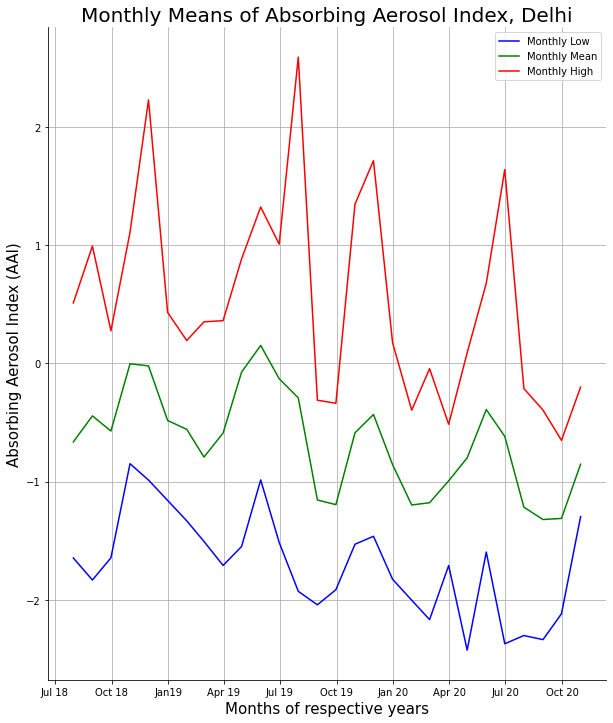

In [8]:
# Plotting Monthly means 
plt.figure(figsize=(10,12))
plt.plot(list(Monthly_Delhi_min.index),list(Monthly_Delhi_min["mean"]), label = "Monthly Low", color = "blue" )
plt.plot(list(Monthly_Delhi_mean.index),list(Monthly_Delhi_mean["mean"]), label= "Monthly Mean" , color ="green")
plt.plot(list(Monthly_Delhi_max.index),list(Monthly_Delhi_max["mean"]), label = "Monthly High", color = "red" )

plt.xlabel("Months of respective years",fontsize= 15)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Monthly Means of Absorbing Aerosol Index, Delhi",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 15)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels)
plt.legend()
plt.grid()


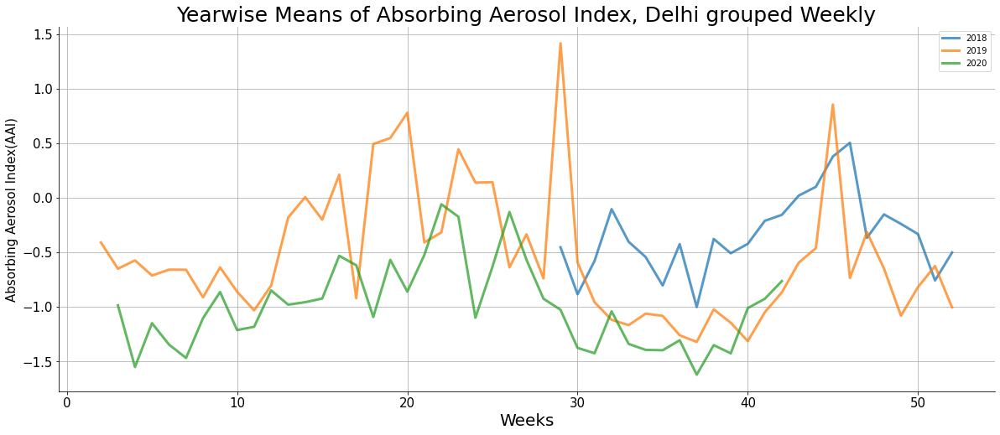

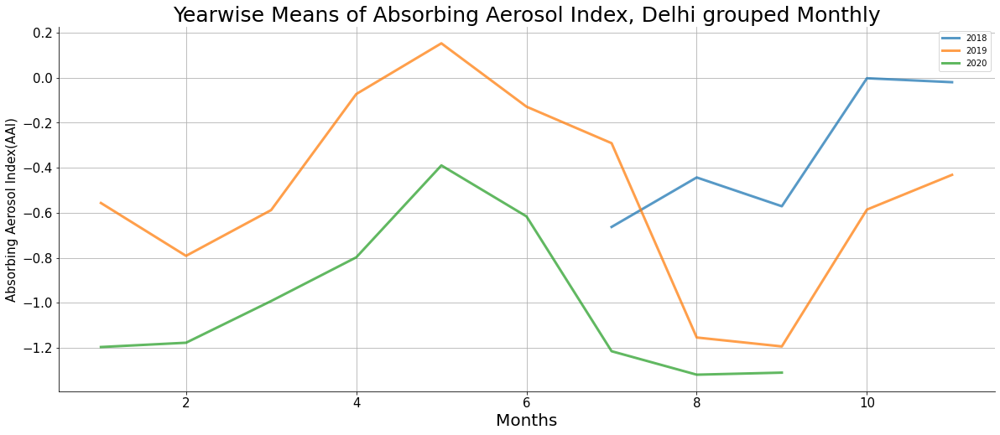

In [9]:
# Plotting Yearwise means
x = [i for i in range(1,13)]
plt.figure(figsize = (20,8))
plt.plot(Weekly_Delhi_mean[Weekly_Delhi_mean["year"] == 2018]["week"].tolist()[:-1],Weekly_Delhi_mean[Weekly_Delhi_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Weekly_Delhi_mean[Weekly_Delhi_mean["year"] == 2019]["week"].tolist()[:-1],Weekly_Delhi_mean[Weekly_Delhi_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Weekly_Delhi_mean[Weekly_Delhi_mean["year"] == 2020]["week"].tolist()[:-1],Weekly_Delhi_mean[Weekly_Delhi_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Weeks",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Yearwise Means of Absorbing Aerosol Index, Delhi grouped Weekly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.grid()
plt.legend()

plt.figure(figsize = (20,8))
plt.plot(Monthly_Delhi_mean[Monthly_Delhi_mean["year"] == 2018]["month"].tolist()[:-1],Monthly_Delhi_mean[Monthly_Delhi_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Monthly_Delhi_mean[Monthly_Delhi_mean["year"] == 2019]["month"].tolist()[:-1],Monthly_Delhi_mean[Monthly_Delhi_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Monthly_Delhi_mean[Monthly_Delhi_mean["year"] == 2020]["month"].tolist()[:-1],Monthly_Delhi_mean[Monthly_Delhi_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Months",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.title("Yearwise Means of Absorbing Aerosol Index, Delhi grouped Monthly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.grid()
plt.legend()

The observation from the above graph is that, the Absorbing Aerosol Index values have come down considerably in the last two years. From the graph it is evident that the Aerosol Index values are lesser in 2020. Therefore it can be concluded that the polution in Delhi has been lower in 2020 compared to the previous two years.

### Plotting Maps For Insights

In [10]:
# Grouping by Wards Data for further analysis
Delhi_wards = df["Delhi"].groupby(["Ward_No"]).mean()
Delhi_wards

,mean
Ward_No,
0,-0.680295
1,-0.731255
10,-0.689665
100,-0.647567
101,-0.625559
...,...
NDMC_5,-0.724424
NDMC_6,-0.726328
NDMC_7,-0.734284


<AxesSubplot:>

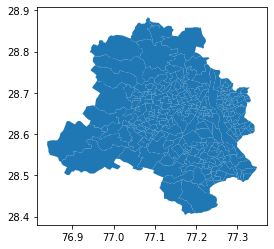

In [11]:
# loading the shapefile
path = r'Cleaned CSVs/Delhi/Delhi_Wards-polygon.shp'
map_Delhi = gpd.read_file(path)
# Viewing the shapefile
map_Delhi.plot()

In [12]:
# merging the shapefile with the mean data
merged_Delhi = map_Delhi.merge(Delhi_wards, left_on = "Ward_No", right_index = True)
# merged_Delhi.head()
merged_Delhi

,Ward_Name,Ward_No,geometry,mean
0,DELHI CANTT CHARGE 1,CANT_1,"POLYGON ((77.13228 28.63154, 77.13644 28.62062...",-0.696738
1,DELHI CANTT CHARGE 2,CANT_2,"POLYGON ((77.15429 28.62335, 77.15501 28.62228...",-0.734493
2,DELHI CANTT CHARGE 4,CANT_4,"POLYGON ((77.15755 28.57578, 77.15672 28.57564...",-0.773336
3,DELHI CANTT CHARGE 5,CANT_5,"POLYGON ((77.13480 28.57051, 77.13429 28.57048...",-0.751757
4,DELHI CANTT CHARGE 6,CANT_6,"POLYGON ((77.12157 28.59308, 77.12878 28.59029...",-0.704756
...,...,...,...,...
285,PREM NAGAR,33,"POLYGON ((77.06644 28.70141, 77.06574 28.70063...",-0.587757
286,SHASTRI NAGAR,73,"POLYGON ((77.19404 28.67288, 77.19196 28.66855...",-0.664843
287,VISHNU GARDEN,107,"POLYGON ((77.09982 28.64496, 77.09947 28.64504...",-0.611266
288,TUKHMIR PUR,270,"POLYGON ((77.25834 28.71855, 77.25858 28.71785...",-0.637667


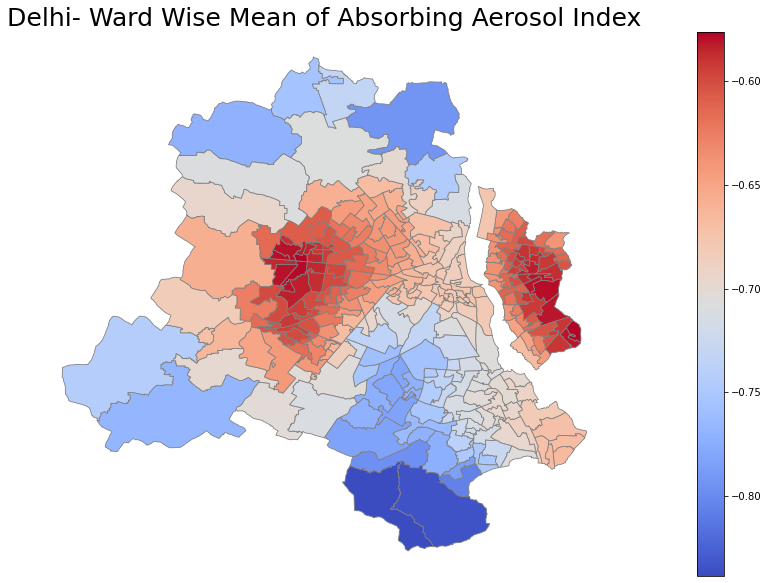

In [13]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values
vmin, vmax = merged_Delhi["mean"].min(), merged_Delhi["mean"].max()
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(30, 10))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('Delhi- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='coolwarm',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 
# empty array for the data range
sm.set_array([]) 
# add the colorbar to the figure
fig.colorbar(sm)
# create map
merged_Delhi.plot(column=variable, cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.5', figsize = (5,15))
plt.show()

In [14]:
# Using T-Test to determine if climate has changed in the first 14 and last 14 months in Delhi
ttest_ind(Monthly_Delhi_mean.iloc[:14,:]["mean"].tolist(),Monthly_Delhi_mean.iloc[14:,:]["mean"].tolist())

Ttest_indResult(statistic=4.03457856857236, pvalue=0.0004271712944067683)

**We observe that Pollution levels has decreased in the last 14 months and the statistical test proves the same with a very small p-value for 95 % Confidence Interval**

## City Number 2: Mumbai

### Loading and Visualizing

In [15]:
df["Mumbai"]

,date,Ward_No,mean
0,2018-07-11,12,-0.120585
1,2018-07-11,13,-0.166552
2,2018-07-11,14,-0.415738
3,2018-07-11,15,-0.414234
4,2018-07-11,16,-0.323975
...,...,...,...
57667,2020-10-13,10,-1.071737
57668,2020-10-13,11,-1.253872
57669,2020-10-13,22,-1.148774
57670,2020-10-13,23,-1.259724


In [16]:
# g = df1.groupby(pd.Grouper(freq="M"))
# g.mean()
Mumbai = df["Mumbai"].groupby(["date"]).mean()
Mumbai = Mumbai[["mean"]]
Mumbai["month"] = Mumbai.index.month
Mumbai["year"] = Mumbai.index.year
Mumbai

,mean,month,year
date,,,
2018-07-11,-0.291884,7,2018
2018-07-12,-0.842016,7,2018
2018-07-13,-0.540682,7,2018
2018-07-14,-0.703053,7,2018
2018-07-15,-0.356510,7,2018
...,...,...,...
2020-10-09,-1.677282,10,2020
2020-10-10,-1.181626,10,2020
2020-10-11,-1.465807,10,2020


In [17]:
# Aggregate statistics grouped by Weeks
Weekly_Mumbai_mean = Mumbai.groupby(pd.Grouper(freq="W-MON")).mean()
Weekly_Mumbai_max = Mumbai.groupby(pd.Grouper(freq="W-MON")).max()
Weekly_Mumbai_min = Mumbai.groupby(pd.Grouper(freq="W-MON")).min()

# Aggregate statistics grouped by Months
Monthly_Mumbai_mean = Mumbai.groupby(pd.Grouper(freq="M")).mean()
Monthly_Mumbai_max = Mumbai.groupby(pd.Grouper(freq="M")).max()
Monthly_Mumbai_min = Mumbai.groupby(pd.Grouper(freq="M")).min()

#Week Identifier
Weekly_Mumbai_mean["week"] = Weekly_Mumbai_mean.index.isocalendar().week
Weekly_Mumbai_min["week"] = Weekly_Mumbai_min.index.isocalendar().week
Weekly_Mumbai_max["week"] = Weekly_Mumbai_max.index.isocalendar().week

Monthly_Mumbai_mean["week"] = Monthly_Mumbai_mean.index.isocalendar().week
Monthly_Mumbai_min["week"] = Monthly_Mumbai_min.index.isocalendar().week
Monthly_Mumbai_max["week"] = Monthly_Mumbai_max.index.isocalendar().week

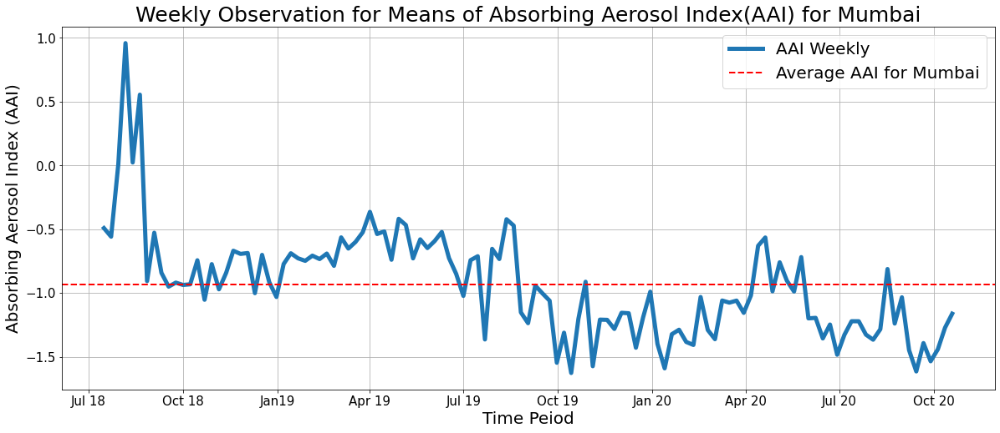

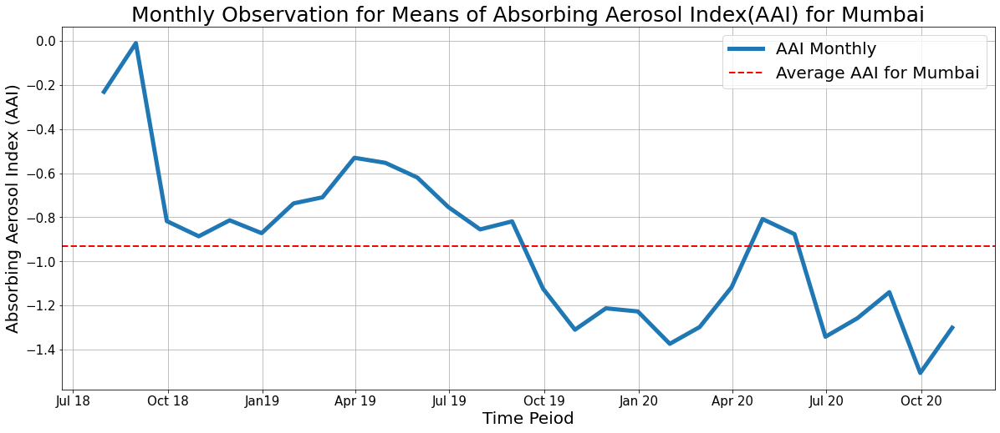

In [18]:
# Visualizing by grouping into weeekly data
plt.figure(figsize = (20,8))
plt.plot( Weekly_Mumbai_mean.index.tolist(),Weekly_Mumbai_mean["mean"], linewidth = 5, label = "AAI Weekly")
plt.gca().axhline(y=Weekly_Mumbai_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Mumbai")
plt.title("Weekly Observation for Means of Absorbing Aerosol Index(AAI) for Mumbai",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

# Visualizing by grouping into Monthly data
plt.figure(figsize = (20,8))
plt.plot( Monthly_Mumbai_mean.index.tolist(),Monthly_Mumbai_mean["mean"], linewidth = 5, label = "AAI Monthly")
plt.gca().axhline(y=Monthly_Mumbai_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Mumbai")
plt.title("Monthly Observation for Means of Absorbing Aerosol Index(AAI) for Mumbai",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

**We will now plot some useful insights with Monthly Data**

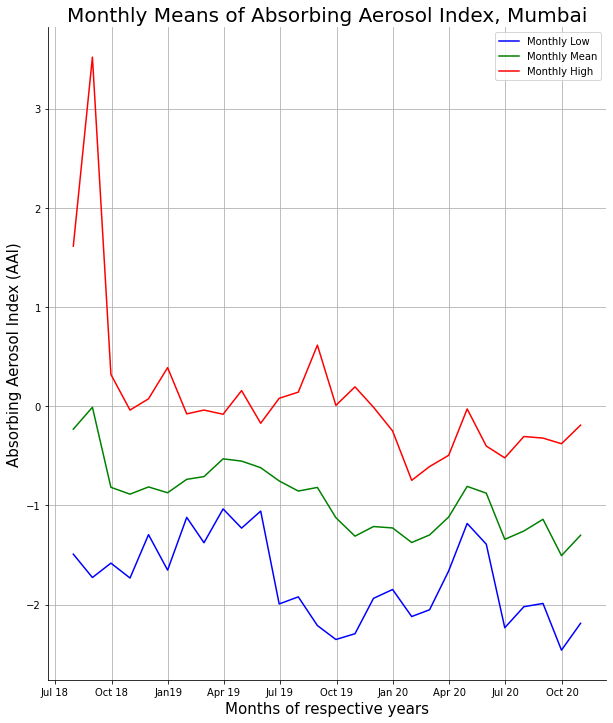

In [19]:
# Plotting Monthly means 
plt.figure(figsize=(10,12))
plt.plot(list(Monthly_Mumbai_min.index),list(Monthly_Mumbai_min["mean"]), label = "Monthly Low", color = "blue" )
plt.plot(list(Monthly_Mumbai_mean.index),list(Monthly_Mumbai_mean["mean"]), label= "Monthly Mean" , color ="green")
plt.plot(list(Monthly_Mumbai_max.index),list(Monthly_Mumbai_max["mean"]), label = "Monthly High", color = "red" )

plt.xlabel("Months of respective years",fontsize= 15)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Monthly Means of Absorbing Aerosol Index, Mumbai",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 15)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels)
plt.legend()
plt.grid()


We can observe that Aerosol Optical Depth has decreased in the past year. The change in policies, Even Odd Rule and Coronavirus Pandemic seems to have shifted the curve down.

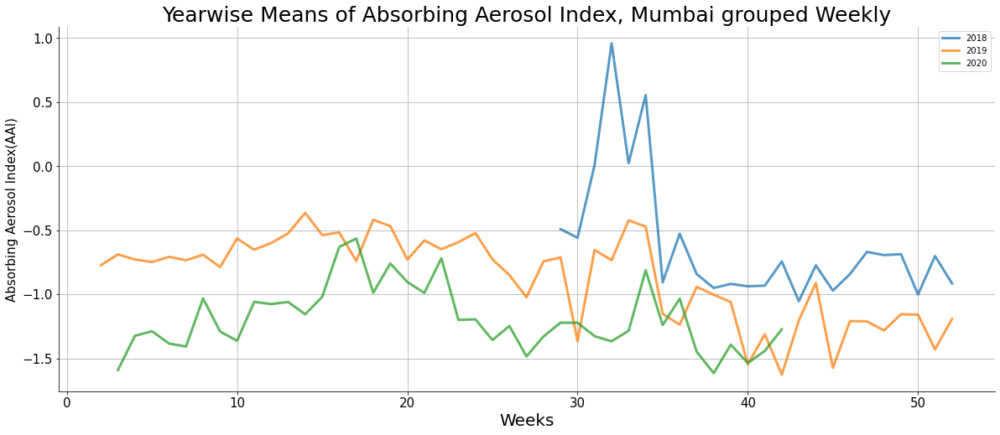

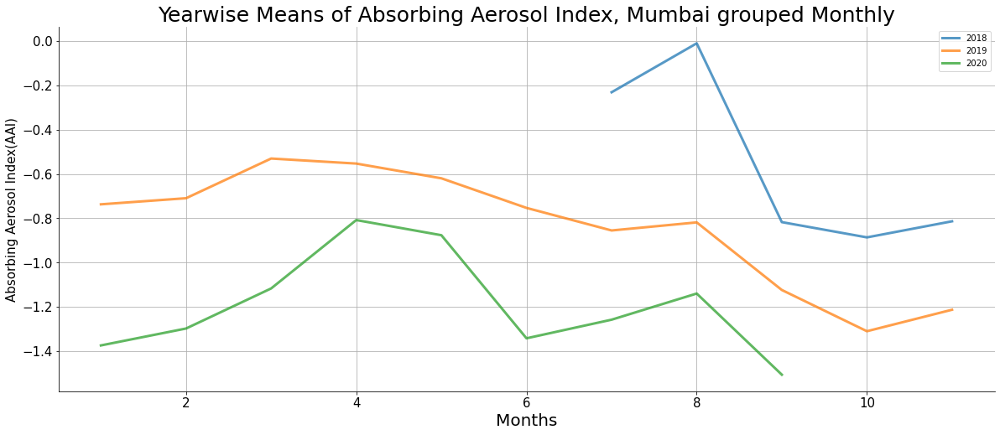

In [20]:
# Plotting Yearwise means
x = [i for i in range(1,13)]
plt.figure(figsize = (20,8))
plt.plot(Weekly_Mumbai_mean[Weekly_Mumbai_mean["year"] == 2018]["week"].tolist()[:-1],Weekly_Mumbai_mean[Weekly_Mumbai_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Weekly_Mumbai_mean[Weekly_Mumbai_mean["year"] == 2019]["week"].tolist()[:-1],Weekly_Mumbai_mean[Weekly_Mumbai_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Weekly_Mumbai_mean[Weekly_Mumbai_mean["year"] == 2020]["week"].tolist()[:-1],Weekly_Mumbai_mean[Weekly_Mumbai_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Weeks",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Yearwise Means of Absorbing Aerosol Index, Mumbai grouped Weekly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.grid()
plt.legend()

plt.figure(figsize = (20,8))
plt.plot(Monthly_Mumbai_mean[Monthly_Mumbai_mean["year"] == 2018]["month"].tolist()[:-1],Monthly_Mumbai_mean[Monthly_Mumbai_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Monthly_Mumbai_mean[Monthly_Mumbai_mean["year"] == 2019]["month"].tolist()[:-1],Monthly_Mumbai_mean[Monthly_Mumbai_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Monthly_Mumbai_mean[Monthly_Mumbai_mean["year"] == 2020]["month"].tolist()[:-1],Monthly_Mumbai_mean[Monthly_Mumbai_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Months",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.title("Yearwise Means of Absorbing Aerosol Index, Mumbai grouped Monthly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.grid()
plt.legend()

The observation from the above graph is that, the Absorbing Aerosol Index values have come down considerably in the last two years. From the graph it is evident that the Aerosol Index values are lesser in 2020. Therefore it can be concluded that the polution in Delhi has been lower in 2020 compared to the previous two years.

### Plotting Maps For Insights

In [21]:
# Grouping by Wards Data for further analysis
Mumbai_wards = df["Mumbai"].groupby(["Ward_No"]).mean()
Mumbai_wards

,mean
Ward_No,
1,-0.972569
2,-0.943850
3,-0.946406
4,-0.965683
5,-0.937518
6,-0.928589
7,-0.940254
8,-0.912056
9,-0.907992


<AxesSubplot:>

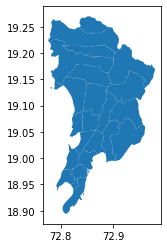

In [22]:
# loading the shapefile
path = r'Cleaned CSVs/Mumbai/BMC_Wards-polygon.shp'
map_Mumbai = gpd.read_file(path)
# Viewing the shapefile
map_Mumbai.plot()

In [23]:
# merging the shapefile with the mean data
merged_Mumbai = map_Mumbai.merge(Mumbai_wards, left_on = "gid", right_index = True)
# merged_Mumbai.head()
merged_Mumbai

,gid,name,geometry,mean
0,1,A,"POLYGON ((72.84025 18.94881, 72.84030 18.94880...",-0.972569
1,2,B,"POLYGON ((72.84456 18.96342, 72.84461 18.96342...",-0.943850
2,3,C,"POLYGON ((72.83198 18.96174, 72.83197 18.96164...",-0.946406
3,4,D,"POLYGON ((72.81873 18.96901, 72.81878 18.96900...",-0.965683
4,5,E,"POLYGON ((72.84677 18.98183, 72.84658 18.98143...",-0.937518
5,6,F/S,"POLYGON ((72.85625 19.01059, 72.85630 19.01053...",-0.928589
6,7,G/S,"POLYGON ((72.82689 19.01942, 72.82691 19.01940...",-0.940254
7,8,F/N,"POLYGON ((72.87091 19.05119, 72.87103 19.05113...",-0.912056
8,9,G/N,"POLYGON ((72.86699 19.05237, 72.86738 19.05237...",-0.907992
9,10,N,"POLYGON ((72.91670 19.10911, 72.91659 19.10893...",-0.914665


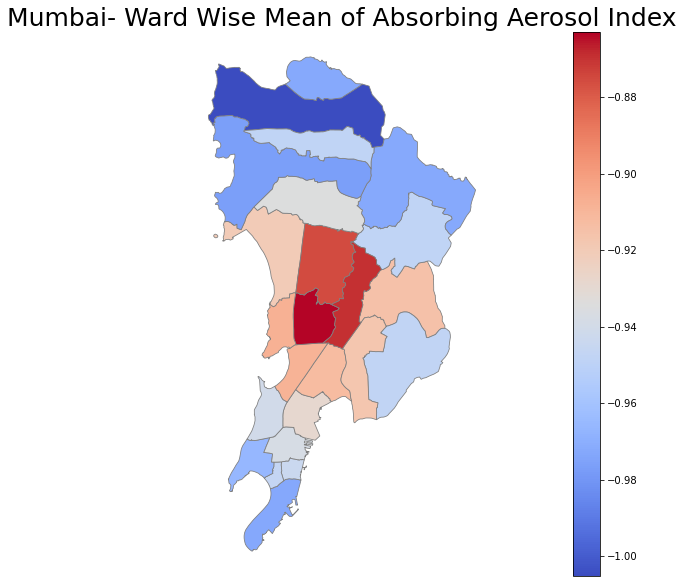

In [24]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values
vmin, vmax = merged_Mumbai["mean"].min(), merged_Mumbai["mean"].max()
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(30, 10))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('Mumbai- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='coolwarm',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 
# empty array for the data range
sm.set_array([]) 
# add the colorbar to the figure
fig.colorbar(sm)
# create map
merged_Mumbai.plot(column=variable, cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.5', figsize = (5,15))
plt.show()

In [25]:
# Using T-Test to determine if climate has changed in the first 14 and last 14 months in Mumbai
ttest_ind(Monthly_Mumbai_mean.iloc[:14,:]["mean"].tolist(),Monthly_Mumbai_mean.iloc[14:,:]["mean"].tolist())

Ttest_indResult(statistic=6.458902618381275, pvalue=7.61736056158904e-07)

**We observe that Pollution levels has decreased in the last 14 months and the statistical test proves the same with a very small p-value for 95 % Confidence Interval**

## City Number 3: Pune

### Loading and Visualizing

In [26]:
# g = df1.groupby(pd.Grouper(freq="M"))
# g.mean()
Pune = df["Pune"].groupby(["date"]).mean()
Pune["month"] = Pune.index.month
Pune["year"] = Pune.index.year
Pune

,mean,Ward_No,month,year
date,,,,
2018-07-11,-0.611108,8,7,2018
2018-07-12,-0.883853,8,7,2018
2018-07-13,-0.807581,8,7,2018
2018-07-14,-1.678436,8,7,2018
2018-07-15,-1.032795,8,7,2018
...,...,...,...,...
2020-10-09,-0.907531,8,10,2020
2020-10-10,-1.887800,8,10,2020
2020-10-11,-1.128160,8,10,2020


In [27]:
# Aggregate statistics grouped by Weeks
Weekly_Pune_mean = Pune.groupby(pd.Grouper(freq="W-MON")).mean()
Weekly_Pune_max = Pune.groupby(pd.Grouper(freq="W-MON")).max()
Weekly_Pune_min = Pune.groupby(pd.Grouper(freq="W-MON")).min()

# Aggregate statistics grouped by Months
Monthly_Pune_mean = Pune.groupby(pd.Grouper(freq="M")).mean()
Monthly_Pune_max = Pune.groupby(pd.Grouper(freq="M")).max()
Monthly_Pune_min = Pune.groupby(pd.Grouper(freq="M")).min()

#Week Identifier
Weekly_Pune_mean["week"] = Weekly_Pune_mean.index.isocalendar().week
Weekly_Pune_min["week"] = Weekly_Pune_min.index.isocalendar().week
Weekly_Pune_max["week"] = Weekly_Pune_max.index.isocalendar().week

Monthly_Pune_mean["week"] = Monthly_Pune_mean.index.isocalendar().week
Monthly_Pune_min["week"] = Monthly_Pune_min.index.isocalendar().week
Monthly_Pune_max["week"] = Monthly_Pune_max.index.isocalendar().week

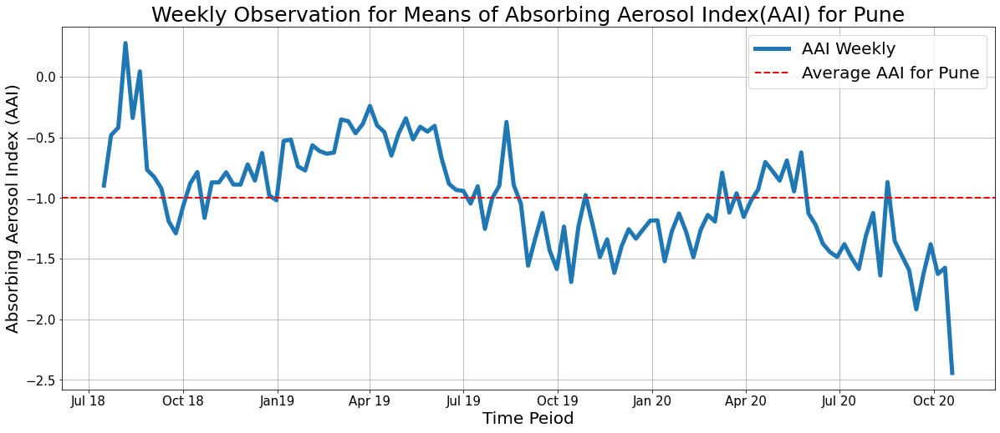

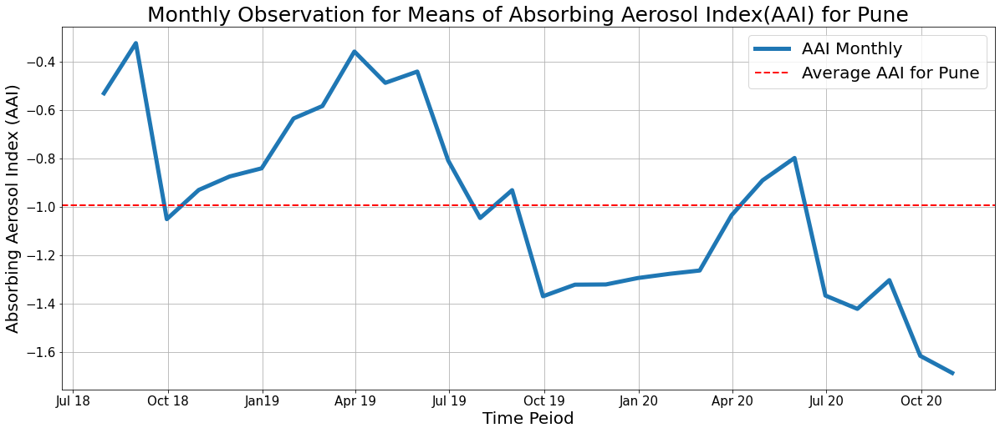

In [28]:
# Visualizing by grouping into weeekly data
plt.figure(figsize = (20,8))
plt.plot( Weekly_Pune_mean.index.tolist(),Weekly_Pune_mean["mean"], linewidth = 5, label = "AAI Weekly")
plt.gca().axhline(y=Weekly_Pune_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Pune")
plt.title("Weekly Observation for Means of Absorbing Aerosol Index(AAI) for Pune",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

# Visualizing by grouping into Monthly data
plt.figure(figsize = (20,8))
plt.plot( Monthly_Pune_mean.index.tolist(),Monthly_Pune_mean["mean"], linewidth = 5, label = "AAI Monthly")
plt.gca().axhline(y=Monthly_Pune_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Pune")
plt.title("Monthly Observation for Means of Absorbing Aerosol Index(AAI) for Pune",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

**We will now plot some useful insights with Monthly Data**

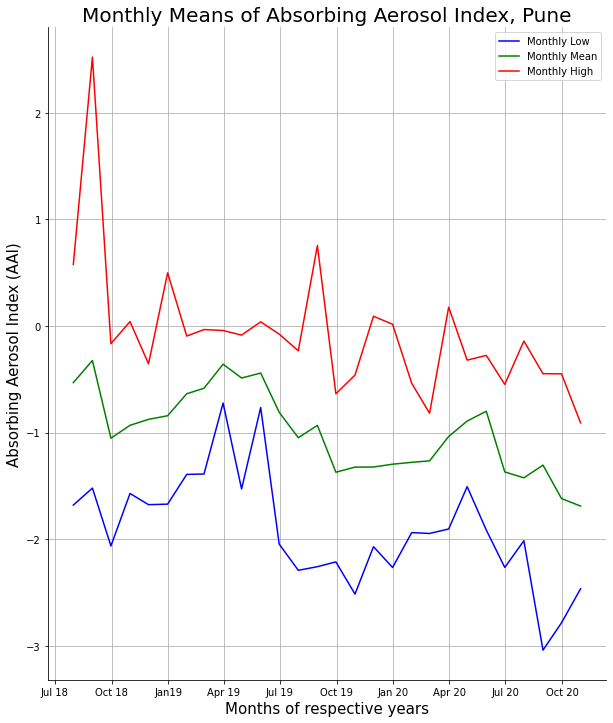

In [29]:
# Plotting Monthly means 
plt.figure(figsize=(10,12))
plt.plot(list(Monthly_Pune_min.index),list(Monthly_Pune_min["mean"]), label = "Monthly Low", color = "blue" )
plt.plot(list(Monthly_Pune_mean.index),list(Monthly_Pune_mean["mean"]), label= "Monthly Mean" , color ="green")
plt.plot(list(Monthly_Pune_max.index),list(Monthly_Pune_max["mean"]), label = "Monthly High", color = "red" )

plt.xlabel("Months of respective years",fontsize= 15)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Monthly Means of Absorbing Aerosol Index, Pune",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 15)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels)
plt.legend()
plt.grid()


We can observe that Aerosol Optical Depth has decreased in the past year. The change in policies, Even Odd Rule and Coronavirus Pandemic seems to have shifted the curve down.

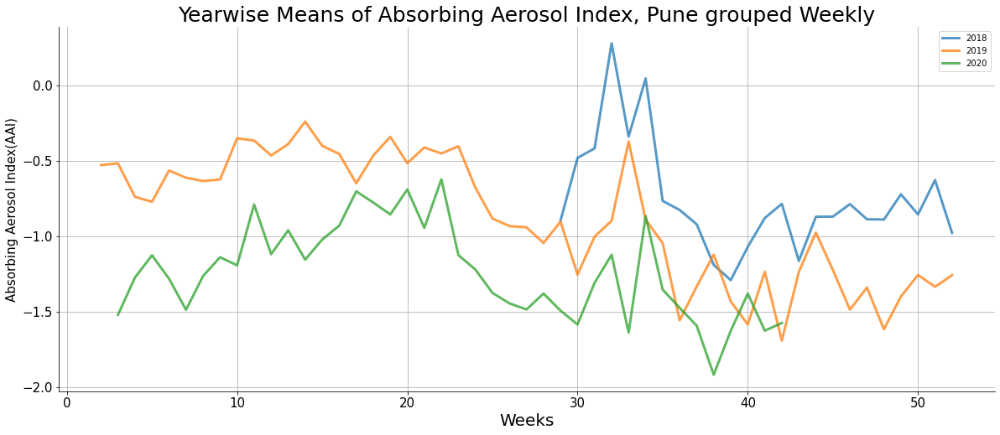

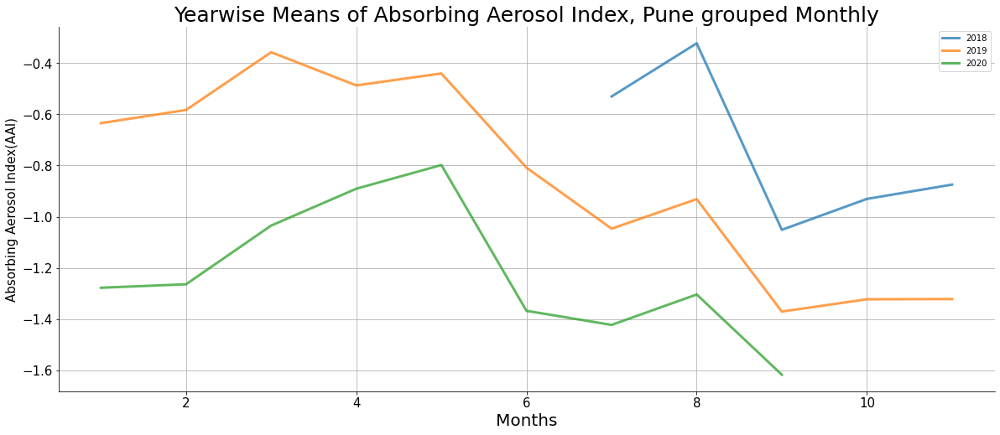

In [30]:
# Plotting Yearwise means
x = [i for i in range(1,13)]
plt.figure(figsize = (20,8))
plt.plot(Weekly_Pune_mean[Weekly_Pune_mean["year"] == 2018]["week"].tolist()[:-1],Weekly_Pune_mean[Weekly_Pune_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Weekly_Pune_mean[Weekly_Pune_mean["year"] == 2019]["week"].tolist()[:-1],Weekly_Pune_mean[Weekly_Pune_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Weekly_Pune_mean[Weekly_Pune_mean["year"] == 2020]["week"].tolist()[:-1],Weekly_Pune_mean[Weekly_Pune_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Weeks",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Yearwise Means of Absorbing Aerosol Index, Pune grouped Weekly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.grid()
plt.legend()

plt.figure(figsize = (20,8))
plt.plot(Monthly_Pune_mean[Monthly_Pune_mean["year"] == 2018]["month"].tolist()[:-1],Monthly_Pune_mean[Monthly_Pune_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Monthly_Pune_mean[Monthly_Pune_mean["year"] == 2019]["month"].tolist()[:-1],Monthly_Pune_mean[Monthly_Pune_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Monthly_Pune_mean[Monthly_Pune_mean["year"] == 2020]["month"].tolist()[:-1],Monthly_Pune_mean[Monthly_Pune_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Months",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.title("Yearwise Means of Absorbing Aerosol Index, Pune grouped Monthly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.grid()
plt.legend()

The observation from the above graph is that, the Absorbing Aerosol Index values have come down considerably in the last two years. From the graph it is evident that the Aerosol Index values are lesser in 2020. Therefore it can be concluded that the polution in Delhi has been lower in 2020 compared to the previous two years.

### Plotting Maps For Insights

In [31]:
# Grouping by Wards Data for further analysis
Pune_wards = df["Pune"].groupby(["Ward_No"]).mean()
Pune_wards

,mean
Ward_No,
1,-1.015877
2,-1.011385
3,-1.021526
4,-0.992819
5,-0.983372
6,-0.984705
7,-0.964731
8,-0.984172
9,-0.972935


<AxesSubplot:>

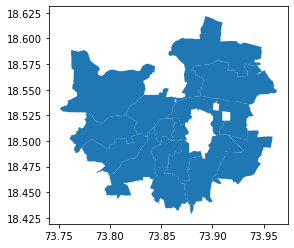

In [32]:
# loading the shapefile
path = r'Cleaned CSVs/Pune/pune-admin-wards-polygon.shp'
map_Pune = gpd.read_file(path)
map_Pune["Ward_No"] = [i for i in range(1,16)]
# Viewing the shapefile
map_Pune.plot()

In [33]:
# merging the shapefile with the mean data
merged_Pune = map_Pune.merge(Pune_wards, left_on = "Ward_No", right_index = True)
# merged_Pune.head()
merged_Pune

,name,geometry,Ward_No,mean
0,Admin Ward 01 Aundh,"POLYGON ((73.82476 18.53713, 73.82464 18.53704...",1,-1.015877
1,Admin Ward 02 Ghole Road,"POLYGON ((73.86190 18.53324, 73.86131 18.53207...",2,-1.011385
2,Admin Ward 03 Kothrud Karveroad,"POLYGON ((73.77529 18.49650, 73.77416 18.49594...",3,-1.021526
3,Admin Ward 04 Warje Karvenagar,"POLYGON ((73.81155 18.47852, 73.81078 18.47732...",4,-0.992819
4,Admin Ward 05 Dhole Patil Rd,"POLYGON ((73.88839 18.54376, 73.88864 18.54376...",5,-0.983372
5,Admin Ward 06 Yerawda - Sangamwadi,"POLYGON ((73.87439 18.55410, 73.87464 18.55532...",6,-0.984705
6,Admin Ward 07 Nagar Road,"POLYGON ((73.88859 18.54538, 73.88872 18.54556...",7,-0.964731
7,Admin Ward 08 KasbaVishrambaugwada,"POLYGON ((73.85081 18.50257, 73.85084 18.50156...",8,-0.984172
8,Admin Ward 09 Tilak Road,"POLYGON ((73.82598 18.48445, 73.82600 18.48450...",9,-0.972935
9,Admin Ward 10 Sahakarnagar,"POLYGON ((73.86339 18.48789, 73.86334 18.48622...",10,-0.957330


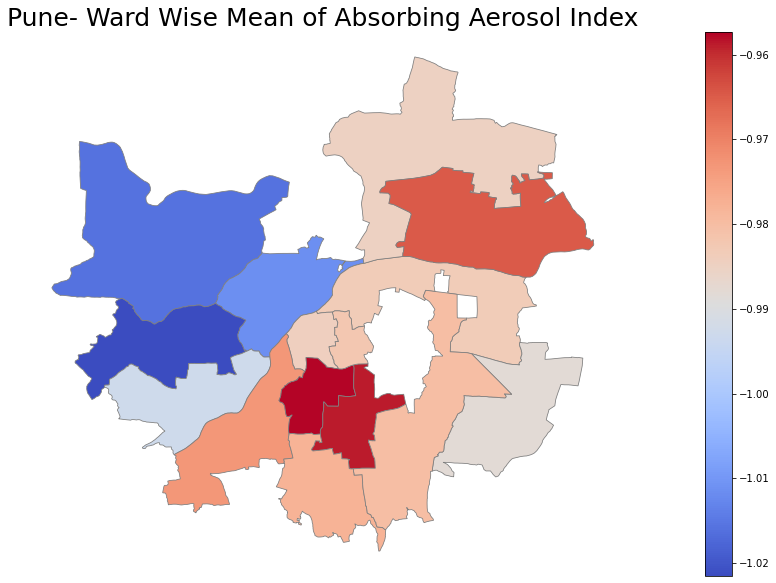

In [34]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values
vmin, vmax = merged_Pune["mean"].min(), merged_Pune["mean"].max()
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(30, 10))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('Pune- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='coolwarm',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 
# empty array for the data range
sm.set_array([]) 
# add the colorbar to the figure
fig.colorbar(sm)
# create map
merged_Pune.plot(column=variable, cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.5', figsize = (5,15))
plt.show()

In [35]:
# Using T-Test to determine if climate has changed in the first 14 and last 14 months in Pune
ttest_ind(Monthly_Pune_mean.iloc[:14,:]["mean"].tolist(),Monthly_Pune_mean.iloc[14:,:]["mean"].tolist())

Ttest_indResult(statistic=6.204768266156896, pvalue=1.4549075945828928e-06)

**We observe that Pollution levels has decreased in the last 14 months and the statistical test proves the same with a very small p-value for 95 % Confidence Interval**

## City Number 4 Ahmedabad

### Loading and Visualizing

In [36]:
# g = df1.groupby(pd.Grouper(freq="M"))
# g.mean()
Ahmedabad = df["Ahmedabad"].groupby(["date"]).mean()
Ahmedabad["month"] = Ahmedabad.index.month
Ahmedabad["year"] = Ahmedabad.index.year
Ahmedabad

,mean,Ward_No,month,year
date,,,,
2018-07-11,-0.286013,24.5,7,2018
2018-07-12,-0.496056,24.5,7,2018
2018-07-13,-1.052356,24.5,7,2018
2018-07-14,-1.225006,24.5,7,2018
2018-07-15,-0.997644,24.5,7,2018
...,...,...,...,...
2020-10-09,-0.737113,24.5,10,2020
2020-10-10,-0.712917,24.5,10,2020
2020-10-11,-1.143606,24.5,10,2020


In [37]:
# Aggregate statistics grouped by Weeks
Weekly_Ahmedabad_mean = Ahmedabad.groupby(pd.Grouper(freq="W-MON")).mean()
Weekly_Ahmedabad_max = Ahmedabad.groupby(pd.Grouper(freq="W-MON")).max()
Weekly_Ahmedabad_min = Ahmedabad.groupby(pd.Grouper(freq="W-MON")).min()

# Aggregate statistics grouped by Months
Monthly_Ahmedabad_mean = Ahmedabad.groupby(pd.Grouper(freq="M")).mean()
Monthly_Ahmedabad_max = Ahmedabad.groupby(pd.Grouper(freq="M")).max()
Monthly_Ahmedabad_min = Ahmedabad.groupby(pd.Grouper(freq="M")).min()

#Week Identifier
Weekly_Ahmedabad_mean["week"] = Weekly_Ahmedabad_mean.index.isocalendar().week
Weekly_Ahmedabad_min["week"] = Weekly_Ahmedabad_min.index.isocalendar().week
Weekly_Ahmedabad_max["week"] = Weekly_Ahmedabad_max.index.isocalendar().week

Monthly_Ahmedabad_mean["week"] = Monthly_Ahmedabad_mean.index.isocalendar().week
Monthly_Ahmedabad_min["week"] = Monthly_Ahmedabad_min.index.isocalendar().week
Monthly_Ahmedabad_max["week"] = Monthly_Ahmedabad_max.index.isocalendar().week

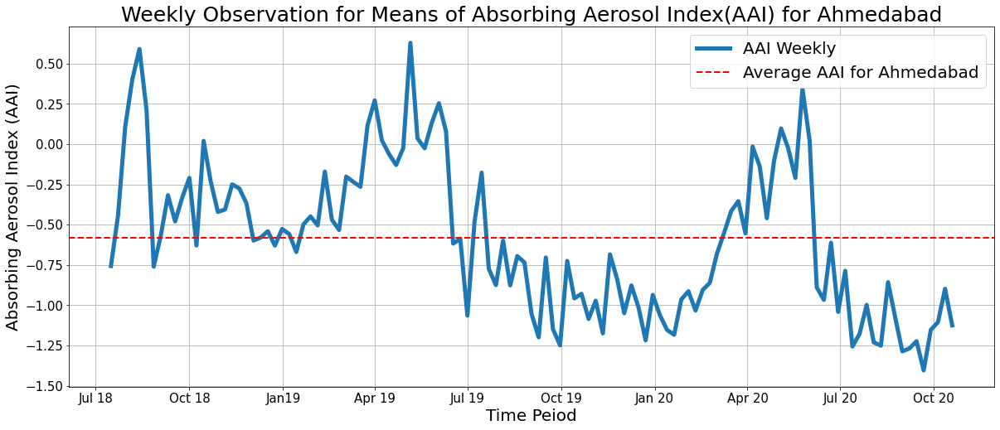

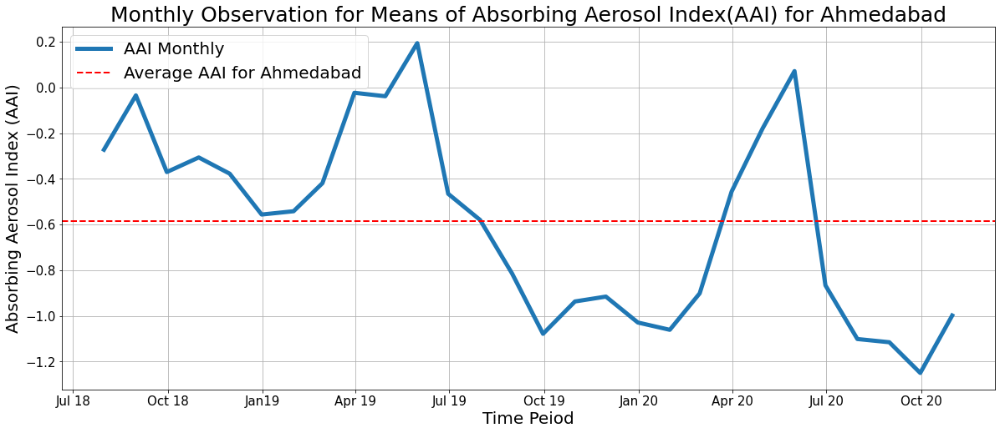

In [38]:
# Visualizing by grouping into weeekly data
plt.figure(figsize = (20,8))
plt.plot( Weekly_Ahmedabad_mean.index.tolist(),Weekly_Ahmedabad_mean["mean"], linewidth = 5, label = "AAI Weekly")
plt.gca().axhline(y=Weekly_Ahmedabad_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Ahmedabad")
plt.title("Weekly Observation for Means of Absorbing Aerosol Index(AAI) for Ahmedabad",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

# Visualizing by grouping into Monthly data
plt.figure(figsize = (20,8))
plt.plot( Monthly_Ahmedabad_mean.index.tolist(),Monthly_Ahmedabad_mean["mean"], linewidth = 5, label = "AAI Monthly")
plt.gca().axhline(y=Monthly_Ahmedabad_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Ahmedabad")
plt.title("Monthly Observation for Means of Absorbing Aerosol Index(AAI) for Ahmedabad",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

**We will now plot some useful insights with Monthly Data**

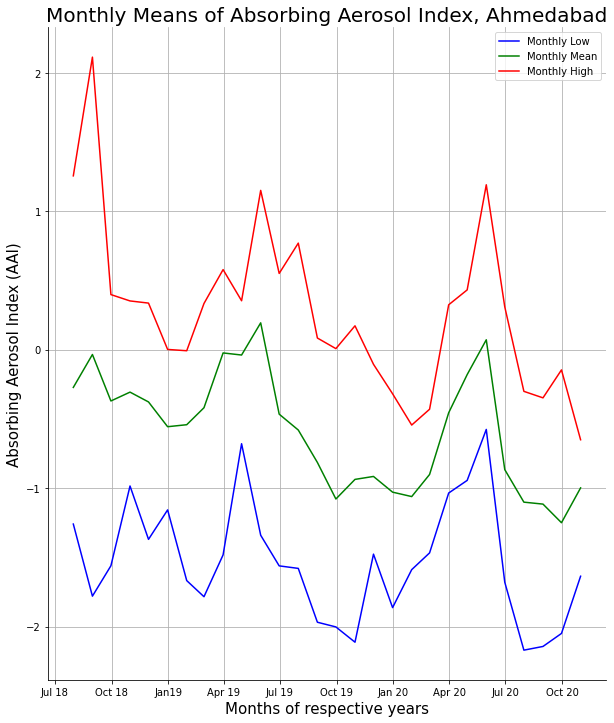

In [39]:
# Plotting Monthly means 
plt.figure(figsize=(10,12))
plt.plot(list(Monthly_Ahmedabad_min.index),list(Monthly_Ahmedabad_min["mean"]), label = "Monthly Low", color = "blue" )
plt.plot(list(Monthly_Ahmedabad_mean.index),list(Monthly_Ahmedabad_mean["mean"]), label= "Monthly Mean" , color ="green")
plt.plot(list(Monthly_Ahmedabad_max.index),list(Monthly_Ahmedabad_max["mean"]), label = "Monthly High", color = "red" )

plt.xlabel("Months of respective years",fontsize= 15)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Monthly Means of Absorbing Aerosol Index, Ahmedabad",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 15)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels)
plt.legend()
plt.grid()


We can observe that Aerosol Optical Depth has decreased in the past year. The change in policies, Even Odd Rule and Coronavirus Pandemic seems to have shifted the curve down.

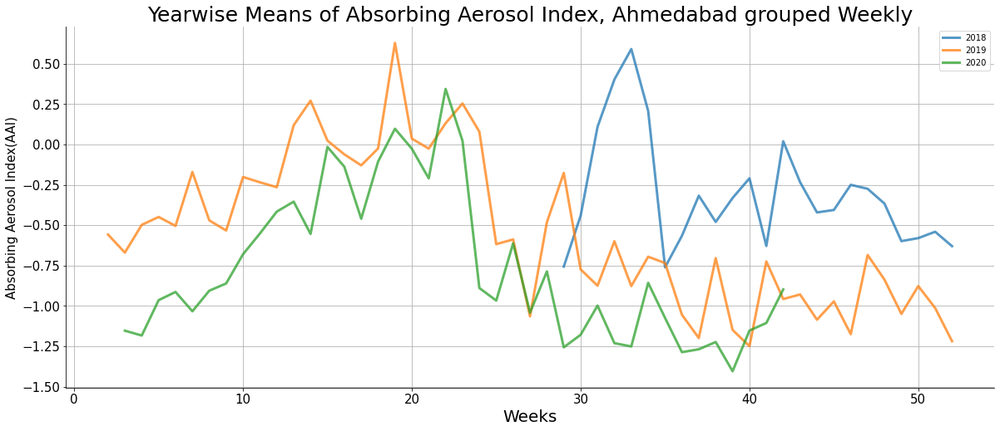

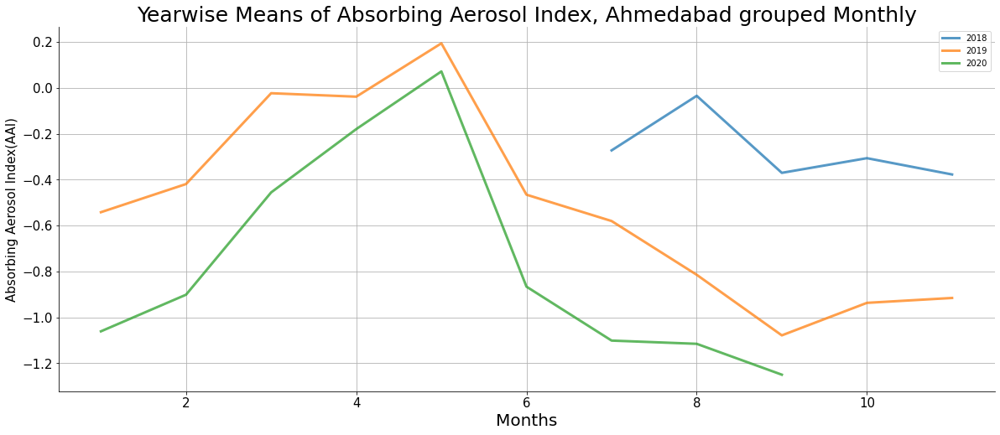

In [40]:
# Plotting Yearwise means
x = [i for i in range(1,13)]
plt.figure(figsize = (20,8))
plt.plot(Weekly_Ahmedabad_mean[Weekly_Ahmedabad_mean["year"] == 2018]["week"].tolist()[:-1],Weekly_Ahmedabad_mean[Weekly_Ahmedabad_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Weekly_Ahmedabad_mean[Weekly_Ahmedabad_mean["year"] == 2019]["week"].tolist()[:-1],Weekly_Ahmedabad_mean[Weekly_Ahmedabad_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Weekly_Ahmedabad_mean[Weekly_Ahmedabad_mean["year"] == 2020]["week"].tolist()[:-1],Weekly_Ahmedabad_mean[Weekly_Ahmedabad_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Weeks",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Yearwise Means of Absorbing Aerosol Index, Ahmedabad grouped Weekly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.grid()
plt.legend()

plt.figure(figsize = (20,8))
plt.plot(Monthly_Ahmedabad_mean[Monthly_Ahmedabad_mean["year"] == 2018]["month"].tolist()[:-1],Monthly_Ahmedabad_mean[Monthly_Ahmedabad_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Monthly_Ahmedabad_mean[Monthly_Ahmedabad_mean["year"] == 2019]["month"].tolist()[:-1],Monthly_Ahmedabad_mean[Monthly_Ahmedabad_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Monthly_Ahmedabad_mean[Monthly_Ahmedabad_mean["year"] == 2020]["month"].tolist()[:-1],Monthly_Ahmedabad_mean[Monthly_Ahmedabad_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Months",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.title("Yearwise Means of Absorbing Aerosol Index, Ahmedabad grouped Monthly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.grid()
plt.legend()

The observation from the above graph is that, the Absorbing Aerosol Index values have come down considerably in the last two years. From the graph it is evident that the Aerosol Index values are lesser in 2020. Therefore it can be concluded that the polution in Delhi has been lower in 2020 compared to the previous two years.

### Plotting Maps For Insights

In [41]:
# Grouping by Wards Data for further analysis
Ahmedabad_wards = df["Ahmedabad"].groupby(["Ward_No"]).mean()
Ahmedabad_wards

,mean
Ward_No,
1,-0.709633
2,-0.666840
3,-0.734087
4,-0.656032
5,-0.577231
6,-0.520955
7,-0.513250
8,-0.701475
9,-0.495739


<AxesSubplot:>

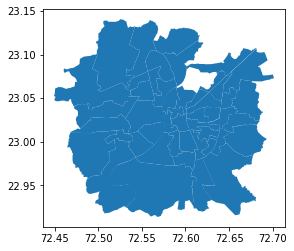

In [42]:
# loading the shapefile
path = r'Cleaned CSVs/Ahmedabad/Wards-polygon.shp'
map_Ahmedabad = gpd.read_file(path)
x = map_Ahmedabad["Name"].tolist()
map_Ahmedabad["Ward_No"] = [i[:2] for i in x]
map_Ahmedabad["Ward_No"] =(map_Ahmedabad["Ward_No"]).astype(int)
# Viewing the shapefile
map_Ahmedabad.plot()

In [43]:
# merging the shapefile with the mean data
merged_Ahmedabad = map_Ahmedabad.merge(Ahmedabad_wards, left_on = "Ward_No", right_index = True)
# merged_Ahmedabad.head()
merged_Ahmedabad

,Name,geometry,Ward_No,mean
0,48 RAMOL HATHIJAN,"POLYGON Z ((72.64795 22.99784 0.00000, 72.6500...",48,-0.761592
1,47 VATVA,"POLYGON Z ((72.61962 22.98128 0.00000, 72.6211...",47,-0.720290
2,46 LAMBHA,"POLYGON Z ((72.58829 22.97285 0.00000, 72.5909...",46,-0.748029
3,45 ISANPUR,"POLYGON Z ((72.60390 22.98860 0.00000, 72.6092...",45,-0.547657
4,44 KHOKHRA,"POLYGON Z ((72.60813 23.01394 0.00000, 72.6092...",44,-0.508749
5,43 BHAIPURA HATKESHWAR,"POLYGON Z ((72.62793 23.00426 0.00000, 72.6284...",43,-0.524201
6,42 INDRAPURI,"POLYGON Z ((72.64074 23.01490 0.00000, 72.6418...",42,-0.537350
7,41 VASTRAL,"POLYGON Z ((72.67465 23.01994 0.00000, 72.6747...",41,-0.671548
8,40 ODHAV,"POLYGON Z ((72.66042 23.03202 0.00000, 72.6610...",40,-0.566312
9,39 AMRAIWADI,"POLYGON Z ((72.62154 23.01715 0.00000, 72.6218...",39,-0.491315


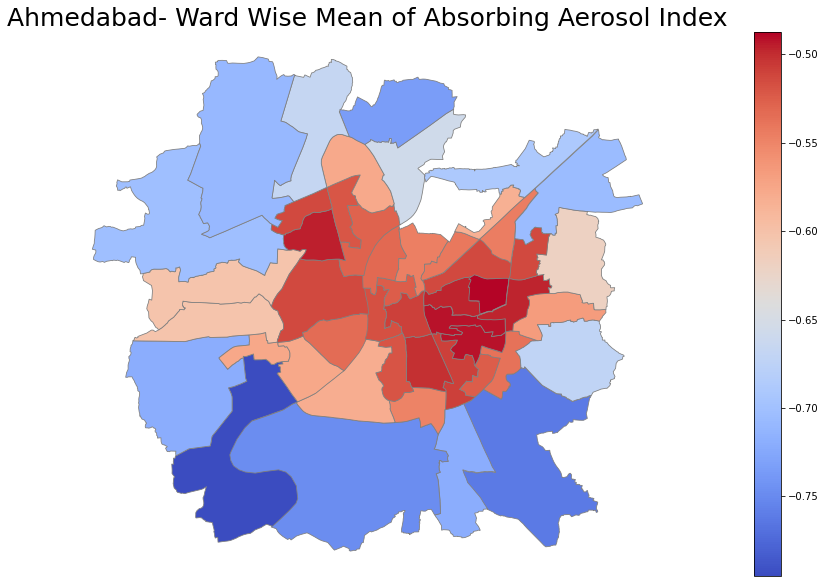

In [44]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values
vmin, vmax = merged_Ahmedabad["mean"].min(), merged_Ahmedabad["mean"].max()
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(30, 10))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('Ahmedabad- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='coolwarm',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 
# empty array for the data range
sm.set_array([]) 
# add the colorbar to the figure
fig.colorbar(sm)
# create map
merged_Ahmedabad.plot(column=variable, cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.5', figsize = (5,15))
plt.show()

In [45]:
# Using T-Test to determine if climate has changed in the first 14 and last 14 months in Ahmedabad
ttest_ind(Monthly_Ahmedabad_mean.iloc[:14,:]["mean"].tolist(),Monthly_Ahmedabad_mean.iloc[14:,:]["mean"].tolist())

Ttest_indResult(statistic=4.093274734894954, pvalue=0.0003664231460856578)

**We observe that Pollution levels has decreased in the last 14 months and the statistical test proves the same with a very small p-value for 95 % Confidence Interval**

## City Number 5 Bangalore

### Loading and Visualizing

In [46]:
# g = df1.groupby(pd.Grouper(freq="M"))
# g.mean()
Bangalore = df["Bangalore"].groupby(["date"]).mean()
Bangalore["month"] = Bangalore.index.month
Bangalore["year"] = Bangalore.index.year
Bangalore

,Ward_No,mean,month,year
date,,,,
2018-07-11,99.5,-0.456807,7,2018
2018-07-12,99.5,-0.425492,7,2018
2018-07-13,99.5,-0.235959,7,2018
2018-07-14,99.5,-1.893831,7,2018
2018-07-15,99.5,-0.984660,7,2018
...,...,...,...,...
2020-10-09,99.5,-0.970991,10,2020
2020-10-10,99.5,-0.937902,10,2020
2020-10-11,99.5,-1.491334,10,2020


In [47]:
# Aggregate statistics grouped by Weeks
Weekly_Bangalore_mean = Bangalore.groupby(pd.Grouper(freq="W-MON")).mean()
Weekly_Bangalore_max = Bangalore.groupby(pd.Grouper(freq="W-MON")).max()
Weekly_Bangalore_min = Bangalore.groupby(pd.Grouper(freq="W-MON")).min()

# Aggregate statistics grouped by Months
Monthly_Bangalore_mean = Bangalore.groupby(pd.Grouper(freq="M")).mean()
Monthly_Bangalore_max = Bangalore.groupby(pd.Grouper(freq="M")).max()
Monthly_Bangalore_min = Bangalore.groupby(pd.Grouper(freq="M")).min()

#Week Identifier
Weekly_Bangalore_mean["week"] = Weekly_Bangalore_mean.index.isocalendar().week
Weekly_Bangalore_min["week"] = Weekly_Bangalore_min.index.isocalendar().week
Weekly_Bangalore_max["week"] = Weekly_Bangalore_max.index.isocalendar().week

Monthly_Bangalore_mean["week"] = Monthly_Bangalore_mean.index.isocalendar().week
Monthly_Bangalore_min["week"] = Monthly_Bangalore_min.index.isocalendar().week
Monthly_Bangalore_max["week"] = Monthly_Bangalore_max.index.isocalendar().week

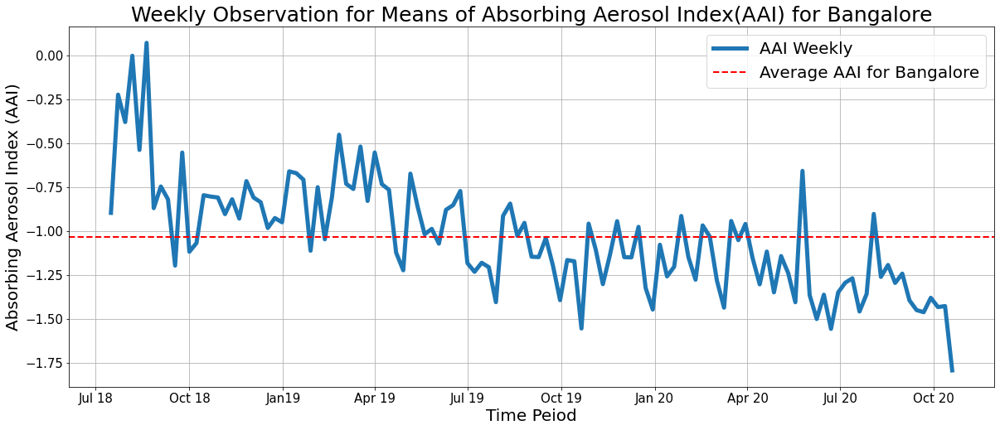

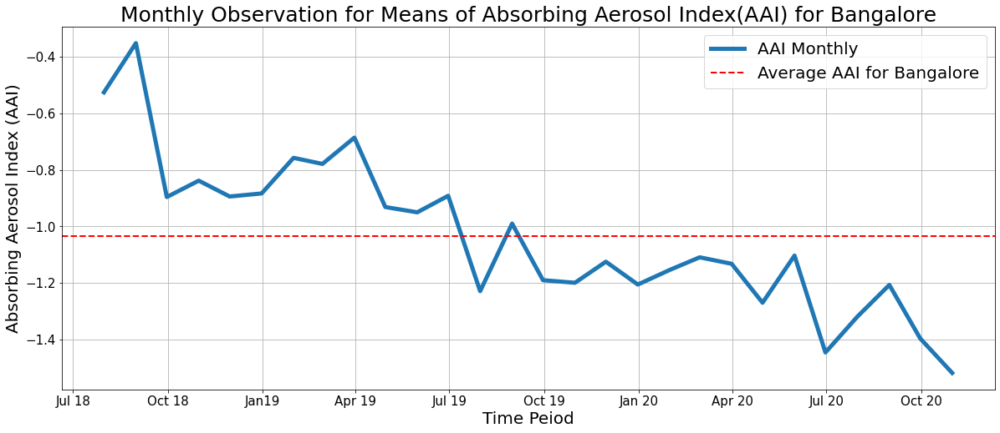

In [48]:
# Visualizing by grouping into weeekly data
plt.figure(figsize = (20,8))
plt.plot( Weekly_Bangalore_mean.index.tolist(),Weekly_Bangalore_mean["mean"], linewidth = 5, label = "AAI Weekly")
plt.gca().axhline(y=Weekly_Bangalore_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Bangalore")
plt.title("Weekly Observation for Means of Absorbing Aerosol Index(AAI) for Bangalore",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

# Visualizing by grouping into Monthly data
plt.figure(figsize = (20,8))
plt.plot( Monthly_Bangalore_mean.index.tolist(),Monthly_Bangalore_mean["mean"], linewidth = 5, label = "AAI Monthly")
plt.gca().axhline(y=Monthly_Bangalore_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Bangalore")
plt.title("Monthly Observation for Means of Absorbing Aerosol Index(AAI) for Bangalore",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

**We will now plot some useful insights with Monthly Data**

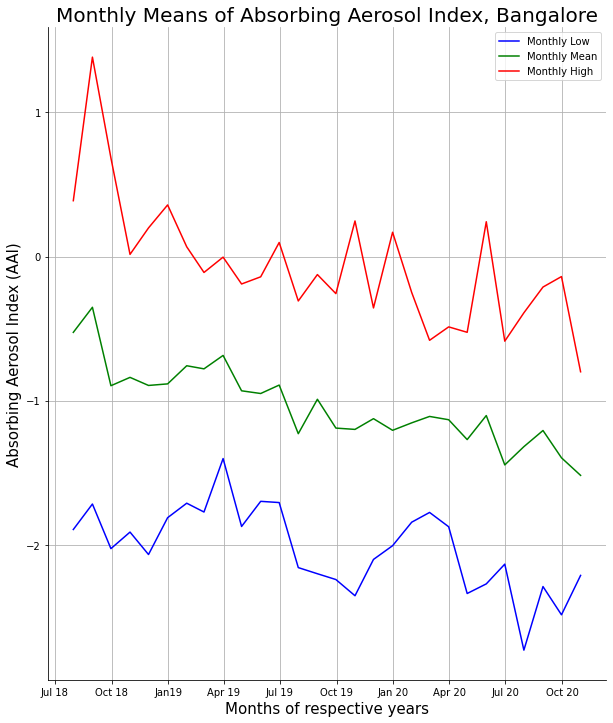

In [49]:
# Plotting Monthly means 
plt.figure(figsize=(10,12))
plt.plot(list(Monthly_Bangalore_min.index),list(Monthly_Bangalore_min["mean"]), label = "Monthly Low", color = "blue" )
plt.plot(list(Monthly_Bangalore_mean.index),list(Monthly_Bangalore_mean["mean"]), label= "Monthly Mean" , color ="green")
plt.plot(list(Monthly_Bangalore_max.index),list(Monthly_Bangalore_max["mean"]), label = "Monthly High", color = "red" )

plt.xlabel("Months of respective years",fontsize= 15)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Monthly Means of Absorbing Aerosol Index, Bangalore",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 15)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels)
plt.legend()
plt.grid()


We can observe that Aerosol Optical Depth has decreased in the past year. The change in policies, Even Odd Rule and Coronavirus Pandemic seems to have shifted the curve down.

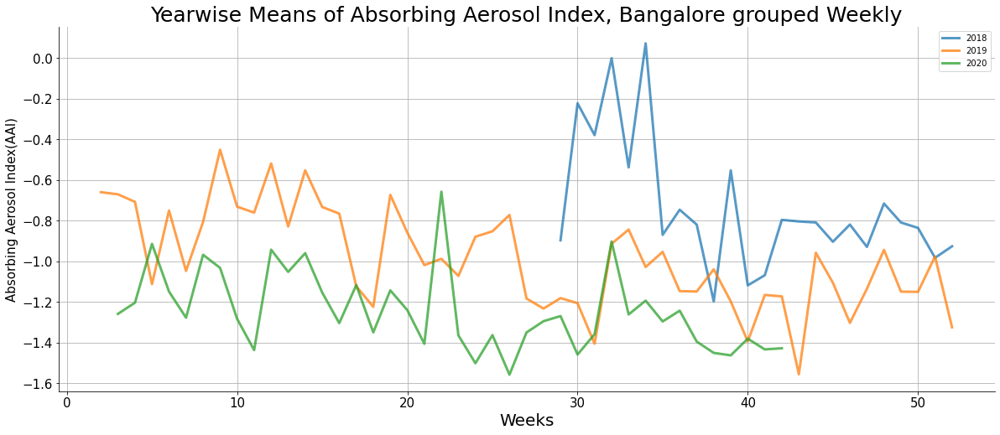

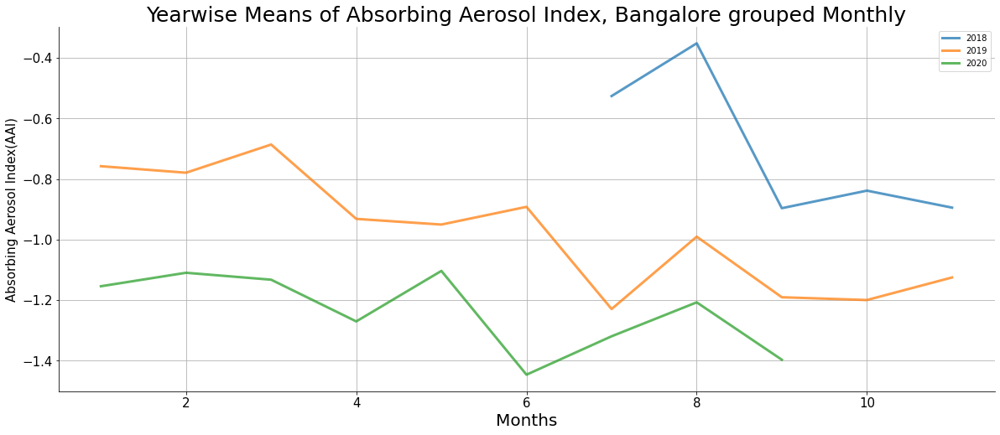

In [50]:
# Plotting Yearwise means
x = [i for i in range(1,13)]
plt.figure(figsize = (20,8))
plt.plot(Weekly_Bangalore_mean[Weekly_Bangalore_mean["year"] == 2018]["week"].tolist()[:-1],Weekly_Bangalore_mean[Weekly_Bangalore_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Weekly_Bangalore_mean[Weekly_Bangalore_mean["year"] == 2019]["week"].tolist()[:-1],Weekly_Bangalore_mean[Weekly_Bangalore_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Weekly_Bangalore_mean[Weekly_Bangalore_mean["year"] == 2020]["week"].tolist()[:-1],Weekly_Bangalore_mean[Weekly_Bangalore_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Weeks",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Yearwise Means of Absorbing Aerosol Index, Bangalore grouped Weekly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.grid()
plt.legend()

plt.figure(figsize = (20,8))
plt.plot(Monthly_Bangalore_mean[Monthly_Bangalore_mean["year"] == 2018]["month"].tolist()[:-1],Monthly_Bangalore_mean[Monthly_Bangalore_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Monthly_Bangalore_mean[Monthly_Bangalore_mean["year"] == 2019]["month"].tolist()[:-1],Monthly_Bangalore_mean[Monthly_Bangalore_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Monthly_Bangalore_mean[Monthly_Bangalore_mean["year"] == 2020]["month"].tolist()[:-1],Monthly_Bangalore_mean[Monthly_Bangalore_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Months",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.title("Yearwise Means of Absorbing Aerosol Index, Bangalore grouped Monthly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.grid()
plt.legend()

The observation from the above graph is that, the Absorbing Aerosol Index values have come down considerably in the last two years. From the graph it is evident that the Aerosol Index values are lesser in 2020. Therefore it can be concluded that the polution in Delhi has been lower in 2020 compared to the previous two years.

### Plotting Maps For Insights

In [51]:
# Grouping by Wards Data for further analysis
Bangalore_wards = df["Bangalore"].groupby(["Ward_No"]).mean()
Bangalore_wards

,mean
Ward_No,
1,-1.159950
2,-1.173467
3,-1.165083
4,-1.139294
5,-1.133939
...,...
194,-1.095522
195,-1.043933
196,-1.118013


<AxesSubplot:>

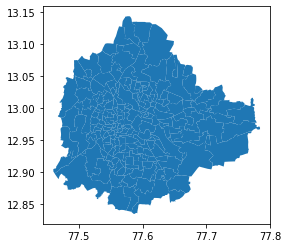

In [52]:
# loading the shapefile
path = r'Cleaned CSVs/Bangalore/BBMP-polygon.shp'
map_Bangalore = gpd.read_file(path)
# Viewing the shapefile
map_Bangalore.plot()

In [53]:
# merging the shapefile with the mean data
merged_Bangalore = map_Bangalore.merge(Bangalore_wards, left_on = "WARD_NO", right_index = True)
# merged_Bangalore.head()
merged_Bangalore

,OBJECTID,ASS_CONST_,ASS_CONST1,WARD_NO,WARD_NAME,POP_M,POP_F,POP_SC,POP_ST,POP_TOTAL,AREA_SQ_KM,LAT,LON,RESERVATIO,geometry,mean
0,1,150,Yelahanka,2.0,Chowdeswari Ward,10402.0,9224.0,2630.0,286.0,19626.0,7.06,13.121709,77.580422,General,"POLYGON ((77.59229 13.09720, 77.59094 13.09842...",-1.173467
1,2,150,Yelahanka,3.0,Atturu,13129.0,10891.0,2921.0,665.0,24020.0,10.15,13.102805,77.560038,General (Women),"POLYGON ((77.56862 13.12705, 77.57064 13.12654...",-1.165083
2,3,150,Yelahanka,4.0,Yelahanka Satellite Town,13457.0,12325.0,3687.0,601.0,25782.0,4.90,13.090987,77.583925,Backward Category - A,"POLYGON ((77.59094 13.09842, 77.59229 13.09720...",-1.139294
3,4,151,K.R. Puram,51.0,Vijnanapura,18118.0,16969.0,6454.0,228.0,35087.0,2.05,13.006063,77.669565,Scheduled Caste,"POLYGON ((77.67683 13.01147, 77.67695 13.01149...",-1.036743
4,5,151,K.R. Puram,53.0,Basavanapura,11494.0,10518.0,4115.0,325.0,22012.0,6.28,13.016847,77.715456,General,"POLYGON ((77.72899 13.02061, 77.72994 13.01995...",-1.090538
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
193,194,172,B.T.M. Layout,172.0,Madivala,19121.0,16034.0,2658.0,555.0,35155.0,1.16,12.920018,77.614418,Backward Category - A,"POLYGON ((77.61399 12.92347, 77.61419 12.92344...",-1.027605
194,195,151,K.R. Puram,26.0,Ramamurthy Nagar,11330.0,10669.0,3489.0,247.0,21999.0,7.87,13.033613,77.676539,Backward Category - A,"POLYGON ((77.68336 13.05192, 77.68384 13.05067...",-1.086044
195,196,151,K.R. Puram,25.0,Horamavu,14696.0,13471.0,5677.0,666.0,28167.0,17.32,13.044561,77.653271,General (Women),"POLYGON ((77.64931 13.07853, 77.64993 13.07701...",-1.088657
196,197,174,Mahadevapura,86.0,Marathahalli,11967.0,10522.0,4126.0,274.0,22489.0,3.10,12.950743,77.691495,General (Women),"POLYGON ((77.68549 12.94121, 77.68539 12.94129...",-1.052418


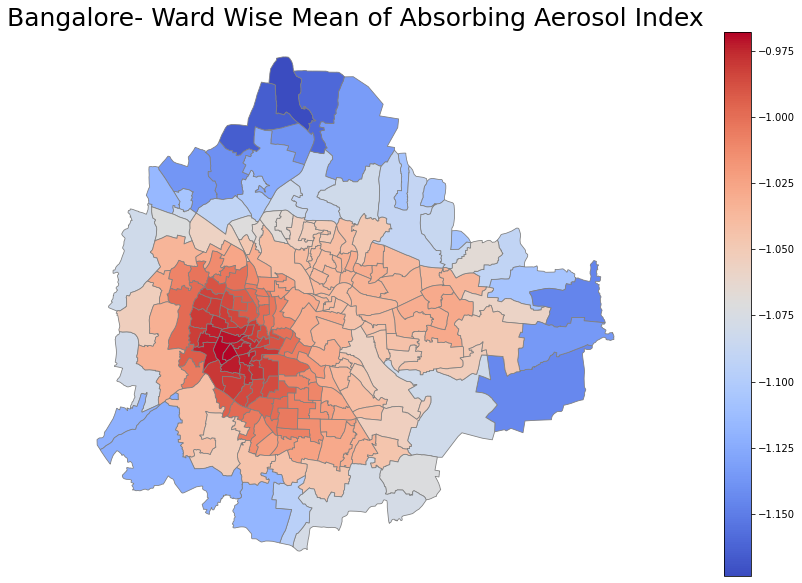

In [54]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values
vmin, vmax = merged_Bangalore["mean"].min(), merged_Bangalore["mean"].max()
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(30, 10))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('Bangalore- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='coolwarm',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 
# empty array for the data range
sm.set_array([]) 
# add the colorbar to the figure
fig.colorbar(sm)
# create map
merged_Bangalore.plot(column=variable, cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.5', figsize = (5,15))
plt.show()

In [55]:
# Using T-Test to determine if climate has changed in the first 14 and last 14 months in Bangalore
ttest_ind(Monthly_Bangalore_mean.iloc[:14,:]["mean"].tolist(),Monthly_Bangalore_mean.iloc[14:,:]["mean"].tolist())

Ttest_indResult(statistic=6.214691795052053, pvalue=1.4184315032691761e-06)

**We observe that Pollution levels has decreased in the last 14 months and the statistical test proves the same with a very small p-value for 95 % Confidence Interval**

## City Number 6: Bhopal

### Loading and Visualizing

In [56]:
# g = df1.groupby(pd.Grouper(freq="M"))
# g.mean()
Bhopal = df["Bhopal"].groupby(["date"]).mean()
Bhopal["month"] = Bhopal.index.month
Bhopal["year"] = Bhopal.index.year
Bhopal

,Ward_No,mean,month,year
date,,,,
2018-07-11,43.383721,-0.267739,7,2018
2018-07-12,43.383721,-0.004302,7,2018
2018-07-13,43.383721,-1.028058,7,2018
2018-07-14,43.383721,-1.125820,7,2018
2018-07-15,43.383721,-0.219812,7,2018
...,...,...,...,...
2020-10-09,43.383721,-1.079642,10,2020
2020-10-10,43.383721,-1.055856,10,2020
2020-10-11,43.383721,-1.372294,10,2020


In [57]:
# Aggregate statistics grouped by Weeks
Weekly_Bhopal_mean = Bhopal.groupby(pd.Grouper(freq="W-MON")).mean()
Weekly_Bhopal_max = Bhopal.groupby(pd.Grouper(freq="W-MON")).max()
Weekly_Bhopal_min = Bhopal.groupby(pd.Grouper(freq="W-MON")).min()

# Aggregate statistics grouped by Months
Monthly_Bhopal_mean = Bhopal.groupby(pd.Grouper(freq="M")).mean()
Monthly_Bhopal_max = Bhopal.groupby(pd.Grouper(freq="M")).max()
Monthly_Bhopal_min = Bhopal.groupby(pd.Grouper(freq="M")).min()

#Week Identifier
Weekly_Bhopal_mean["week"] = Weekly_Bhopal_mean.index.isocalendar().week
Weekly_Bhopal_min["week"] = Weekly_Bhopal_min.index.isocalendar().week
Weekly_Bhopal_max["week"] = Weekly_Bhopal_max.index.isocalendar().week

Monthly_Bhopal_mean["week"] = Monthly_Bhopal_mean.index.isocalendar().week
Monthly_Bhopal_min["week"] = Monthly_Bhopal_min.index.isocalendar().week
Monthly_Bhopal_max["week"] = Monthly_Bhopal_max.index.isocalendar().week

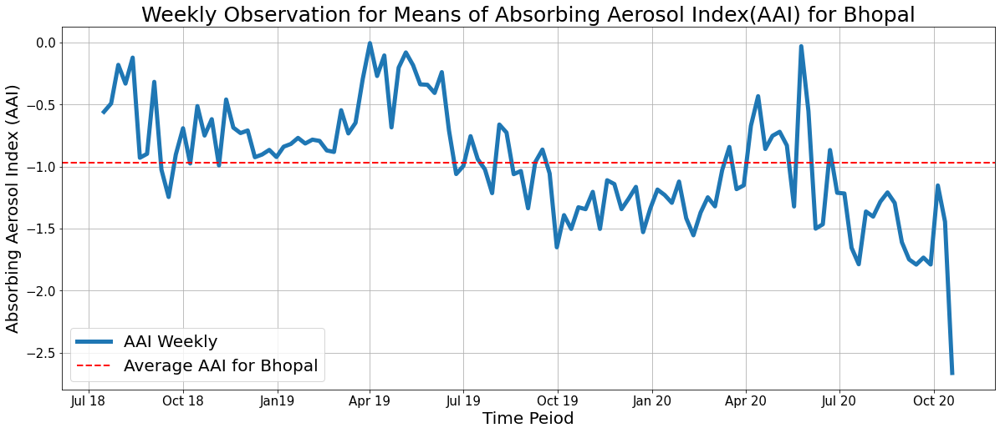

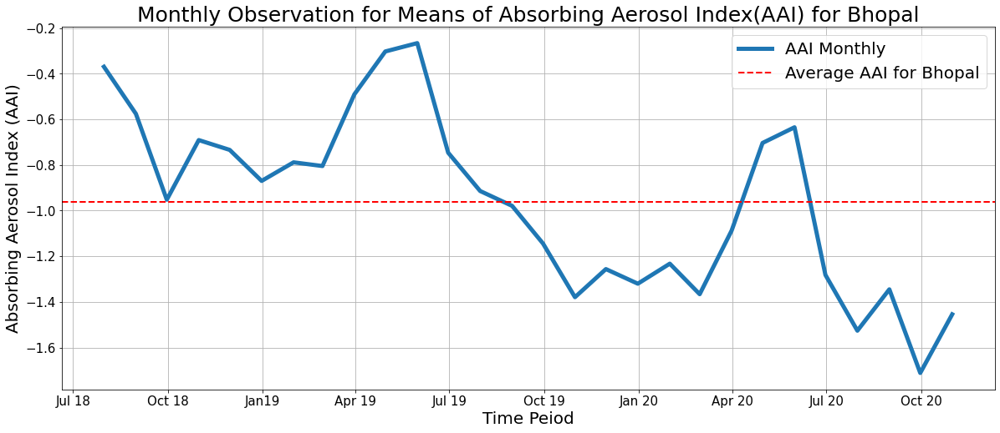

In [58]:
# Visualizing by grouping into weeekly data
plt.figure(figsize = (20,8))
plt.plot( Weekly_Bhopal_mean.index.tolist(),Weekly_Bhopal_mean["mean"], linewidth = 5, label = "AAI Weekly")
plt.gca().axhline(y=Weekly_Bhopal_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Bhopal")
plt.title("Weekly Observation for Means of Absorbing Aerosol Index(AAI) for Bhopal",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

# Visualizing by grouping into Monthly data
plt.figure(figsize = (20,8))
plt.plot( Monthly_Bhopal_mean.index.tolist(),Monthly_Bhopal_mean["mean"], linewidth = 5, label = "AAI Monthly")
plt.gca().axhline(y=Monthly_Bhopal_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Bhopal")
plt.title("Monthly Observation for Means of Absorbing Aerosol Index(AAI) for Bhopal",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

**We will now plot some useful insights with Monthly Data**

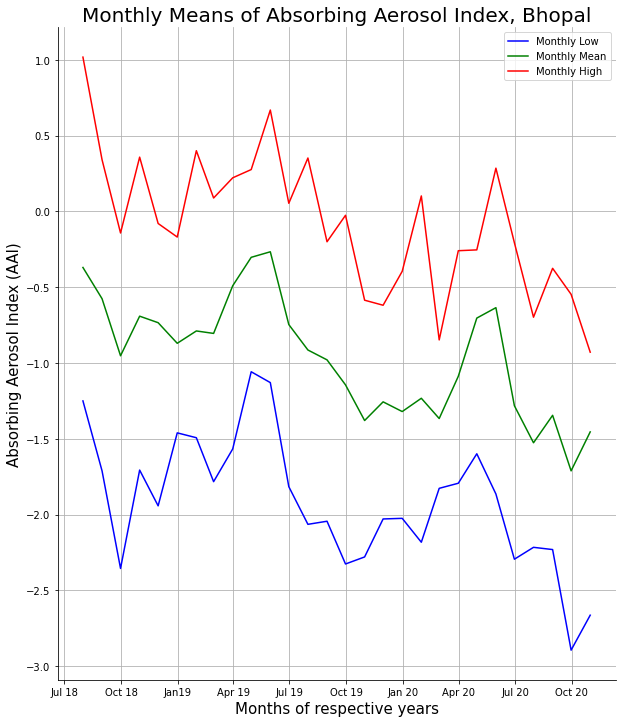

In [59]:
# Plotting Monthly means 
plt.figure(figsize=(10,12))
plt.plot(list(Monthly_Bhopal_min.index),list(Monthly_Bhopal_min["mean"]), label = "Monthly Low", color = "blue" )
plt.plot(list(Monthly_Bhopal_mean.index),list(Monthly_Bhopal_mean["mean"]), label= "Monthly Mean" , color ="green")
plt.plot(list(Monthly_Bhopal_max.index),list(Monthly_Bhopal_max["mean"]), label = "Monthly High", color = "red" )

plt.xlabel("Months of respective years",fontsize= 15)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Monthly Means of Absorbing Aerosol Index, Bhopal",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 15)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels)
plt.legend()
plt.grid()


We can observe that Aerosol Optical Depth has decreased in the past year. The change in policies, Even Odd Rule and Coronavirus Pandemic seems to have shifted the curve down.

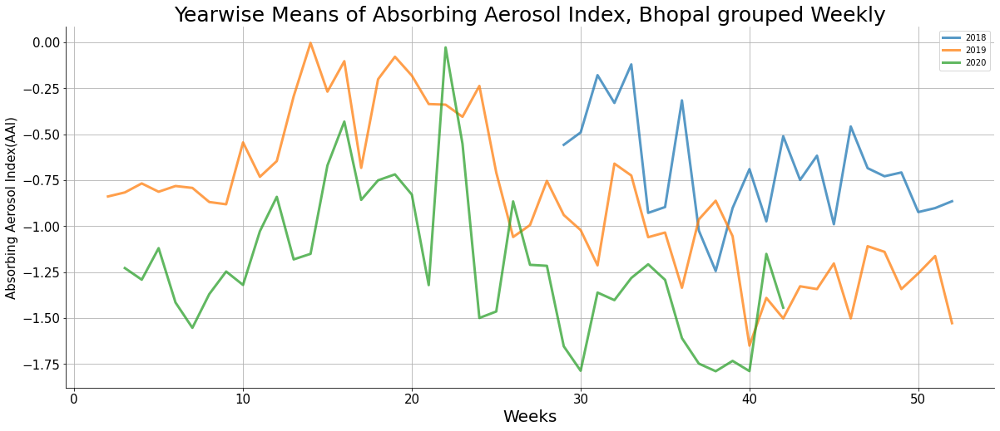

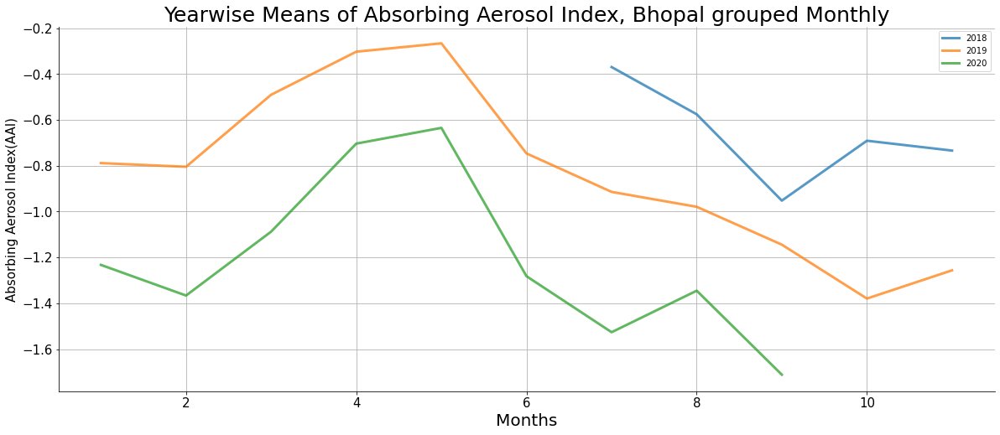

In [60]:
# Plotting Yearwise means
x = [i for i in range(1,13)]
plt.figure(figsize = (20,8))
plt.plot(Weekly_Bhopal_mean[Weekly_Bhopal_mean["year"] == 2018]["week"].tolist()[:-1],Weekly_Bhopal_mean[Weekly_Bhopal_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Weekly_Bhopal_mean[Weekly_Bhopal_mean["year"] == 2019]["week"].tolist()[:-1],Weekly_Bhopal_mean[Weekly_Bhopal_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Weekly_Bhopal_mean[Weekly_Bhopal_mean["year"] == 2020]["week"].tolist()[:-1],Weekly_Bhopal_mean[Weekly_Bhopal_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Weeks",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Yearwise Means of Absorbing Aerosol Index, Bhopal grouped Weekly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.grid()
plt.legend()

plt.figure(figsize = (20,8))
plt.plot(Monthly_Bhopal_mean[Monthly_Bhopal_mean["year"] == 2018]["month"].tolist()[:-1],Monthly_Bhopal_mean[Monthly_Bhopal_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Monthly_Bhopal_mean[Monthly_Bhopal_mean["year"] == 2019]["month"].tolist()[:-1],Monthly_Bhopal_mean[Monthly_Bhopal_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Monthly_Bhopal_mean[Monthly_Bhopal_mean["year"] == 2020]["month"].tolist()[:-1],Monthly_Bhopal_mean[Monthly_Bhopal_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Months",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.title("Yearwise Means of Absorbing Aerosol Index, Bhopal grouped Monthly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.grid()
plt.legend()

The observation from the above graph is that, the Absorbing Aerosol Index values have come down considerably in the last two years. From the graph it is evident that the Aerosol Index values are lesser in 2020. Therefore it can be concluded that the polution in Delhi has been lower in 2020 compared to the previous two years.

### Plotting Maps For Insights

In [61]:
# Grouping by Wards Data for further analysis
Bhopal_wards = df["Bhopal"].groupby(["Ward_No"]).mean()
Bhopal_wards

,mean
Ward_No,
1,-1.038455
2,-1.028628
3,-1.074727
4,-1.047196
5,-1.024474
...,...
81,-1.031333
82,-0.949440
83,-0.969825


<AxesSubplot:>

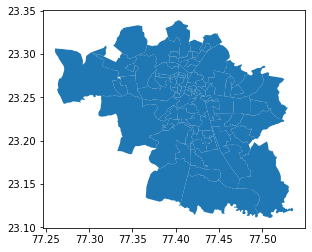

In [62]:
# loading the shapefile
path = r'Cleaned CSVs/Bhopal/Bhopal_Wards-polygon.shp'
map_Bhopal = gpd.read_file(path)
map_Bhopal["Ward_Numbe"]= map_Bhopal["Ward_Numbe"].astype(int)
# Viewing the shapefile
map_Bhopal.plot()

In [63]:
# merging the shapefile with the mean data
merged_Bhopal = map_Bhopal.merge(Bhopal_wards, left_on = "Ward_Numbe", right_index = True)
# merged_Bhopal.head()
merged_Bhopal

,zone_offic,ward_offic,zone_off_1,corporator,zone,Ward_Numbe,Name,corporat_1,population,ward_off_1,geometry,mean
0,9424499906,à¤¶à¥à¤°à¥ à¤à¤à¤¨ à¤¸à¥à¤¨à¥,à¤¶à¥à¤°à¥ à¤¸à¥à¤­à¤¾à¤· à¤¬à¤¾à¤¥à¤®,à¤¶à¥à¤°à¥ à¤ªà¥à¤°à¤¦à¥à¤ª à¤®à¥à¤¨à¥ à...,6,27,à¤à¥à¤¸à¥à¤µà¤¾à¤®à¥ à¤¤à¥à¤²à¤¸à¥à¤¦à¤¾à¤¸,9406903127,24989,9425601327,"POLYGON Z ((77.39051 23.21976 0.00000, 77.3923...",-0.998266
1,9424499906,à¤¶à¥à¤°à¥ à¤¬à¤¾à¤®à¤¨ à¤à¤à¤à¤¾à¤²à¥,à¤¶à¥à¤°à¥ à¤¸à¥à¤­à¤¾à¤· à¤¬à¤¾à¤¥à¤®,à¤¶à¥à¤°à¥à¤®à¤¤à¥ à¤²à¤à¥à¤·à¥à¤®à¥ à¤...,6,28,à¤°à¤¾à¤¨à¥ à¤ à¤µà¤à¤¤à¥à¤¬à¤¾à¤,9406903128,24155,9425601328,"POLYGON Z ((77.40383 23.22100 0.00000, 77.4026...",-0.978653
2,9424499918,à¤¶à¥à¤°à¥ à¤°à¤¾à¤à¥à¤¶ à¤®à¤à¥à¤°à¤¿à¤...,à¤¶à¥à¤°à¥ à¤¶à¥à¤²à¥à¤¨à¥à¤¦à¥à¤° à¤à¥...,à¤¶à¥à¤°à¥ à¤¸à¤à¤¤à¥à¤· à¤à¤à¤¸à¤¾à¤¨à¤¾,18,29,à¤®à¥à¤²à¤¾à¤¨à¤¾ à¤ à¤¬à¥à¤² à¤à¤²à¤¾à¤® à...,9406903129,25529,9425601329,"POLYGON Z ((77.38854 23.21192 0.00000, 77.3899...",-1.009352
3,9424499907,à¤¶à¥à¤°à¥ à¤¬à¥à¤à¤­à¥à¤·à¤£ à¤¤à¤¿à¤µà¤...,à¤¶à¥à¤°à¥ à¤ à¤°à¥à¤à¥à¤¨ à¤®à¥à¤à¤¾à¤...,à¤¶à¥à¤°à¥à¤®à¤¤à¥ à¤¸à¥à¤®à¤¾ à¤¸à¤à¥à¤...,7,30,à¤à¥à¤¶à¤¾à¤­à¤¾à¤ à¤ à¤¾à¤à¤°à¥,9406903130,23007,9425601330,"POLYGON Z ((77.40744 23.22113 0.00000, 77.4062...",-0.956975
4,9424499907,à¤¶à¥à¤°à¥ à¤­à¤µà¤¾à¤¨à¥ à¤¶à¤à¤à¤°,à¤¶à¥à¤°à¥ à¤ à¤°à¥à¤à¥à¤¨ à¤®à¥à¤à¤¾à¤...,à¤¶à¥à¤°à¥ à¤ à¤®à¤¿à¤¤ à¤¶à¤°à¥à¤®à¤¾,7,31,à¤à¤¤à¥à¤°à¤ªà¤¤à¤¿ à¤¶à¤¿à¤µà¤¾à¤à¥,9406903131,21171,9425601331,"POLYGON Z ((77.40185 23.22866 0.00000, 77.4016...",-0.949502
...,...,...,...,...,...,...,...,...,...,...,...,...
81,9424499915,à¤¶à¥à¤°à¥ à¤°à¤¾à¤à¥à¤¶ à¤¶à¥à¤°à¥à¤µà¤...,à¤¶à¥à¤°à¥ à¤°à¤¾à¤à¥à¤¶ à¤¶à¥à¤°à¥à¤µà¤...,à¤¶à¥à¤°à¥ à¤¸à¥à¤°à¥à¤¨à¥à¤¦à¥à¤° à¤µà¤...,15,64,à¤¸à¥à¤¨à¤¾à¤à¤¿à¤°à¥,9406903164,25964,9425601364,"POLYGON Z ((77.46710 23.24980 0.00000, 77.4674...",-0.988863
82,9424499915,à¤¶à¥à¤°à¥ à¤à¤¹à¤¸à¤¾à¤¨ à¤ à¤²à¥,à¤¶à¥à¤°à¥ à¤°à¤¾à¤à¥à¤¶ à¤¶à¥à¤°à¥à¤µà¤...,à¤¶à¥à¤°à¥à¤®à¤¤à¥ à¤¦à¤¯à¤¾à¤µà¤¤à¥ à¤à¥...,15,63,à¤à¥à¤¤à¤®à¤¬à¥à¤¦à¥à¤§,9406903163,25180,9425601363,"POLYGON Z ((77.46610 23.24995 0.00000, 77.4671...",-0.962341
83,9424499915,à¤¶à¥à¤°à¥ à¤¦à¥à¤µà¤¾à¤°à¥à¤à¤¾ à¤ªà¥à¤...,à¤¶à¥à¤°à¥ à¤°à¤¾à¤à¥à¤¶ à¤¶à¥à¤°à¥à¤µà¤...,à¤¶à¥à¤°à¥à¤®à¤¤à¥ à¤¡à¤¾à¤²à¥ à¤®à¤¨à¥à¤...,15,62,à¤¹à¤¥à¤¾à¤à¤à¥à¤¡à¤¼à¤¾,9406903162,19669,9425601362,"POLYGON Z ((77.49969 23.27661 0.00000, 77.4998...",-1.029873
84,9424499902,à¤¶à¥à¤°à¥ à¤à¥à¤ à¤¾à¤¨à¤à¤¦ à¤®à¤à¤¤à¤...,à¤¶à¥à¤°à¥ à¤à¤®.à¤ªà¥. à¤¶à¤¾à¤à¤¡à¤¿à¤²...,à¤¶à¥à¤°à¥à¤®à¤¤à¥ à¤¨à¥à¤¤à¥ à¤à¤°à¥,2,6,à¤®à¤¹à¤¾à¤µà¥à¤°à¤à¤¿à¤°à¥,9406903106,21267,9425601306,"POLYGON Z ((77.35384 23.27022 0.00000, 77.3536...",-0.990073


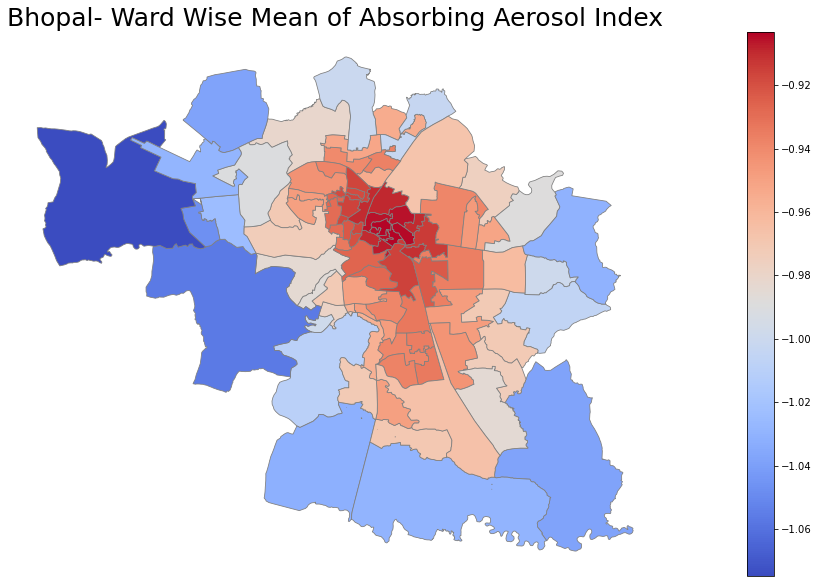

In [64]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values
vmin, vmax = merged_Bhopal["mean"].min(), merged_Bhopal["mean"].max()
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(30, 10))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('Bhopal- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='coolwarm',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 
# empty array for the data range
sm.set_array([]) 
# add the colorbar to the figure
fig.colorbar(sm)
# create map
merged_Bhopal.plot(column=variable, cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.5', figsize = (5,15))
plt.show()

In [65]:
# Using T-Test to determine if climate has changed in the first 14 and last 14 months in Bhopal
ttest_ind(Monthly_Bhopal_mean.iloc[:14,:]["mean"].tolist(),Monthly_Bhopal_mean.iloc[14:,:]["mean"].tolist())

Ttest_indResult(statistic=5.659151468144071, pvalue=5.957401679702306e-06)

## City Number 7: Bhubaneshwar

### Loading and Visualizing

In [66]:
# g = df1.groupby(pd.Grouper(freq="M"))
# g.mean()
Bhubaneshwar = df["Bhubaneshwar"].groupby(["date"]).mean()
Bhubaneshwar["month"] = Bhubaneshwar.index.month
Bhubaneshwar["year"] = Bhubaneshwar.index.year
Bhubaneshwar

,mean,Ward_No,month,year
date,,,,
2018-07-11,-1.124388,34,7,2018
2018-07-12,-1.593273,34,7,2018
2018-07-13,-0.079946,34,7,2018
2018-07-14,0.077493,34,7,2018
2018-07-15,-0.489921,34,7,2018
...,...,...,...,...
2020-10-09,-2.188640,34,10,2020
2020-10-10,-1.801918,34,10,2020
2020-10-11,-0.393510,34,10,2020


In [67]:
# Aggregate statistics grouped by Weeks
Weekly_Bhubaneshwar_mean = Bhubaneshwar.groupby(pd.Grouper(freq="W-MON")).mean()
Weekly_Bhubaneshwar_max = Bhubaneshwar.groupby(pd.Grouper(freq="W-MON")).max()
Weekly_Bhubaneshwar_min = Bhubaneshwar.groupby(pd.Grouper(freq="W-MON")).min()

# Aggregate statistics grouped by Months
Monthly_Bhubaneshwar_mean = Bhubaneshwar.groupby(pd.Grouper(freq="M")).mean()
Monthly_Bhubaneshwar_max = Bhubaneshwar.groupby(pd.Grouper(freq="M")).max()
Monthly_Bhubaneshwar_min = Bhubaneshwar.groupby(pd.Grouper(freq="M")).min()

#Week Identifier
Weekly_Bhubaneshwar_mean["week"] = Weekly_Bhubaneshwar_mean.index.isocalendar().week
Weekly_Bhubaneshwar_min["week"] = Weekly_Bhubaneshwar_min.index.isocalendar().week
Weekly_Bhubaneshwar_max["week"] = Weekly_Bhubaneshwar_max.index.isocalendar().week

Monthly_Bhubaneshwar_mean["week"] = Monthly_Bhubaneshwar_mean.index.isocalendar().week
Monthly_Bhubaneshwar_min["week"] = Monthly_Bhubaneshwar_min.index.isocalendar().week
Monthly_Bhubaneshwar_max["week"] = Monthly_Bhubaneshwar_max.index.isocalendar().week

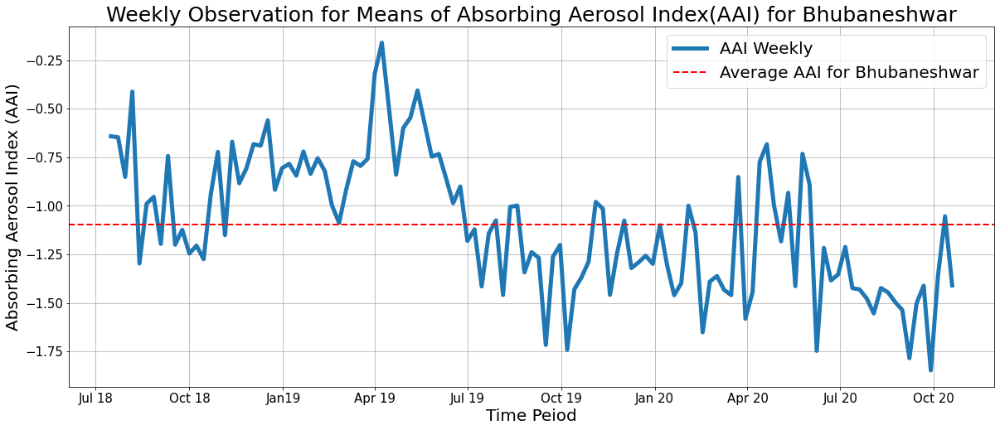

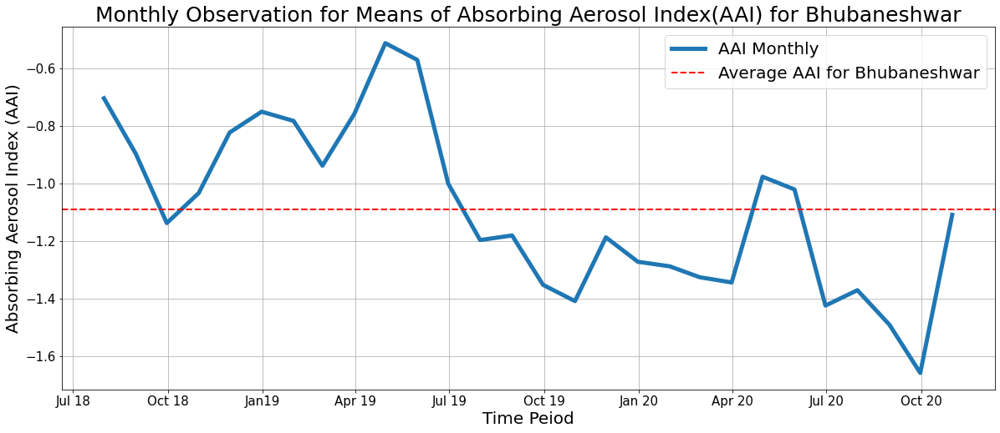

In [68]:
# Visualizing by grouping into weeekly data
plt.figure(figsize = (20,8))
plt.plot( Weekly_Bhubaneshwar_mean.index.tolist(),Weekly_Bhubaneshwar_mean["mean"], linewidth = 5, label = "AAI Weekly")
plt.gca().axhline(y=Weekly_Bhubaneshwar_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Bhubaneshwar")
plt.title("Weekly Observation for Means of Absorbing Aerosol Index(AAI) for Bhubaneshwar",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

# Visualizing by grouping into Monthly data
plt.figure(figsize = (20,8))
plt.plot( Monthly_Bhubaneshwar_mean.index.tolist(),Monthly_Bhubaneshwar_mean["mean"], linewidth = 5, label = "AAI Monthly")
plt.gca().axhline(y=Monthly_Bhubaneshwar_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Bhubaneshwar")
plt.title("Monthly Observation for Means of Absorbing Aerosol Index(AAI) for Bhubaneshwar",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

**We will now plot some useful insights with Monthly Data**

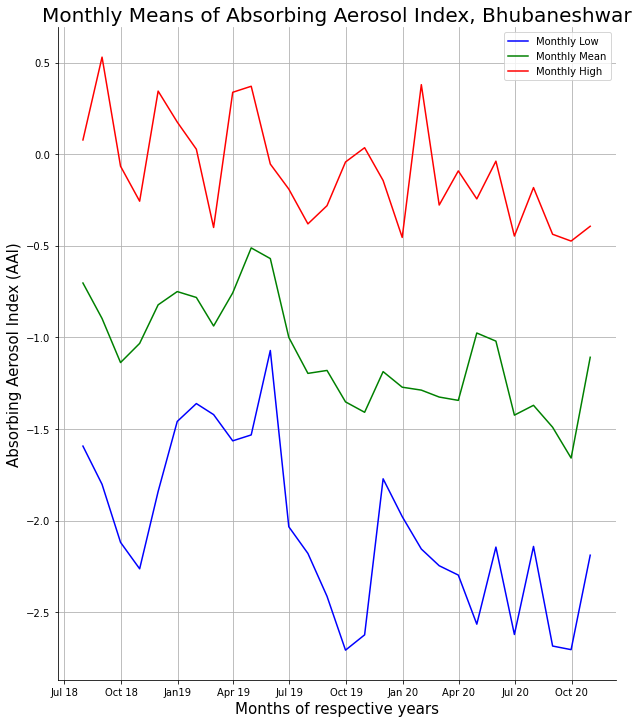

In [69]:
# Plotting Monthly means 
plt.figure(figsize=(10,12))
plt.plot(list(Monthly_Bhubaneshwar_min.index),list(Monthly_Bhubaneshwar_min["mean"]), label = "Monthly Low", color = "blue" )
plt.plot(list(Monthly_Bhubaneshwar_mean.index),list(Monthly_Bhubaneshwar_mean["mean"]), label= "Monthly Mean" , color ="green")
plt.plot(list(Monthly_Bhubaneshwar_max.index),list(Monthly_Bhubaneshwar_max["mean"]), label = "Monthly High", color = "red" )

plt.xlabel("Months of respective years",fontsize= 15)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Monthly Means of Absorbing Aerosol Index, Bhubaneshwar",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 15)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels)
plt.legend()
plt.grid()


We can observe that Aerosol Optical Depth has decreased in the past year. The change in policies, Even Odd Rule and Coronavirus Pandemic seems to have shifted the curve down.

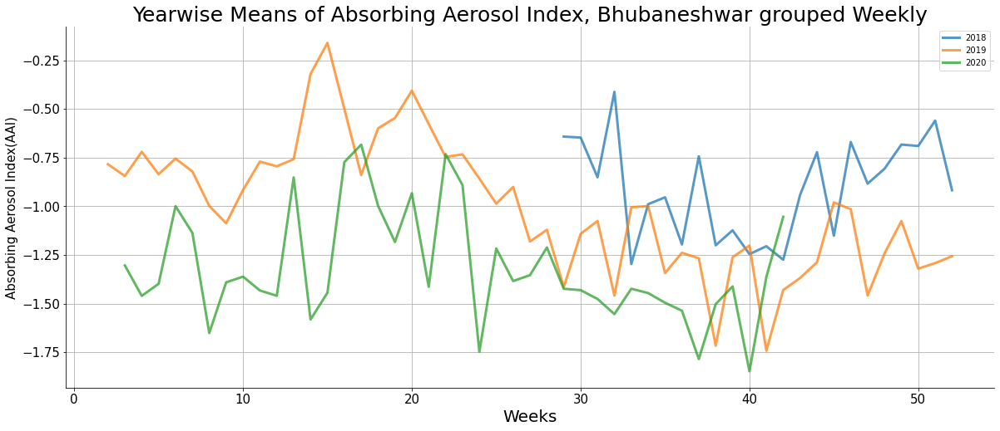

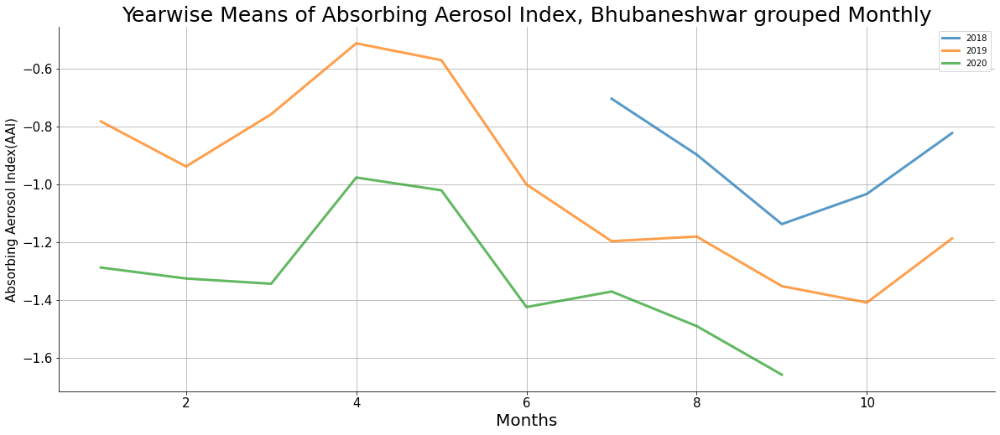

In [70]:
# Plotting Yearwise means
x = [i for i in range(1,13)]
plt.figure(figsize = (20,8))
plt.plot(Weekly_Bhubaneshwar_mean[Weekly_Bhubaneshwar_mean["year"] == 2018]["week"].tolist()[:-1],Weekly_Bhubaneshwar_mean[Weekly_Bhubaneshwar_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Weekly_Bhubaneshwar_mean[Weekly_Bhubaneshwar_mean["year"] == 2019]["week"].tolist()[:-1],Weekly_Bhubaneshwar_mean[Weekly_Bhubaneshwar_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Weekly_Bhubaneshwar_mean[Weekly_Bhubaneshwar_mean["year"] == 2020]["week"].tolist()[:-1],Weekly_Bhubaneshwar_mean[Weekly_Bhubaneshwar_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Weeks",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Yearwise Means of Absorbing Aerosol Index, Bhubaneshwar grouped Weekly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.grid()
plt.legend()

plt.figure(figsize = (20,8))
plt.plot(Monthly_Bhubaneshwar_mean[Monthly_Bhubaneshwar_mean["year"] == 2018]["month"].tolist()[:-1],Monthly_Bhubaneshwar_mean[Monthly_Bhubaneshwar_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Monthly_Bhubaneshwar_mean[Monthly_Bhubaneshwar_mean["year"] == 2019]["month"].tolist()[:-1],Monthly_Bhubaneshwar_mean[Monthly_Bhubaneshwar_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Monthly_Bhubaneshwar_mean[Monthly_Bhubaneshwar_mean["year"] == 2020]["month"].tolist()[:-1],Monthly_Bhubaneshwar_mean[Monthly_Bhubaneshwar_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Months",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.title("Yearwise Means of Absorbing Aerosol Index, Bhubaneshwar grouped Monthly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.grid()
plt.legend()

The observation from the above graph is that, the Absorbing Aerosol Index values have come down considerably in the last two years. From the graph it is evident that the Aerosol Index values are lesser in 2020. Therefore it can be concluded that the polution in Delhi has been lower in 2020 compared to the previous two years.

### Plotting Maps For Insights

In [71]:
# Grouping by Wards Data for further analysis
Bhubaneshwar_wards = df["Bhubaneshwar"].groupby(["Ward_No"]).mean()
Bhubaneshwar_wards

,mean
Ward_No,
1,-1.097257
2,-1.089468
3,-1.076829
4,-1.087910
5,-1.124838
...,...
63,-1.095557
64,-1.092055
65,-1.106248


<AxesSubplot:>

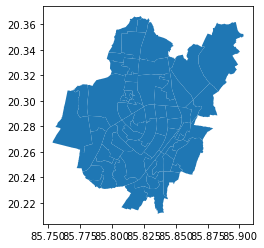

In [72]:
# loading the shapefile
path = r'Cleaned CSVs/Bhubaneshwar/Bhubaneshwar.shp'
map_Bhubaneshwar = gpd.read_file(path)
# Viewing the shapefile
map_Bhubaneshwar.plot()

In [73]:
# merging the shapefile with the mean data
merged_Bhubaneshwar = map_Bhubaneshwar.merge(Bhubaneshwar_wards, left_on = "objectid", right_index = True)
# merged_Bhubaneshwar.head()
merged_Bhubaneshwar

,objectid,name,folderpath,symbolid,altmode,base,clamped,extruded,snippet,popupinfo,geometry,mean
0,1,Placemark,Document/Wards,0,0,0,-1,0,None,None,"POLYGON ((85.82041 20.32118, 85.82042 20.32141...",-1.097257
1,2,Placemark,Document/Wards,0,0,0,-1,0,None,None,"POLYGON ((85.80412 20.29752, 85.80412 20.29796...",-1.089468
2,3,Placemark,Document/Wards,0,0,0,-1,0,None,None,"POLYGON ((85.80375 20.27573, 85.80381 20.27569...",-1.076829
3,4,Placemark,Document/Wards,0,0,0,-1,0,None,None,"POLYGON ((85.84112 20.25814, 85.84117 20.25819...",-1.087910
4,5,Placemark,Document/Wards,0,0,0,-1,0,None,None,"POLYGON ((85.81945 20.35411, 85.81946 20.35403...",-1.124838
...,...,...,...,...,...,...,...,...,...,...,...,...
62,63,Placemark,Document/Wards,0,0,0,-1,0,None,None,"POLYGON ((85.82770 20.24244, 85.82772 20.24236...",-1.095557
63,64,Placemark,Document/Wards,0,0,0,-1,0,None,None,"POLYGON ((85.81808 20.23642, 85.81821 20.23649...",-1.092055
64,65,Placemark,Document/Wards,0,0,0,-1,0,None,None,"POLYGON ((85.81808 20.23642, 85.81800 20.23520...",-1.106248
65,66,Placemark,Document/Wards,0,0,0,-1,0,None,None,"POLYGON ((85.77677 20.24464, 85.77683 20.24464...",-1.084328


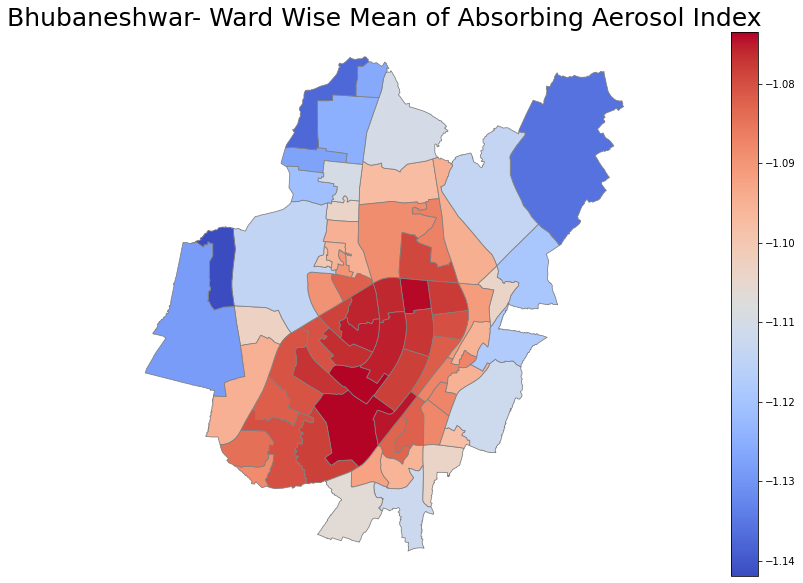

In [74]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values
vmin, vmax = merged_Bhubaneshwar["mean"].min(), merged_Bhubaneshwar["mean"].max()
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(30, 10))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('Bhubaneshwar- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='coolwarm',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 
# empty array for the data range
sm.set_array([]) 
# add the colorbar to the figure
fig.colorbar(sm)
# create map
merged_Bhubaneshwar.plot(column=variable, cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.5', figsize = (5,15))
plt.show()

In [75]:
# Using T-Test to determine if climate has changed in the first 14 and last 14 months in Bhubaneshwar
ttest_ind(Monthly_Bhubaneshwar_mean.iloc[:14,:]["mean"].tolist(),Monthly_Bhubaneshwar_mean.iloc[14:,:]["mean"].tolist())

Ttest_indResult(statistic=5.615521933063699, pvalue=6.675152930440566e-06)

**We observe that Pollution levels has decreased in the last 14 months and the statistical test proves the same with a very small p-value for 95 % Confidence Interval**

## City Number 8: Chennai

### Loading and Visualizing

In [76]:
# g = df1.groupby(pd.Grouper(freq="M"))
# g.mean()
Chennai = df["Chennai"].groupby(["date"]).mean()
Chennai["month"] = Chennai.index.month
Chennai["year"] = Chennai.index.year
Chennai

,Ward_No,mean,month,year
date,,,,
2018-07-11,100.0,-0.119198,7,2018
2018-07-12,100.0,-0.380352,7,2018
2018-07-13,100.0,-0.760456,7,2018
2018-07-14,100.0,-0.772295,7,2018
2018-07-15,100.0,-1.264108,7,2018
...,...,...,...,...
2020-10-09,100.0,-1.030521,10,2020
2020-10-10,100.0,-0.795878,10,2020
2020-10-11,100.0,-1.247523,10,2020


In [77]:
# Aggregate statistics grouped by Weeks
Weekly_Chennai_mean = Chennai.groupby(pd.Grouper(freq="W-MON")).mean()
Weekly_Chennai_max = Chennai.groupby(pd.Grouper(freq="W-MON")).max()
Weekly_Chennai_min = Chennai.groupby(pd.Grouper(freq="W-MON")).min()

# Aggregate statistics grouped by Months
Monthly_Chennai_mean = Chennai.groupby(pd.Grouper(freq="M")).mean()
Monthly_Chennai_max = Chennai.groupby(pd.Grouper(freq="M")).max()
Monthly_Chennai_min = Chennai.groupby(pd.Grouper(freq="M")).min()

#Week Identifier
Weekly_Chennai_mean["week"] = Weekly_Chennai_mean.index.isocalendar().week
Weekly_Chennai_min["week"] = Weekly_Chennai_min.index.isocalendar().week
Weekly_Chennai_max["week"] = Weekly_Chennai_max.index.isocalendar().week

Monthly_Chennai_mean["week"] = Monthly_Chennai_mean.index.isocalendar().week
Monthly_Chennai_min["week"] = Monthly_Chennai_min.index.isocalendar().week
Monthly_Chennai_max["week"] = Monthly_Chennai_max.index.isocalendar().week

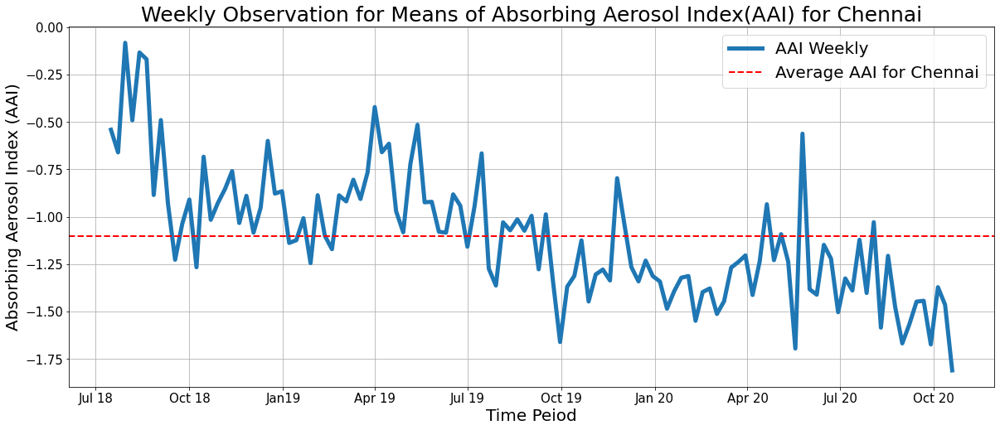

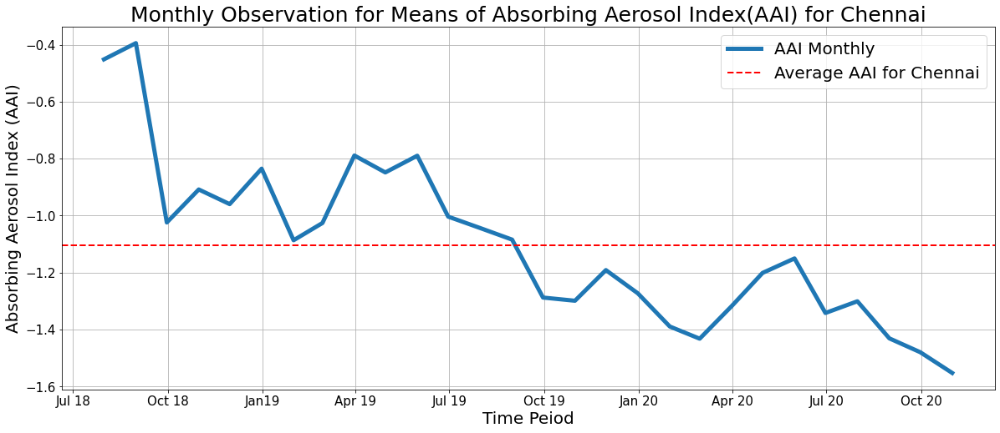

In [78]:
# Visualizing by grouping into weeekly data
plt.figure(figsize = (20,8))
plt.plot( Weekly_Chennai_mean.index.tolist(),Weekly_Chennai_mean["mean"], linewidth = 5, label = "AAI Weekly")
plt.gca().axhline(y=Weekly_Chennai_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Chennai")
plt.title("Weekly Observation for Means of Absorbing Aerosol Index(AAI) for Chennai",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

# Visualizing by grouping into Monthly data
plt.figure(figsize = (20,8))
plt.plot( Monthly_Chennai_mean.index.tolist(),Monthly_Chennai_mean["mean"], linewidth = 5, label = "AAI Monthly")
plt.gca().axhline(y=Monthly_Chennai_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Chennai")
plt.title("Monthly Observation for Means of Absorbing Aerosol Index(AAI) for Chennai",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

**We will now plot some useful insights with Monthly Data**

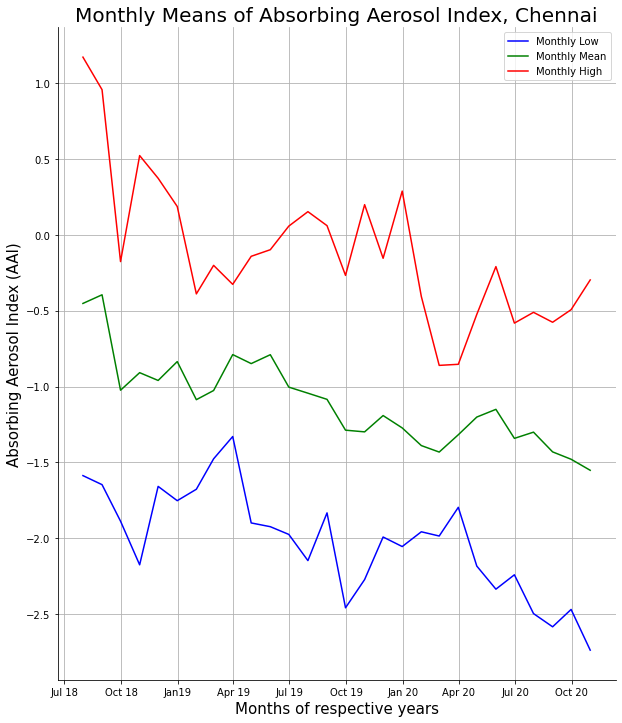

In [79]:
# Plotting Monthly means 
plt.figure(figsize=(10,12))
plt.plot(list(Monthly_Chennai_min.index),list(Monthly_Chennai_min["mean"]), label = "Monthly Low", color = "blue" )
plt.plot(list(Monthly_Chennai_mean.index),list(Monthly_Chennai_mean["mean"]), label= "Monthly Mean" , color ="green")
plt.plot(list(Monthly_Chennai_max.index),list(Monthly_Chennai_max["mean"]), label = "Monthly High", color = "red" )

plt.xlabel("Months of respective years",fontsize= 15)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Monthly Means of Absorbing Aerosol Index, Chennai",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 15)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels)
plt.legend()
plt.grid()


We can observe that Aerosol Optical Depth has decreased in the past year. The change in policies, Even Odd Rule and Coronavirus Pandemic seems to have shifted the curve down.

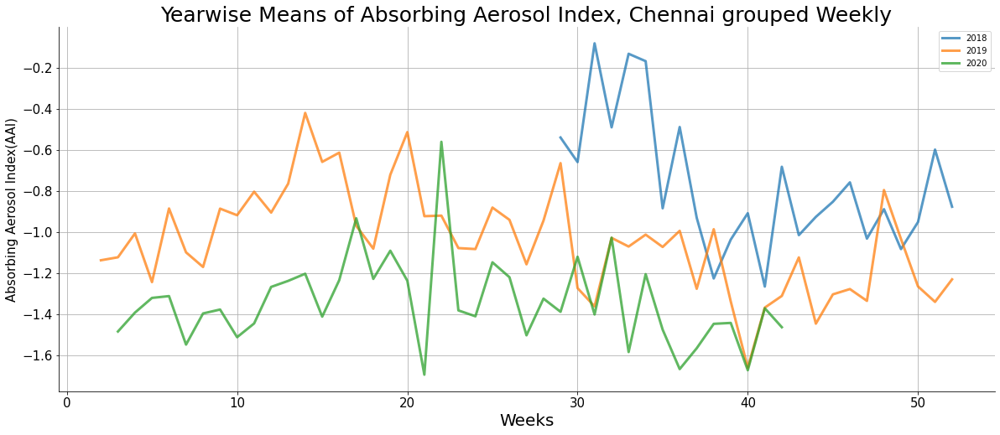

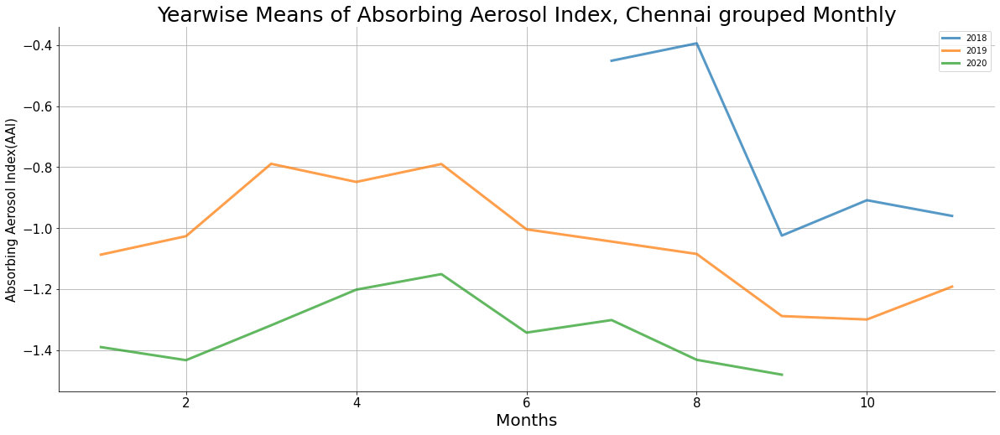

In [80]:
# Plotting Yearwise means
x = [i for i in range(1,13)]
plt.figure(figsize = (20,8))
plt.plot(Weekly_Chennai_mean[Weekly_Chennai_mean["year"] == 2018]["week"].tolist()[:-1],Weekly_Chennai_mean[Weekly_Chennai_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Weekly_Chennai_mean[Weekly_Chennai_mean["year"] == 2019]["week"].tolist()[:-1],Weekly_Chennai_mean[Weekly_Chennai_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Weekly_Chennai_mean[Weekly_Chennai_mean["year"] == 2020]["week"].tolist()[:-1],Weekly_Chennai_mean[Weekly_Chennai_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Weeks",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Yearwise Means of Absorbing Aerosol Index, Chennai grouped Weekly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.grid()
plt.legend()

plt.figure(figsize = (20,8))
plt.plot(Monthly_Chennai_mean[Monthly_Chennai_mean["year"] == 2018]["month"].tolist()[:-1],Monthly_Chennai_mean[Monthly_Chennai_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Monthly_Chennai_mean[Monthly_Chennai_mean["year"] == 2019]["month"].tolist()[:-1],Monthly_Chennai_mean[Monthly_Chennai_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Monthly_Chennai_mean[Monthly_Chennai_mean["year"] == 2020]["month"].tolist()[:-1],Monthly_Chennai_mean[Monthly_Chennai_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Months",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.title("Yearwise Means of Absorbing Aerosol Index, Chennai grouped Monthly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.grid()
plt.legend()

The observation from the above graph is that, the Absorbing Aerosol Index values have come down considerably in the last two years. From the graph it is evident that the Aerosol Index values are lesser in 2020. Therefore it can be concluded that the polution in Delhi has been lower in 2020 compared to the previous two years.

### Plotting Maps For Insights

In [81]:
# Grouping by Wards Data for further analysis
Chennai_wards = df["Chennai"].groupby(["Ward_No"]).mean()
Chennai_wards

,mean
Ward_No,
0,-1.036939
1,-1.251051
2,-1.255380
3,-1.261816
4,-1.245673
...,...
196,-1.239086
197,-1.201059
198,-1.243007


<AxesSubplot:>

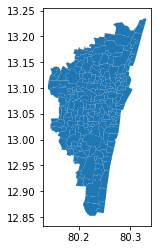

In [82]:
# loading the shapefile
path = r'Cleaned CSVs/Chennai/Wards-polygon.shp'
map_Chennai = gpd.read_file(path)
# Viewing the shapefile
map_Chennai.plot()

In [83]:
# merging the shapefile with the mean data
merged_Chennai = map_Chennai.merge(Chennai_wards, left_on = "Ward_No", right_index = True)
# merged_Chennai.head()
merged_Chennai

,Zone_No,Ward_No,Zone_Name,AREA,PERIMETER,geometry,mean
0,IX,119,TEYNAMPET,0.000115,0.061956,"POLYGON ((80.27090 13.04753, 80.27062 13.04759...",-1.156878
1,I,7,THIRUVOTTIYUR,0.000645,0.124303,"POLYGON ((80.29467 13.15558, 80.29291 13.15137...",-1.196864
2,III,26,MADHAVARAM,0.000401,0.096859,"POLYGON ((80.22978 13.14719, 80.22842 13.14495...",-1.079512
3,XIII,174,ADYAR,0.000695,0.121556,"POLYGON ((80.24043 13.00684, 80.24130 13.00659...",-1.113540
4,X,132,KODAMBAKKAM,0.000117,0.051055,"POLYGON ((80.20803 13.03565, 80.20835 13.03708...",-1.039459
...,...,...,...,...,...,...,...
196,X,134,KODAMBAKKAM,0.000087,0.042240,"POLYGON ((80.22926 13.04390, 80.22259 13.04572...",-1.047412
197,X,135,KODAMBAKKAM,0.000078,0.039567,"POLYGON ((80.22085 13.03439, 80.21885 13.03459...",-1.060044
198,X,133,KODAMBAKKAM,0.000085,0.063298,"POLYGON ((80.21711 13.03137, 80.21664 13.03131...",-1.044094
199,X,131,KODAMBAKKAM,0.000098,0.063492,"POLYGON ((80.20950 13.04646, 80.20940 13.04483...",-1.020649


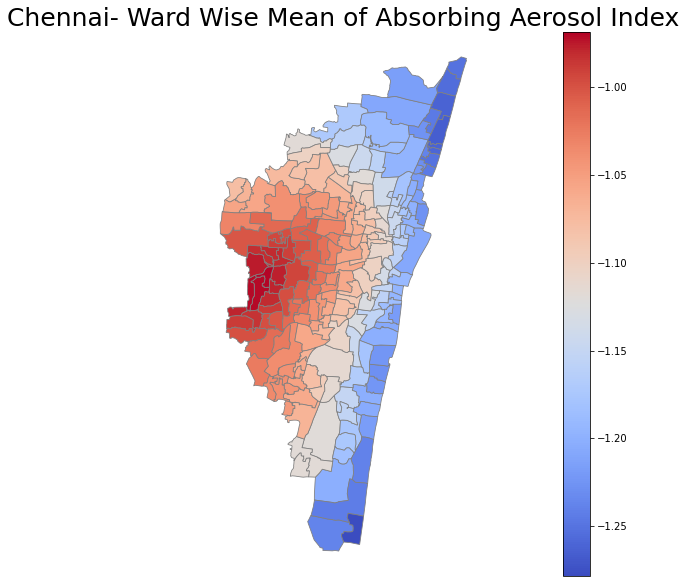

In [84]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values
vmin, vmax = merged_Chennai["mean"].min(), merged_Chennai["mean"].max()
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(30, 10))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('Chennai- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='coolwarm',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 
# empty array for the data range
sm.set_array([]) 
# add the colorbar to the figure
fig.colorbar(sm)
# create map
merged_Chennai.plot(column=variable, cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.5', figsize = (5,15))
plt.show()

In [85]:
# Using T-Test to determine if climate has changed in the first 14 and last 14 months in Chennai
ttest_ind(Monthly_Chennai_mean.iloc[:14,:]["mean"].tolist(),Monthly_Chennai_mean.iloc[14:,:]["mean"].tolist())

Ttest_indResult(statistic=6.962436683330846, pvalue=2.157851807333305e-07)

**We observe that Pollution levels has decreased in the last 14 months and the statistical test proves the same with a very small p-value for 95 % Confidence Interval**

## City Number 9: Hyderabad

### Loading and Visualizing

In [86]:
# g = df1.groupby(pd.Grouper(freq="M"))
# g.mean()
Hyderabad = df["Hyderabad"].groupby(["date"]).mean()
Hyderabad["month"] = Hyderabad.index.month
Hyderabad["year"] = Hyderabad.index.year
Hyderabad

,mean,Ward_No,month,year
date,,,,
2018-07-11,-0.225782,77.151724,7,2018
2018-07-12,-0.335623,77.151724,7,2018
2018-07-13,-0.820834,77.151724,7,2018
2018-07-14,-0.418168,77.151724,7,2018
2018-07-15,-1.409618,77.151724,7,2018
...,...,...,...,...
2020-10-09,-1.058768,77.151724,10,2020
2020-10-10,-0.643308,77.151724,10,2020
2020-10-11,-0.905575,77.151724,10,2020


In [87]:
# Aggregate statistics grouped by Weeks
Weekly_Hyderabad_mean = Hyderabad.groupby(pd.Grouper(freq="W-MON")).mean()
Weekly_Hyderabad_max = Hyderabad.groupby(pd.Grouper(freq="W-MON")).max()
Weekly_Hyderabad_min = Hyderabad.groupby(pd.Grouper(freq="W-MON")).min()

# Aggregate statistics grouped by Months
Monthly_Hyderabad_mean = Hyderabad.groupby(pd.Grouper(freq="M")).mean()
Monthly_Hyderabad_max = Hyderabad.groupby(pd.Grouper(freq="M")).max()
Monthly_Hyderabad_min = Hyderabad.groupby(pd.Grouper(freq="M")).min()

#Week Identifier
Weekly_Hyderabad_mean["week"] = Weekly_Hyderabad_mean.index.isocalendar().week
Weekly_Hyderabad_min["week"] = Weekly_Hyderabad_min.index.isocalendar().week
Weekly_Hyderabad_max["week"] = Weekly_Hyderabad_max.index.isocalendar().week

Monthly_Hyderabad_mean["week"] = Monthly_Hyderabad_mean.index.isocalendar().week
Monthly_Hyderabad_min["week"] = Monthly_Hyderabad_min.index.isocalendar().week
Monthly_Hyderabad_max["week"] = Monthly_Hyderabad_max.index.isocalendar().week

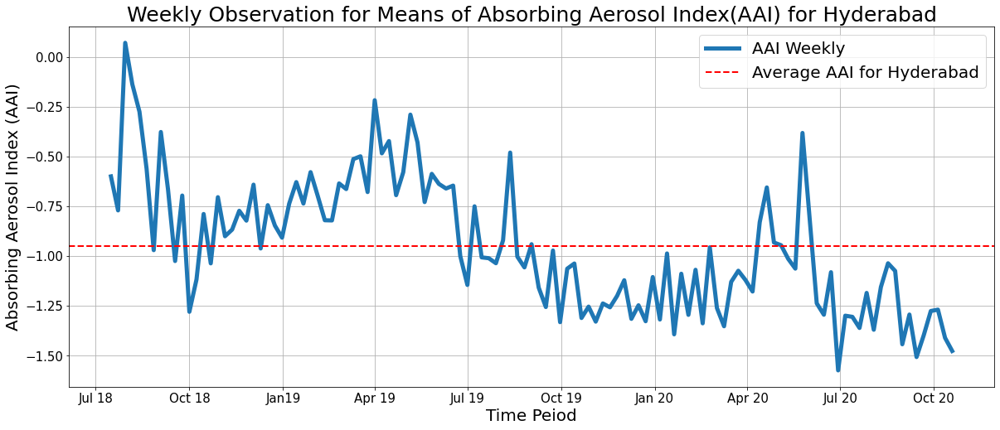

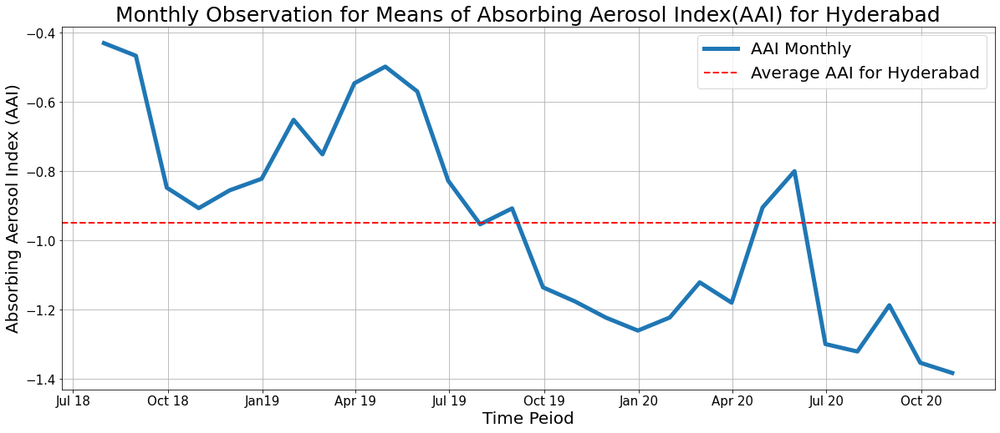

In [88]:
# Visualizing by grouping into weeekly data
plt.figure(figsize = (20,8))
plt.plot( Weekly_Hyderabad_mean.index.tolist(),Weekly_Hyderabad_mean["mean"], linewidth = 5, label = "AAI Weekly")
plt.gca().axhline(y=Weekly_Hyderabad_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Hyderabad")
plt.title("Weekly Observation for Means of Absorbing Aerosol Index(AAI) for Hyderabad",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

# Visualizing by grouping into Monthly data
plt.figure(figsize = (20,8))
plt.plot( Monthly_Hyderabad_mean.index.tolist(),Monthly_Hyderabad_mean["mean"], linewidth = 5, label = "AAI Monthly")
plt.gca().axhline(y=Monthly_Hyderabad_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Hyderabad")
plt.title("Monthly Observation for Means of Absorbing Aerosol Index(AAI) for Hyderabad",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

**We will now plot some useful insights with Monthly Data**

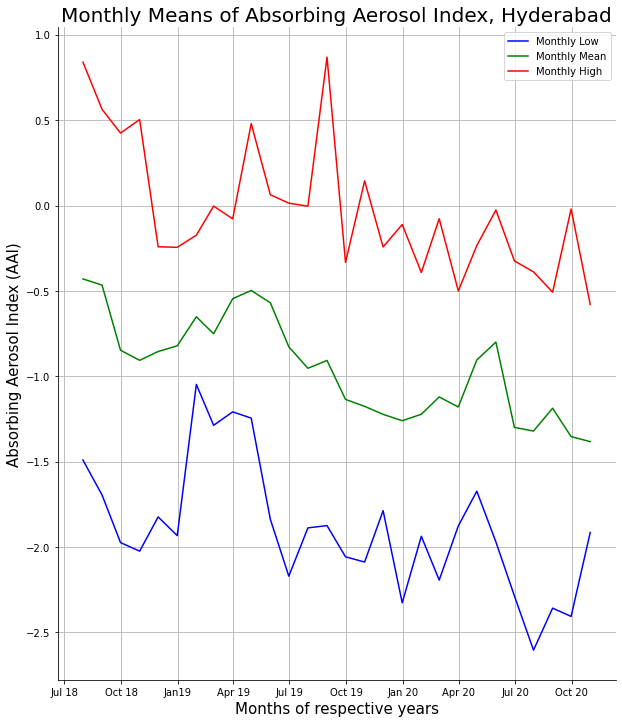

In [89]:
# Plotting Monthly means 
plt.figure(figsize=(10,12))
plt.plot(list(Monthly_Hyderabad_min.index),list(Monthly_Hyderabad_min["mean"]), label = "Monthly Low", color = "blue" )
plt.plot(list(Monthly_Hyderabad_mean.index),list(Monthly_Hyderabad_mean["mean"]), label= "Monthly Mean" , color ="green")
plt.plot(list(Monthly_Hyderabad_max.index),list(Monthly_Hyderabad_max["mean"]), label = "Monthly High", color = "red" )

plt.xlabel("Months of respective years",fontsize= 15)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Monthly Means of Absorbing Aerosol Index, Hyderabad",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 15)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels)
plt.legend()
plt.grid()


We can observe that Aerosol Optical Depth has decreased in the past year. The change in policies, Even Odd Rule and Coronavirus Pandemic seems to have shifted the curve down.

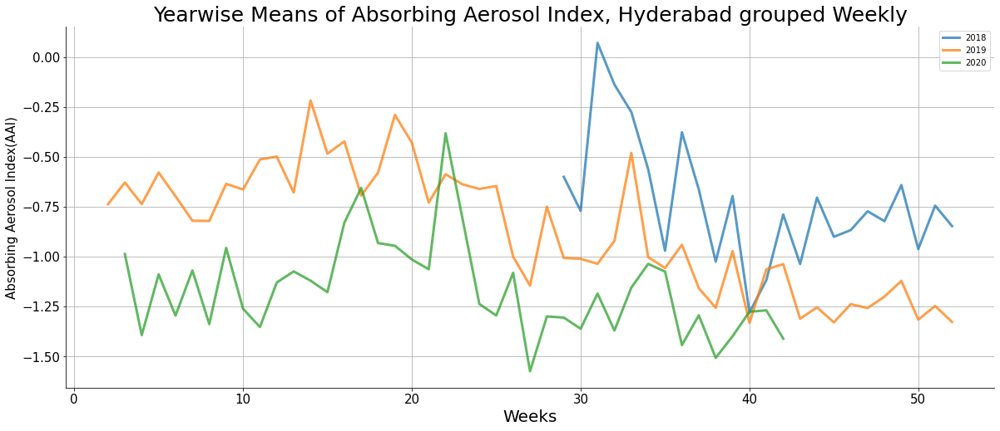

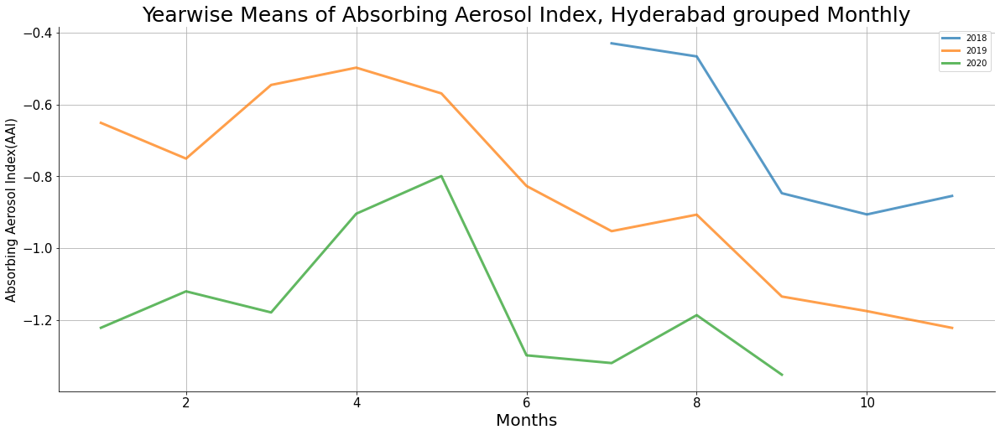

In [90]:
# Plotting Yearwise means
x = [i for i in range(1,13)]
plt.figure(figsize = (20,8))
plt.plot(Weekly_Hyderabad_mean[Weekly_Hyderabad_mean["year"] == 2018]["week"].tolist()[:-1],Weekly_Hyderabad_mean[Weekly_Hyderabad_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Weekly_Hyderabad_mean[Weekly_Hyderabad_mean["year"] == 2019]["week"].tolist()[:-1],Weekly_Hyderabad_mean[Weekly_Hyderabad_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Weekly_Hyderabad_mean[Weekly_Hyderabad_mean["year"] == 2020]["week"].tolist()[:-1],Weekly_Hyderabad_mean[Weekly_Hyderabad_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Weeks",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Yearwise Means of Absorbing Aerosol Index, Hyderabad grouped Weekly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.grid()
plt.legend()

plt.figure(figsize = (20,8))
plt.plot(Monthly_Hyderabad_mean[Monthly_Hyderabad_mean["year"] == 2018]["month"].tolist()[:-1],Monthly_Hyderabad_mean[Monthly_Hyderabad_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Monthly_Hyderabad_mean[Monthly_Hyderabad_mean["year"] == 2019]["month"].tolist()[:-1],Monthly_Hyderabad_mean[Monthly_Hyderabad_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Monthly_Hyderabad_mean[Monthly_Hyderabad_mean["year"] == 2020]["month"].tolist()[:-1],Monthly_Hyderabad_mean[Monthly_Hyderabad_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Months",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.title("Yearwise Means of Absorbing Aerosol Index, Hyderabad grouped Monthly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.grid()
plt.legend()

The observation from the above graph is that, the Absorbing Aerosol Index values have come down considerably in the last two years. From the graph it is evident that the Aerosol Index values are lesser in 2020. Therefore it can be concluded that the polution in Delhi has been lower in 2020 compared to the previous two years.

### Plotting Maps For Insights

In [91]:
# Grouping by Wards Data for further analysis
Hyderabad_wards = df["Hyderabad"].groupby(["Ward_No"]).mean()
Hyderabad_wards

,mean
Ward_No,
1,-1.023057
2,-0.998717
5,-0.991334
6,-0.973988
7,-0.976252
...,...
146,-0.939073
147,-0.939450
148,-0.948392


<AxesSubplot:>

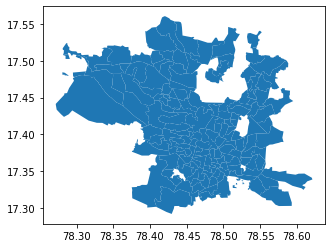

In [92]:
# loading the shapefile
path = r'Cleaned CSVs/Hyderabad/ghmc-wards-polygon.shp'
map_Hyderabad = gpd.read_file(path)
map_Hyderabad["Ward_No"] = [i.split()[1] for i in map_Hyderabad["name"].tolist()]
map_Hyderabad["Ward_No"] = map_Hyderabad["Ward_No"].astype(int) 
# Viewing the shapefile
map_Hyderabad.plot()

In [93]:
# merging the shapefile with the mean data
merged_Hyderabad = map_Hyderabad.merge(Hyderabad_wards, left_on = "Ward_No", right_index = True)
# merged_Hyderabad.head()
merged_Hyderabad

,id,@id,admin_leve,boundary,name,type,@timestamp,@version,@changeset,@user,@uid,geometry,Ward_No,mean
0,relation/7848799,relation/7848799,10,administrative,Ward 91 Khairatabad,boundary,2017-12-31,5,55064631,adivik2000,250196,"POLYGON ((78.45243 17.42676, 78.45292 17.42751...",91,-0.946269
1,relation/7848824,relation/7848824,10,administrative,Ward 105 Gachibowli,boundary,2018-01-01,4,55086287,adivik2000,250196,"POLYGON ((78.31078 17.48009, 78.31962 17.47938...",105,-0.996943
2,relation/7848844,relation/7848844,10,administrative,Ward 60 Rajendra Nagar,boundary,2018-01-02,4,55094174,adivik2000,250196,"POLYGON ((78.41015 17.37208, 78.41221 17.37149...",60,-1.019533
3,relation/7848859,relation/7848859,10,administrative,Ward 95 Jubilee Hills,boundary,2017-12-31,5,55064040,adivik2000,250196,"POLYGON ((78.43691 17.43014, 78.43647 17.42948...",95,-0.948463
4,relation/7849315,relation/7849315,10,administrative,Ward 6 Nacharam,boundary,2017-12-30,4,55028223,adivik2000,250196,"POLYGON ((78.54860 17.43451, 78.55180 17.43367...",6,-0.973988
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
140,relation/7867250,relation/7867250,10,administrative,Ward 112 Ramachandrapuram,boundary,2018-01-03,2,55128738,adivik2000,250196,"POLYGON ((78.28733 17.52436, 78.28748 17.52315...",112,-1.000160
141,relation/7867251,relation/7867251,10,administrative,Ward 111 Bharati Nagar,boundary,2018-01-03,2,55128738,adivik2000,250196,"MULTIPOLYGON (((78.28909 17.50801, 78.29091 17...",111,-1.002030
142,relation/7867252,relation/7867252,10,administrative,Ward 30 Dabeerpura,boundary,2018-01-02,3,55100180,adivik2000,250196,"POLYGON ((78.49242 17.36115, 78.49253 17.35985...",30,-0.894636
143,relation/7867584,relation/7867584,10,administrative,Ward 42 Barkas,boundary,2018-01-03,2,55128738,adivik2000,250196,"POLYGON ((78.48316 17.31318, 78.47867 17.31432...",42,-0.950689


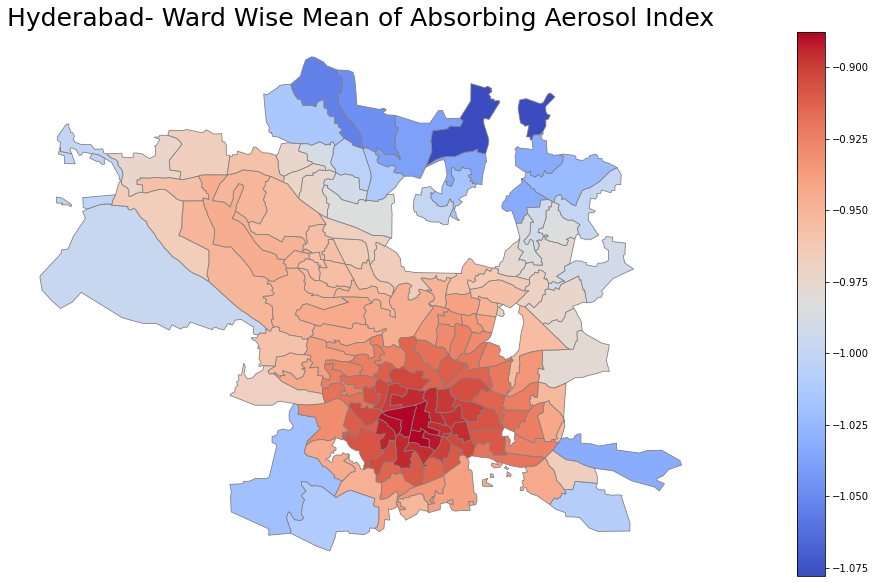

In [94]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values
vmin, vmax = merged_Hyderabad["mean"].min(), merged_Hyderabad["mean"].max()
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(30, 10))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('Hyderabad- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='coolwarm',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 
# empty array for the data range
sm.set_array([]) 
# add the colorbar to the figure
fig.colorbar(sm)
# create map
merged_Hyderabad.plot(column=variable, cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.5', figsize = (5,15))
plt.show()

In [95]:
# Using T-Test to determine if climate has changed in the first 14 and last 14 months in Hyderabad
ttest_ind(Monthly_Hyderabad_mean.iloc[:14,:]["mean"].tolist(),Monthly_Hyderabad_mean.iloc[14:,:]["mean"].tolist())

Ttest_indResult(statistic=7.138772235499001, pvalue=1.3971545720645874e-07)

**We observe that Pollution levels has decreased in the last 14 months and the statistical test proves the same with a very small p-value for 95 % Confidence Interval**

## City Number 10: Jaipur

### Loading and Visualizing

In [96]:
# g = df1.groupby(pd.Grouper(freq="M"))
# g.mean()
Jaipur = df["Jaipur"].groupby(["date"]).mean()
Jaipur["month"] = Jaipur.index.month
Jaipur["year"] = Jaipur.index.year
Jaipur

,Ward_No,mean,month,year
date,,,,
2018-07-11,39.0,-0.091655,7,2018
2018-07-12,39.0,-0.349608,7,2018
2018-07-13,39.0,-0.133120,7,2018
2018-07-15,39.0,-1.357538,7,2018
2018-07-16,39.0,-0.895579,7,2018
...,...,...,...,...
2020-10-09,39.0,-0.805891,10,2020
2020-10-10,39.0,-0.819039,10,2020
2020-10-11,39.0,-0.731614,10,2020


In [97]:
# Aggregate statistics grouped by Weeks
Weekly_Jaipur_mean = Jaipur.groupby(pd.Grouper(freq="W-MON")).mean()
Weekly_Jaipur_max = Jaipur.groupby(pd.Grouper(freq="W-MON")).max()
Weekly_Jaipur_min = Jaipur.groupby(pd.Grouper(freq="W-MON")).min()

# Aggregate statistics grouped by Months
Monthly_Jaipur_mean = Jaipur.groupby(pd.Grouper(freq="M")).mean()
Monthly_Jaipur_max = Jaipur.groupby(pd.Grouper(freq="M")).max()
Monthly_Jaipur_min = Jaipur.groupby(pd.Grouper(freq="M")).min()

#Week Identifier
Weekly_Jaipur_mean["week"] = Weekly_Jaipur_mean.index.isocalendar().week
Weekly_Jaipur_min["week"] = Weekly_Jaipur_min.index.isocalendar().week
Weekly_Jaipur_max["week"] = Weekly_Jaipur_max.index.isocalendar().week

Monthly_Jaipur_mean["week"] = Monthly_Jaipur_mean.index.isocalendar().week
Monthly_Jaipur_min["week"] = Monthly_Jaipur_min.index.isocalendar().week
Monthly_Jaipur_max["week"] = Monthly_Jaipur_max.index.isocalendar().week

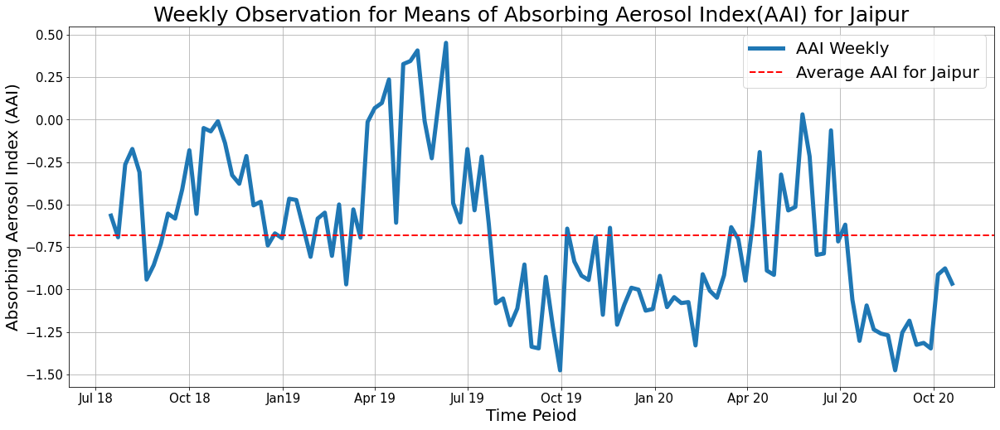

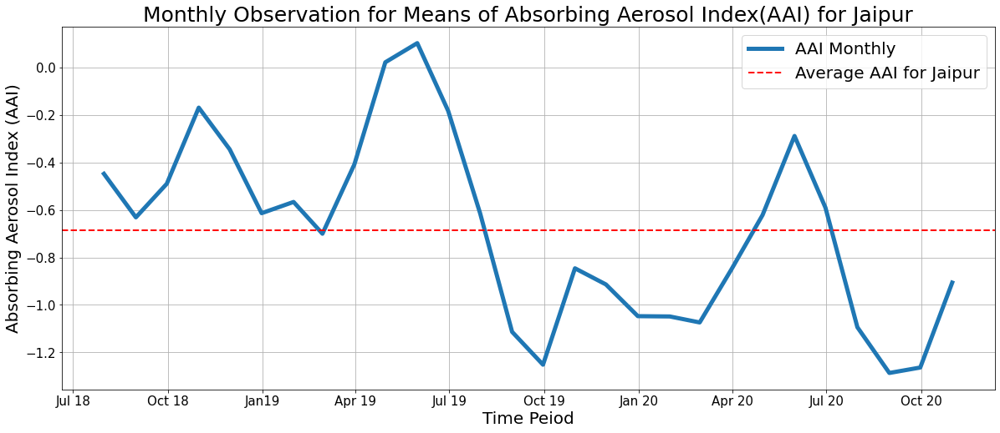

In [98]:
# Visualizing by grouping into weeekly data
plt.figure(figsize = (20,8))
plt.plot( Weekly_Jaipur_mean.index.tolist(),Weekly_Jaipur_mean["mean"], linewidth = 5, label = "AAI Weekly")
plt.gca().axhline(y=Weekly_Jaipur_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Jaipur")
plt.title("Weekly Observation for Means of Absorbing Aerosol Index(AAI) for Jaipur",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

# Visualizing by grouping into Monthly data
plt.figure(figsize = (20,8))
plt.plot( Monthly_Jaipur_mean.index.tolist(),Monthly_Jaipur_mean["mean"], linewidth = 5, label = "AAI Monthly")
plt.gca().axhline(y=Monthly_Jaipur_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Jaipur")
plt.title("Monthly Observation for Means of Absorbing Aerosol Index(AAI) for Jaipur",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

**We will now plot some useful insights with Monthly Data**

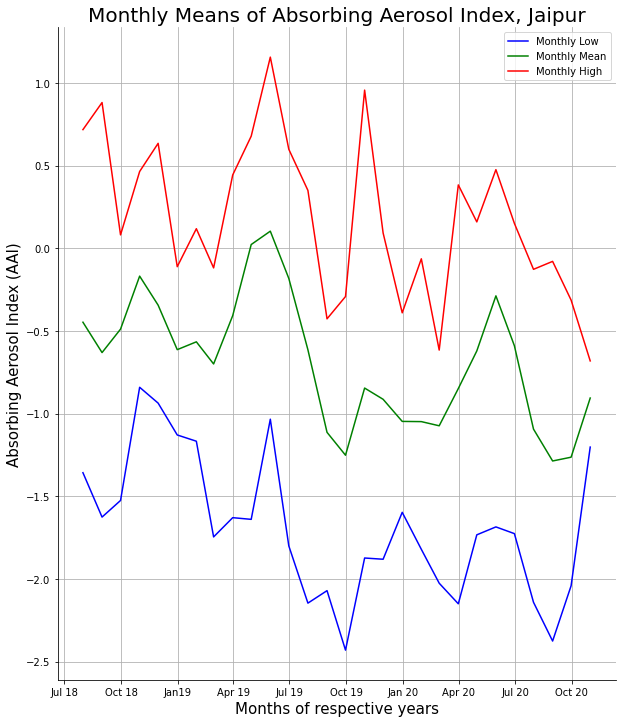

In [99]:
# Plotting Monthly means 
plt.figure(figsize=(10,12))
plt.plot(list(Monthly_Jaipur_min.index),list(Monthly_Jaipur_min["mean"]), label = "Monthly Low", color = "blue" )
plt.plot(list(Monthly_Jaipur_mean.index),list(Monthly_Jaipur_mean["mean"]), label= "Monthly Mean" , color ="green")
plt.plot(list(Monthly_Jaipur_max.index),list(Monthly_Jaipur_max["mean"]), label = "Monthly High", color = "red" )

plt.xlabel("Months of respective years",fontsize= 15)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Monthly Means of Absorbing Aerosol Index, Jaipur",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 15)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels)
plt.legend()
plt.grid()


We can observe that Aerosol Optical Depth has decreased in the past year. The change in policies, Even Odd Rule and Coronavirus Pandemic seems to have shifted the curve down.

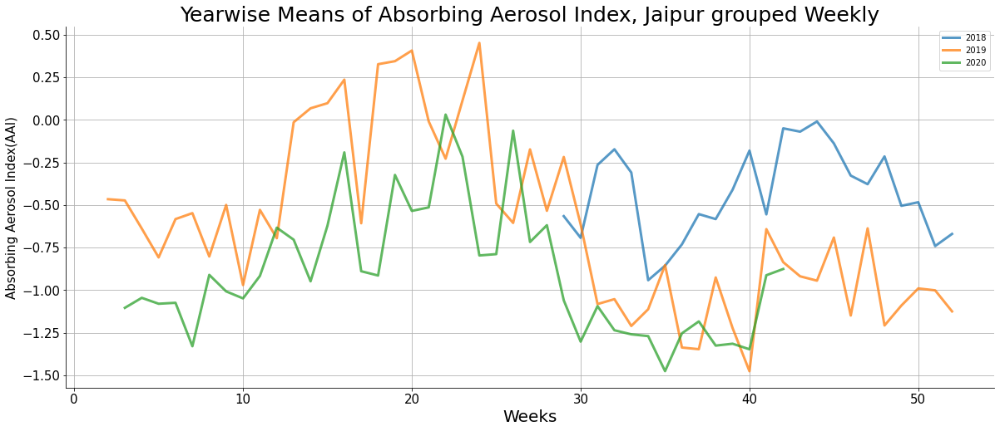

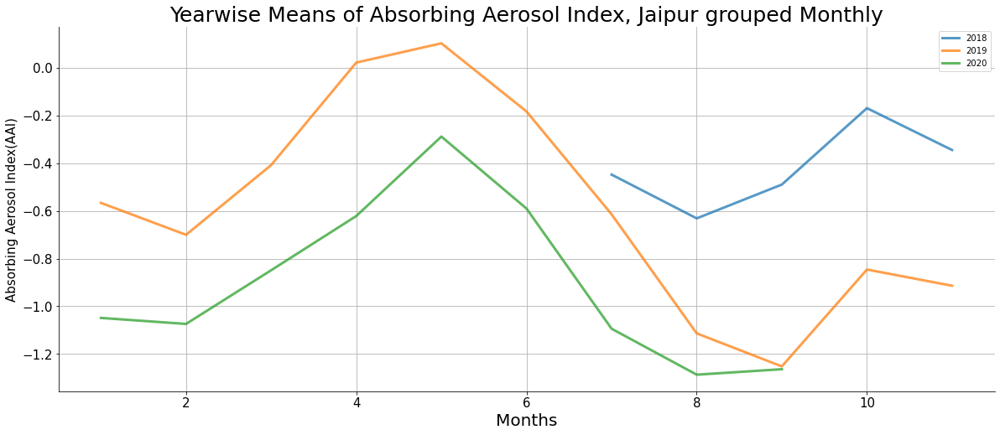

In [100]:
# Plotting Yearwise means
x = [i for i in range(1,13)]
plt.figure(figsize = (20,8))
plt.plot(Weekly_Jaipur_mean[Weekly_Jaipur_mean["year"] == 2018]["week"].tolist()[:-1],Weekly_Jaipur_mean[Weekly_Jaipur_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Weekly_Jaipur_mean[Weekly_Jaipur_mean["year"] == 2019]["week"].tolist()[:-1],Weekly_Jaipur_mean[Weekly_Jaipur_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Weekly_Jaipur_mean[Weekly_Jaipur_mean["year"] == 2020]["week"].tolist()[:-1],Weekly_Jaipur_mean[Weekly_Jaipur_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Weeks",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Yearwise Means of Absorbing Aerosol Index, Jaipur grouped Weekly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.grid()
plt.legend()

plt.figure(figsize = (20,8))
plt.plot(Monthly_Jaipur_mean[Monthly_Jaipur_mean["year"] == 2018]["month"].tolist()[:-1],Monthly_Jaipur_mean[Monthly_Jaipur_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Monthly_Jaipur_mean[Monthly_Jaipur_mean["year"] == 2019]["month"].tolist()[:-1],Monthly_Jaipur_mean[Monthly_Jaipur_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Monthly_Jaipur_mean[Monthly_Jaipur_mean["year"] == 2020]["month"].tolist()[:-1],Monthly_Jaipur_mean[Monthly_Jaipur_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Months",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.title("Yearwise Means of Absorbing Aerosol Index, Jaipur grouped Monthly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.grid()
plt.legend()

The observation from the above graph is that, the Absorbing Aerosol Index values have come down considerably in the last two years. From the graph it is evident that the Aerosol Index values are lesser in 2020. Therefore it can be concluded that the polution in Delhi has been lower in 2020 compared to the previous two years.

### Plotting Maps For Insights

In [101]:
# Grouping by Wards Data for further analysis
Jaipur_wards = df["Jaipur"].groupby(["Ward_No"]).mean()
Jaipur_wards

,mean
Ward_No,
1,-0.765325
2,-0.678072
3,-0.694134
4,-0.713368
5,-0.662916
...,...
73,-0.766756
74,-0.769348
75,-0.806649


<AxesSubplot:>

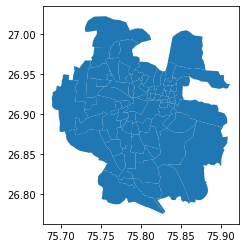

In [102]:
# loading the shapefile
path = r'Cleaned CSVs/Jaipur/Jaipur_Wards-polygon.shp'
map_Jaipur = gpd.read_file(path)
map_Jaipur["WARD_NO"] = map_Jaipur["WARD_NO"].astype(int)
# Viewing the shapefile
map_Jaipur.plot()

In [103]:
# merging the shapefile with the mean data
merged_Jaipur = map_Jaipur.merge(Jaipur_wards, left_on = "WARD_NO", right_index = True)
# merged_Jaipur.head()
merged_Jaipur

,OBJECTID,WARD_NO,ZONE_NAME,AC_NO,AC,Shape_Leng,Shape_Area,geometry,mean
0,1,76,HAWA MAHAL,49,HAWA MAHAL,0.185122,0.001005,"POLYGON ((75.88071 26.95447, 75.88130 26.95433...",-0.837085
1,2,34,BAGRU ANSIK,56,BAGRU ANSIK,0.323362,0.003600,"POLYGON ((75.86130 26.78845, 75.86092 26.78949...",-0.760570
2,3,11,JHOTWARA ANSIK,46,JHOTWARA ANSIK,0.196200,0.000891,"POLYGON ((75.73039 26.96676, 75.73187 26.96650...",-0.641574
3,4,12,JHOTWARA ANSIK,46,JHOTWARA ANSIK,0.239431,0.001858,"POLYGON ((75.71488 26.94230, 75.71520 26.94221...",-0.671061
4,5,13,JHOTWARA ANSIK,46,JHOTWARA ANSIK,0.128021,0.000630,"POLYGON ((75.74591 26.92325, 75.74612 26.92299...",-0.617623
...,...,...,...,...,...,...,...,...,...
72,73,6,VIDHYADHAR NAGAR,50,VIDHYADHAR NAGAR,0.085999,0.000324,"POLYGON ((75.77275 26.96986, 75.77280 26.96968...",-0.656043
73,74,7,VIDHYADHAR NAGAR,50,VIDHYADHAR NAGAR,0.094575,0.000436,"POLYGON ((75.75743 26.96307, 75.75751 26.96297...",-0.647106
74,75,9,VIDHYADHAR NAGAR,50,VIDHYADHAR NAGAR,0.052066,0.000131,"POLYGON ((75.75388 26.94220, 75.75474 26.94215...",-0.628341
75,76,10,VIDHYADHAR NAGAR,50,VIDHYADHAR NAGAR,0.086027,0.000348,"POLYGON ((75.74407 26.93651, 75.74439 26.93378...",-0.624840


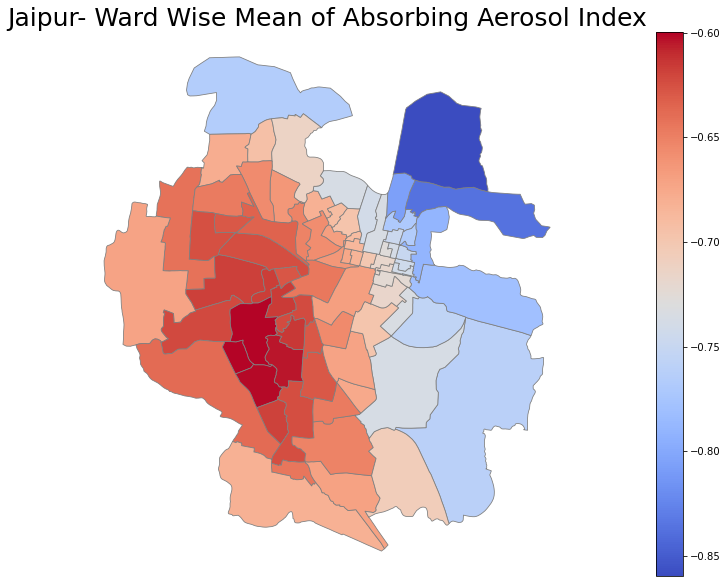

In [104]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values
vmin, vmax = merged_Jaipur["mean"].min(), merged_Jaipur["mean"].max()
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(30, 10))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('Jaipur- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='coolwarm',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 
# empty array for the data range
sm.set_array([]) 
# add the colorbar to the figure
fig.colorbar(sm)
# create map
merged_Jaipur.plot(column=variable, cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.5', figsize = (5,15))
plt.show()

In [105]:
# Using T-Test to determine if climate has changed in the first 14 and last 14 months in Jaipur
ttest_ind(Monthly_Jaipur_mean.iloc[:14,:]["mean"].tolist(),Monthly_Jaipur_mean.iloc[14:,:]["mean"].tolist())

Ttest_indResult(statistic=4.35364947430119, pvalue=0.00018499961790097988)

**We observe that Pollution levels has decreased in the last 14 months and the statistical test proves the same with a very small p-value for 95 % Confidence Interval**

## City Number 11: Kolkata

In [106]:
# g = df1.groupby(pd.Grouper(freq="M"))
# g.mean()
Kolkata = df["Kolkata"].groupby(["date"]).mean()
Kolkata["month"] = Kolkata.index.month
Kolkata["year"] = Kolkata.index.year
Kolkata

,Ward_No,mean,month,year
date,,,,
2018-07-11,71,-1.469816,7,2018
2018-07-12,71,-1.446685,7,2018
2018-07-13,71,-0.944395,7,2018
2018-07-14,71,-0.602620,7,2018
2018-07-15,71,-1.058017,7,2018
...,...,...,...,...
2020-10-09,71,-1.950946,10,2020
2020-10-10,71,-1.609517,10,2020
2020-10-11,71,-1.321279,10,2020


In [107]:
# Aggregate statistics grouped by Weeks
Weekly_Kolkata_mean = Kolkata.groupby(pd.Grouper(freq="W-MON")).mean()
Weekly_Kolkata_max = Kolkata.groupby(pd.Grouper(freq="W-MON")).max()
Weekly_Kolkata_min = Kolkata.groupby(pd.Grouper(freq="W-MON")).min()

# Aggregate statistics grouped by Months
Monthly_Kolkata_mean = Kolkata.groupby(pd.Grouper(freq="M")).mean()
Monthly_Kolkata_max = Kolkata.groupby(pd.Grouper(freq="M")).max()
Monthly_Kolkata_min = Kolkata.groupby(pd.Grouper(freq="M")).min()

#Week Identifier
Weekly_Kolkata_mean["week"] = Weekly_Kolkata_mean.index.isocalendar().week
Weekly_Kolkata_min["week"] = Weekly_Kolkata_min.index.isocalendar().week
Weekly_Kolkata_max["week"] = Weekly_Kolkata_max.index.isocalendar().week

Monthly_Kolkata_mean["week"] = Monthly_Kolkata_mean.index.isocalendar().week
Monthly_Kolkata_min["week"] = Monthly_Kolkata_min.index.isocalendar().week
Monthly_Kolkata_max["week"] = Monthly_Kolkata_max.index.isocalendar().week

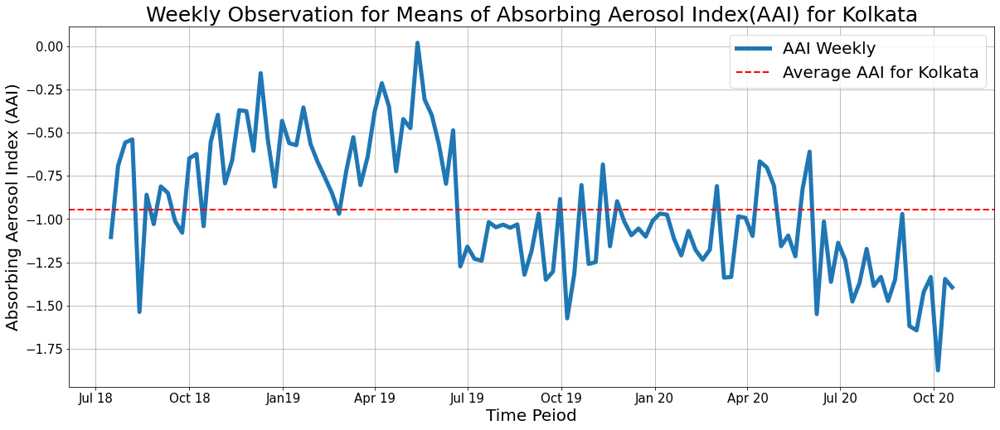

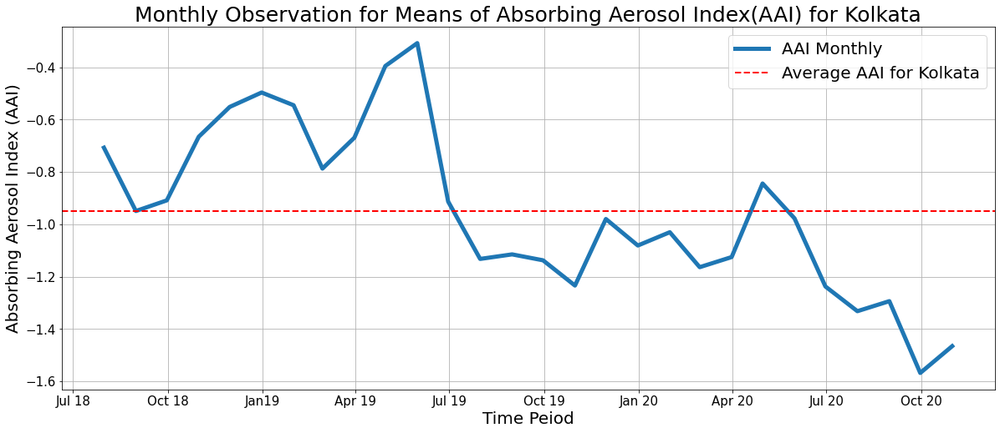

In [108]:
# Visualizing by grouping into weeekly data
plt.figure(figsize = (20,8))
plt.plot( Weekly_Kolkata_mean.index.tolist(),Weekly_Kolkata_mean["mean"], linewidth = 5, label = "AAI Weekly")
plt.gca().axhline(y=Weekly_Kolkata_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Kolkata")
plt.title("Weekly Observation for Means of Absorbing Aerosol Index(AAI) for Kolkata",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

# Visualizing by grouping into Monthly data
plt.figure(figsize = (20,8))
plt.plot( Monthly_Kolkata_mean.index.tolist(),Monthly_Kolkata_mean["mean"], linewidth = 5, label = "AAI Monthly")
plt.gca().axhline(y=Monthly_Kolkata_mean["mean"].mean(),color='r', linestyle='--', lw=2, label = "Average AAI for Kolkata")
plt.title("Monthly Observation for Means of Absorbing Aerosol Index(AAI) for Kolkata",fontsize = 25)
plt.xlabel("Time Peiod",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 20)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels, fontsize = 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
# plt.gca().set_yticklabels(plt.gca().get_yticklabels(),fontsize = 10)
plt.legend(fontsize = 20)
plt.grid()

**We will now plot some useful insights with Monthly Data**

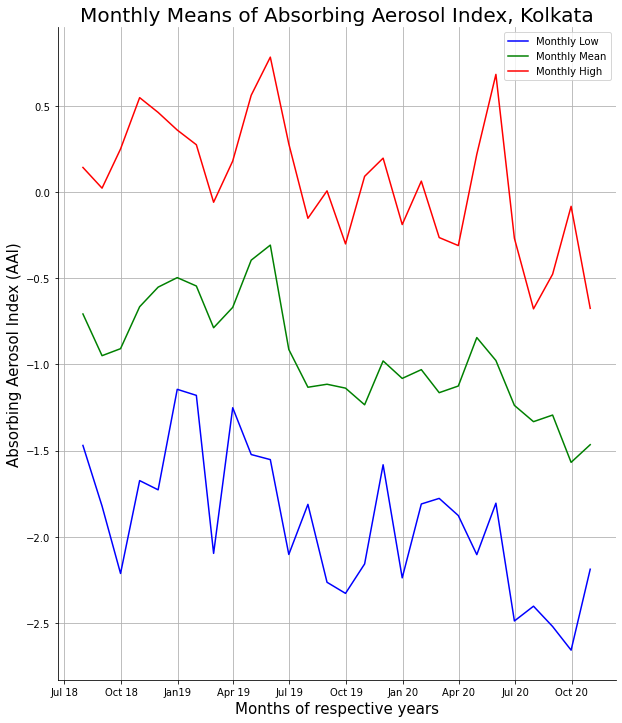

In [109]:
# Plotting Monthly means 
plt.figure(figsize=(10,12))
plt.plot(list(Monthly_Kolkata_min.index),list(Monthly_Kolkata_min["mean"]), label = "Monthly Low", color = "blue" )
plt.plot(list(Monthly_Kolkata_mean.index),list(Monthly_Kolkata_mean["mean"]), label= "Monthly Mean" , color ="green")
plt.plot(list(Monthly_Kolkata_max.index),list(Monthly_Kolkata_max["mean"]), label = "Monthly High", color = "red" )

plt.xlabel("Months of respective years",fontsize= 15)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Monthly Means of Absorbing Aerosol Index, Kolkata",fontsize= 20)
plt.ylabel("Absorbing Aerosol Index (AAI)",fontsize= 15)
xticklabels = ['Jul 18','Oct 18','Jan19','Apr 19','Jul 19', 'Oct 19', 'Jan 20', 'Apr 20', 'Jul 20', 'Oct 20']
plt.gca().set_xticklabels(xticklabels)
plt.legend()
plt.grid()


We can observe that Aerosol Optical Depth has decreased in the past year. The change in policies, Even Odd Rule and Coronavirus Pandemic seems to have shifted the curve down.

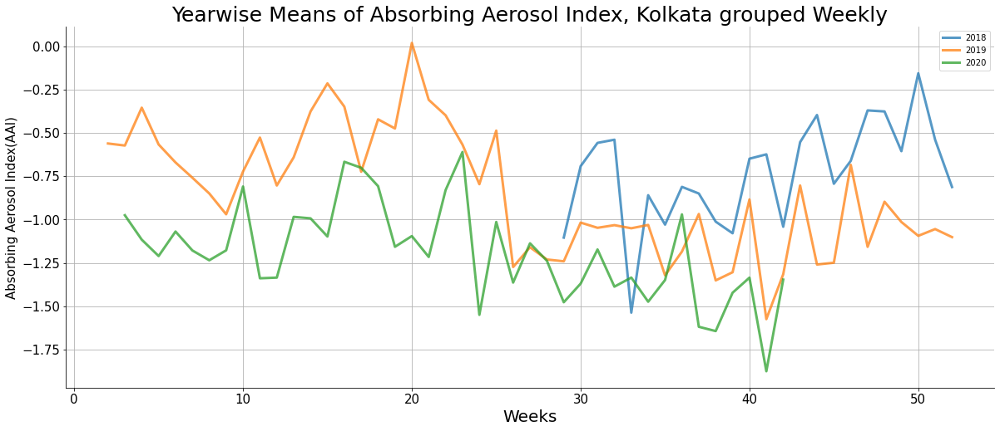

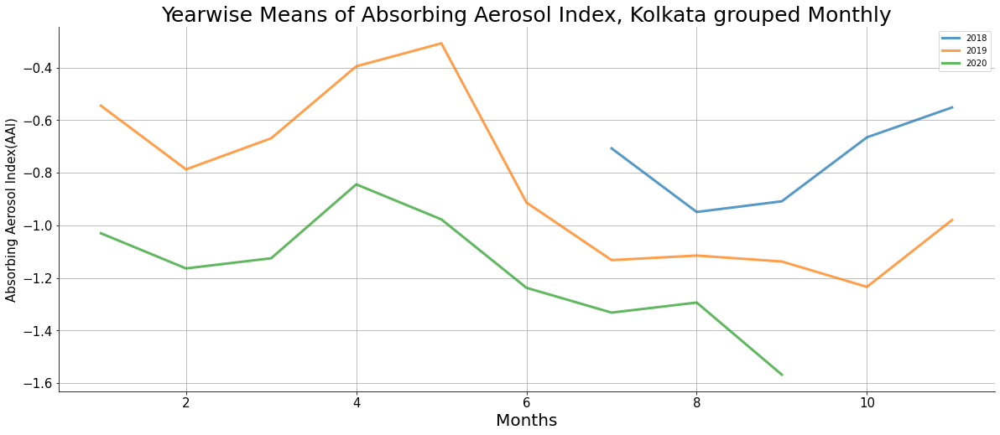

In [110]:
# Plotting Yearwise means
x = [i for i in range(1,13)]
plt.figure(figsize = (20,8))
plt.plot(Weekly_Kolkata_mean[Weekly_Kolkata_mean["year"] == 2018]["week"].tolist()[:-1],Weekly_Kolkata_mean[Weekly_Kolkata_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Weekly_Kolkata_mean[Weekly_Kolkata_mean["year"] == 2019]["week"].tolist()[:-1],Weekly_Kolkata_mean[Weekly_Kolkata_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Weekly_Kolkata_mean[Weekly_Kolkata_mean["year"] == 2020]["week"].tolist()[:-1],Weekly_Kolkata_mean[Weekly_Kolkata_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Weeks",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.title("Yearwise Means of Absorbing Aerosol Index, Kolkata grouped Weekly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.grid()
plt.legend()

plt.figure(figsize = (20,8))
plt.plot(Monthly_Kolkata_mean[Monthly_Kolkata_mean["year"] == 2018]["month"].tolist()[:-1],Monthly_Kolkata_mean[Monthly_Kolkata_mean["year"] == 2018]["mean"].tolist()[:-1] , label = "2018", lw = 3, alpha = 0.75)
plt.plot(Monthly_Kolkata_mean[Monthly_Kolkata_mean["year"] == 2019]["month"].tolist()[:-1],Monthly_Kolkata_mean[Monthly_Kolkata_mean["year"] == 2019]["mean"].tolist()[:-1] , label = "2019" , lw =3, alpha = 0.75)
plt.plot(Monthly_Kolkata_mean[Monthly_Kolkata_mean["year"] == 2020]["month"].tolist()[:-1],Monthly_Kolkata_mean[Monthly_Kolkata_mean["year"] == 2020]["mean"].tolist()[:-1]  , label = "2020", lw = 3, alpha = 0.75)

plt.xlabel("Months",fontsize= 20)
plt.gca().spines['top'].set_visible(False)
plt.gca().spines['right'].set_visible(False)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.title("Yearwise Means of Absorbing Aerosol Index, Kolkata grouped Monthly",fontsize= 25)
plt.ylabel("Absorbing Aerosol Index(AAI)",fontsize= 15)
plt.grid()
plt.legend()

The observation from the above graph is that, the Absorbing Aerosol Index values have come down considerably in the last two years. From the graph it is evident that the Aerosol Index values are lesser in 2020. Therefore it can be concluded that the polution in Delhi has been lower in 2020 compared to the previous two years.

### Plotting Maps For Insights

In [111]:
# Grouping by Wards Data for further analysis
Kolkata_wards = df["Kolkata"].groupby(["Ward_No"]).mean()
Kolkata_wards

,mean
Ward_No,
1,-0.934003
2,-0.932568
3,-0.924106
4,-0.928921
5,-0.924812
...,...
137,-0.975984
138,-0.983189
139,-0.983234


<AxesSubplot:>

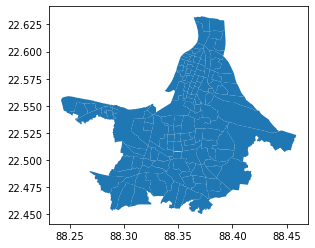

In [112]:
# loading the shapefile
path = r'Cleaned CSVs/Kolkata/kolkata-polygon.shp'
map_Kolkata = gpd.read_file(path)
map_Kolkata["WARD"]= map_Kolkata["WARD"].astype(int)
# Viewing the shapefile
map_Kolkata.plot()

In [113]:
# merging the shapefile with the mean data
merged_Kolkata = map_Kolkata.merge(Kolkata_wards, left_on = "WARD", right_index = True)
# merged_Kolkata.head()
merged_Kolkata

,WARD,geometry,mean
0,93,"POLYGON ((88.35296 22.50168, 88.35300 22.50204...",-0.933401
1,61,"POLYGON ((88.35655 22.55349, 88.35656 22.55349...",-0.925042
2,86,"POLYGON ((88.35978 22.52516, 88.35979 22.52516...",-0.930224
3,90,"POLYGON ((88.37161 22.51538, 88.37161 22.51535...",-0.930679
4,26,"POLYGON ((88.35878 22.58862, 88.35882 22.58873...",-0.918075
...,...,...,...
136,35,"POLYGON ((88.37763 22.57034, 88.37826 22.57064...",-0.930629
137,116,"POLYGON ((88.32589 22.49510, 88.32589 22.49518...",-0.945367
138,95,"POLYGON ((88.35105 22.48683, 88.35108 22.48684...",-0.940273
139,30,"POLYGON ((88.38150 22.57798, 88.38152 22.57799...",-0.930493


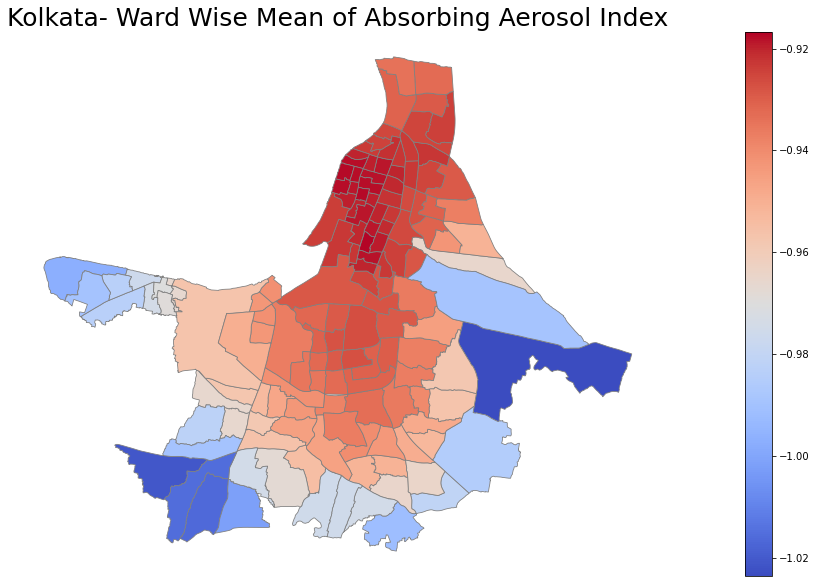

In [114]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values
vmin, vmax = merged_Kolkata["mean"].min(), merged_Kolkata["mean"].max()
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(30, 10))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('Kolkata- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='coolwarm',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 
# empty array for the data range
sm.set_array([]) 
# add the colorbar to the figure
fig.colorbar(sm)
# create map
merged_Kolkata.plot(column=variable, cmap='coolwarm', linewidth=0.8, ax=ax, edgecolor='0.5', figsize = (5,15))
plt.show()

In [115]:
# Using T-Test to determine if climate has changed in the first 14 and last 14 months in Kolkata
ttest_ind(Monthly_Kolkata_mean.iloc[:14,:]["mean"].tolist(),Monthly_Kolkata_mean.iloc[14:,:]["mean"].tolist())

Ttest_indResult(statistic=5.244770969255621, pvalue=1.7633976410214782e-05)

**We observe that Pollution levels has decreased in the last 14 months and the statistical test proves the same with a very small p-value for 95 % Confidence Interval**

# Visualising for India

## Loading and Visualizing

Text(0.5, 1.0, 'Pune')

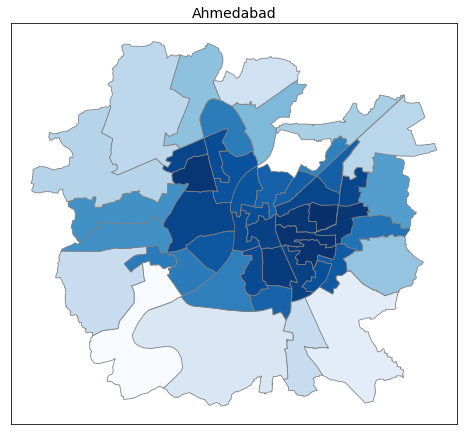

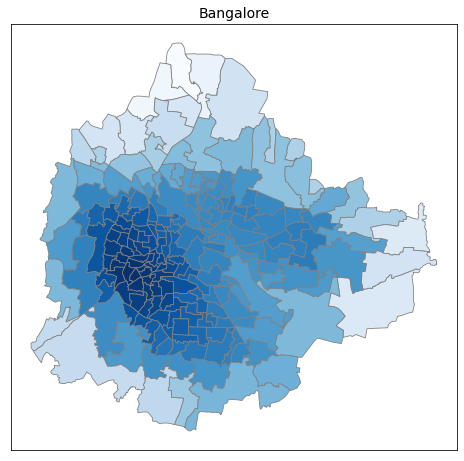

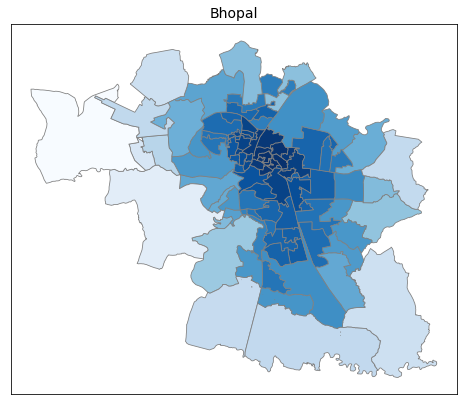

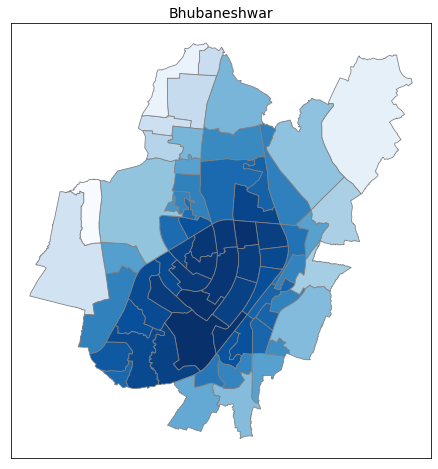

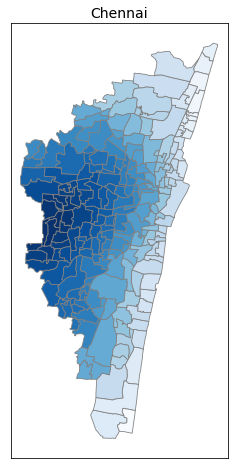

...

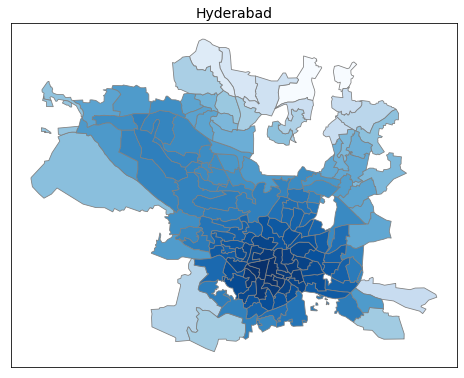

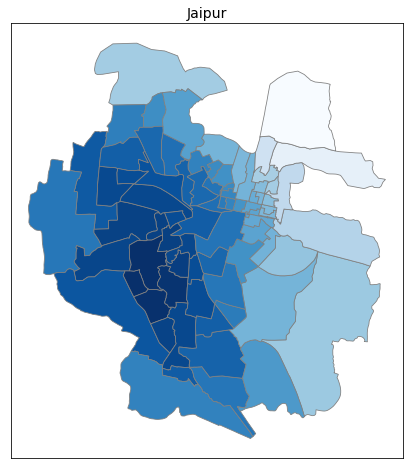

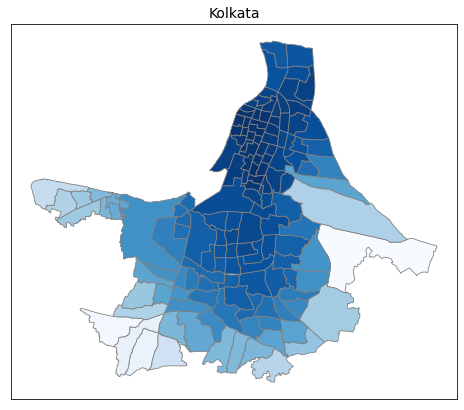

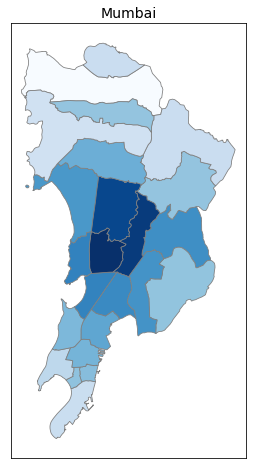

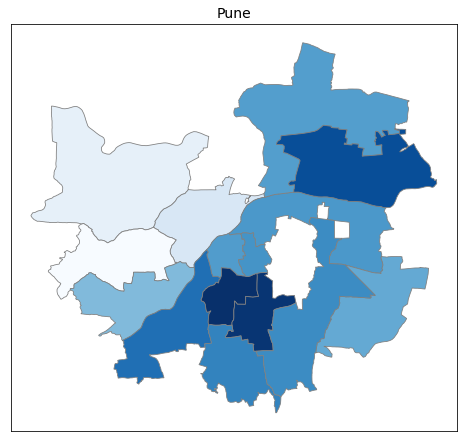

In [116]:
%matplotlib inline

#Plotting all Maps with mean values 

amd= merged_Ahmedabad.plot(column=variable, linewidth=0.8, edgecolor='0.5', cmap = "Blues", figsize= (8,8))
amd.xaxis.set_ticks([])
amd.yaxis.set_ticks([])
amd.set_title("Ahmedabad", fontsize = 14)

bglr=merged_Bangalore.plot(column=variable, linewidth=0.8, edgecolor='0.5', cmap = "Blues", figsize= (8,8))
bglr.xaxis.set_ticks([])
bglr.yaxis.set_ticks([])
bglr.set_title("Bangalore", fontsize = 14)

bpl=merged_Bhopal.plot(column=variable, linewidth=0.8, edgecolor='0.5', cmap = "Blues", figsize= (8,8))
bpl.xaxis.set_ticks([])
bpl.yaxis.set_ticks([])
bpl.set_title("Bhopal", fontsize = 14)

bbr=merged_Bhubaneshwar.plot(column=variable, linewidth=0.8, edgecolor='0.5', cmap = "Blues", figsize= (8,8))
bbr.xaxis.set_ticks([])
bbr.yaxis.set_ticks([])
bbr.set_title("Bhubaneshwar", fontsize = 14)

csk=merged_Chennai.plot(column=variable, linewidth=0.8, edgecolor='0.5', cmap = "Blues", figsize= (8,8))
csk.xaxis.set_ticks([])
csk.yaxis.set_ticks([])
csk.set_title("Chennai", fontsize = 14)

dc=merged_Delhi.plot(column=variable, linewidth=0.8, edgecolor='0.5', cmap = "Blues", figsize= (8,8))
dc.xaxis.set_ticks([])
dc.yaxis.set_ticks([])
dc.set_title("Delhi", fontsize = 14)

srh=merged_Hyderabad.plot(column=variable, linewidth=0.8, edgecolor='0.5', cmap = "Blues", figsize= (8,8))
srh.xaxis.set_ticks([])
srh.yaxis.set_ticks([])
srh.set_title("Hyderabad", fontsize = 14)

rr=merged_Jaipur.plot(column=variable, linewidth=0.8, edgecolor='0.5', cmap = "Blues", figsize= (8,8))
rr.xaxis.set_ticks([])
rr.yaxis.set_ticks([])
rr.set_title("Jaipur", fontsize = 14)

kkr=merged_Kolkata.plot(column=variable, linewidth=0.8, edgecolor='0.5', cmap = "Blues", figsize= (8,8))
kkr.xaxis.set_ticks([])
kkr.yaxis.set_ticks([])
kkr.set_title("Kolkata", fontsize = 14)

MI=merged_Mumbai.plot(column=variable, linewidth=0.8, edgecolor='0.5', cmap = "Blues", figsize= (8,8))
MI.xaxis.set_ticks([])
MI.yaxis.set_ticks([])
MI.set_title("Mumbai", fontsize = 14)

RPS=merged_Pune.plot(column=variable, linewidth=0.8, edgecolor='0.5', cmap = "Blues", figsize= (8,8))
RPS.xaxis.set_ticks([])
RPS.yaxis.set_ticks([])
RPS.set_title("Pune", fontsize = 14)



In [117]:
# Loading India Boundary Shapefile

path = r'Cleaned CSVs/India/India_Boundary.shp'
map_India = gpd.read_file(path)
# map_India("Hyderabad", (map_Hyderabad["geometry"].geometry))
# map_India
map_India

,source,geometry
0,"Survey of India State Map, Datameet","MULTIPOLYGON (((84.76858 19.08002, 84.76625 19..."


<AxesSubplot:>

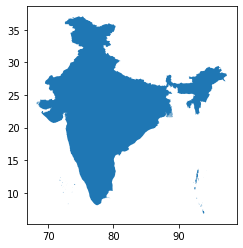

In [118]:
# Viewing India Map
map_India.plot()

In [119]:

net_mean = []
net_avg= 0.0
count = 1
for i in cities1:
    net_mean.append((count,i,df[i]["mean"].mean()))
    net_avg += df[i]["mean"].mean()
    count = count +1
net_mean.append((0,"India",-2))
df_boundaries = pd.DataFrame(columns = ["index","Name", "mean"])
# Cleaned Dataframe
df_boundaries = pd.DataFrame(net_mean, columns = ['index','Name', 'mean'])
df_boundaries.set_index("index",inplace = True)
df_boundaries # Boundaries and means of all Locations to be plotted

,Name,mean
index,,
1,Ahmedabad,-0.583594
2,Bangalore,-1.033135
3,Chennai,-1.103986
4,Hyderabad,-0.947310
5,Jaipur,-0.685767
6,Pune,-0.985005
7,Mumbai,-0.934412
8,Bhopal,-0.956933
9,Bhubaneshwar,-1.094891


In [120]:
cities2 = ["ahmedabad", "bangalore" , "chennai", "hyderabad", "jaipur" , "pune", "mumbai" ,"bhopal" ,"bhubaneshwar" , "kolkata","delhi"]
boundary_shapefiles = {}
geo = gpd.GeoSeries(1)
# print(geo)
for i in cities2:
    path1 = r'Cleaned CSVs/Boundary files/'+ i + '.geojson'
    try:
        boundary_shapefiles[i] = gpd.read_file(path1)
        # boundary_shapefiles[i].plot()
        
    except:
        path2 = r'Cleaned CSVs/Boundary files/'+ i + '.shp'
        try:
            boundary_shapefiles[i] = gpd.read_file(path2)
            # boundary_shapefiles[i].plot()
            
        except:
            continue
    geo = geo.append(boundary_shapefiles[i]["geometry"])
geo.iloc[0]= map_India.iloc[0]["geometry"]
GeoDF = gpd.GeoDataFrame(geo)
GeoDF.columns = ["geometry"]
GeoDF["i"] = [i for i in range(0,12)]
GeoDF.set_index("i",inplace= True)
GeoDF

,geometry
i,
0,"(POLYGON ((84.7685819052308 19.08002272866605,..."
1,"POLYGON ((72.4451995 23.0420819, 72.4460981999..."
2,"POLYGON ((77.46210670000001 12.8975897, 77.460..."
3,"(POLYGON ((80.1403998 13.0978875, 80.1401875 1..."
4,"(POLYGON ((78.2807423 17.4845165, 78.2807852 1..."
5,"POLYGON ((75.78598737700008 27.00526424200007,..."
6,"POLYGON ((73.772335 18.4888891, 73.7749958 18...."
7,"(POLYGON ((72.7802918 19.217928, 72.7799814 19..."
8,"POLYGON ((77.39355784991608 23.42155154218633,..."


In [121]:
# Merges Means with the shapefile DF
merged_India = GeoDF.merge(df_boundaries,left_index = True, right_index = True)
merged_India["centroid"] =merged_India.geometry.centroid
meansss = [str("{:.4f}".format(round(i, 2))) for i in (merged_India["mean"])]
merged_India["data"] = (merged_India["Name"])+ " " + meansss
merged_India

,geometry,Name,mean,centroid,data
0,"MULTIPOLYGON (((84.76858 19.08002, 84.76625 19...",India,-2.000000,POINT (79.47926 23.37824),India -2.0000
1,"POLYGON ((72.44520 23.04208, 72.44610 23.04985...",Ahmedabad,-0.583594,POINT (72.57299 23.02695),Ahmedabad -0.5800
2,"POLYGON ((77.46211 12.89759, 77.46022 12.90045...",Bangalore,-1.033135,POINT (77.60356 12.97879),Bangalore -1.0300
3,"MULTIPOLYGON (((80.14040 13.09789, 80.14019 13...",Chennai,-1.103986,POINT (80.23080 13.06179),Chennai -1.1000
4,"MULTIPOLYGON (((78.28074 17.48452, 78.28079 17...",Hyderabad,-0.947310,POINT (78.45471 17.42677),Hyderabad -0.9500
5,"POLYGON ((75.78599 27.00526, 75.78696 27.00391...",Jaipur,-0.685767,POINT (75.80230 26.89589),Jaipur -0.6900
6,"POLYGON ((73.77233 18.48889, 73.77500 18.48970...",Pune,-0.985005,POINT (73.87636 18.52835),Pune -0.9900
7,"MULTIPOLYGON (((72.78029 19.21793, 72.77998 19...",Mumbai,-0.934412,POINT (72.87062 19.11833),Mumbai -0.9300
8,"POLYGON ((77.39356 23.42155, 77.39317 23.42189...",Bhopal,-0.956933,POINT (77.41044 23.24109),Bhopal -0.9600
9,"POLYGON ((85.86774 20.28862, 85.86776 20.28860...",Bhubaneshwar,-1.094891,POINT (85.82753 20.29198),Bhubaneshwar -1.0900


## Plotting On INDIA MAP

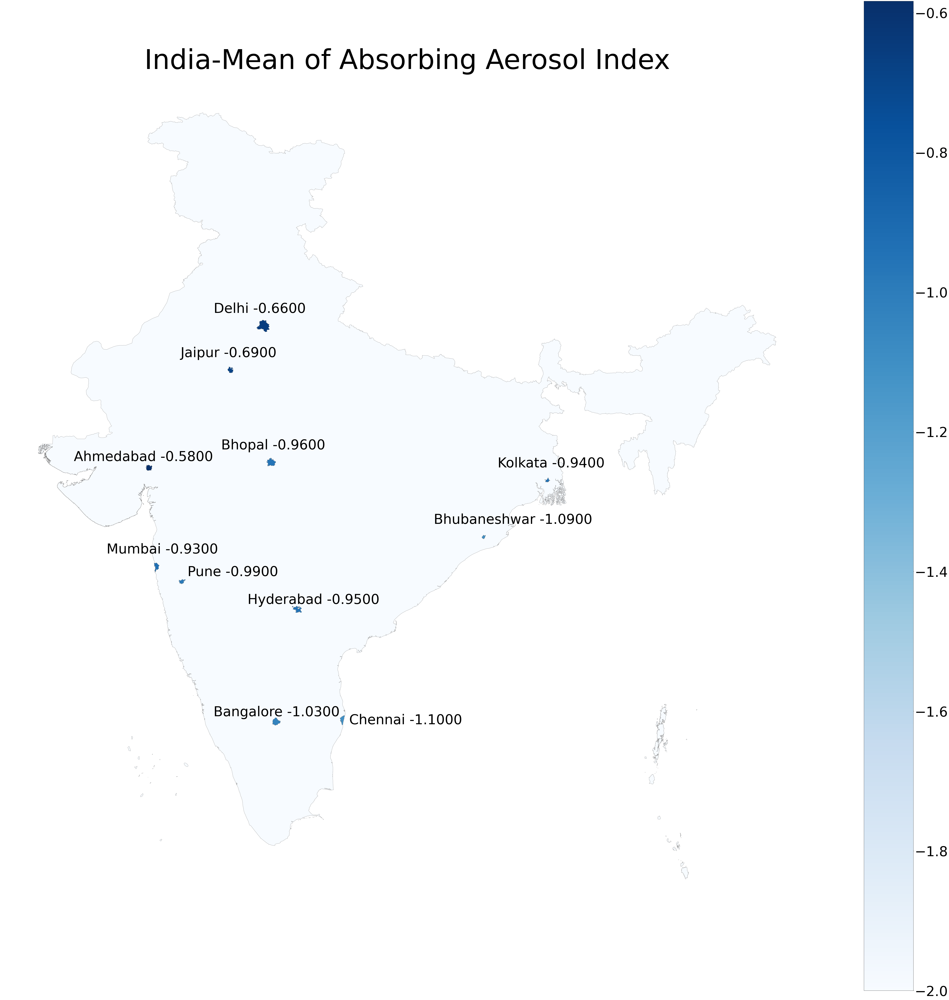

In [122]:
# Viewing our variable on the India Map
# Chloropleth of India with The cities and mean of absorbing aerosol index marked

%matplotlib inline
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values
vmin, vmax = merged_India["mean"].min() , merged_India["mean"].max()
# create figure and axes for Matplotlib
fig, ax = plt.subplots(1, figsize=(100, 100))
# remove the axis
ax.axis('off')
# add a title and annotation
ax.set_title('India-Mean of Absorbing Aerosol Index', fontdict={'fontsize': '150', 'fontweight' : '3'})
# Create colorbar legend
sm = plt.cm.ScalarMappable(cmap='Blues',norm=plt.Normalize(vmin=vmin, vmax=vmax)) 
# empty array for the data range
sm.set_array([]) 
# add the colorbar to the figure
bx = fig.colorbar(sm)
bx.ax.tick_params(labelsize=75)

# create map
ax = merged_India.plot(column=variable, cmap='Blues', linewidth=0.8, ax=ax, edgecolor='0.5', figsize = (150,450), label = merged_India.data)
 # ax = cities.plot()
counter = 0
for x, y, label in zip(merged_India.centroid.x, merged_India.centroid.y, merged_India.data ):
    if(label == "India -2.0000"):
        continue
    if(label == "Ahmedabad -0.5800"):
            ax.annotate(label, xy=(x-3, y+0.25), xytext=(3, 3), textcoords="offset points",fontsize = 75)
            continue
    if(label == "Pune -0.9900"):
            ax.annotate(label, xy=(x+0.2, y+0.2), xytext=(3, 3), textcoords="offset points",fontsize = 75)
            continue
    if(label == "Hyderabad -0.9500"):
            ax.annotate(label, xy=(x-2, y+0.2), xytext=(3, 3), textcoords="offset points",fontsize = 75)
            continue
    if(label == "Chennai -1.1000"):
            ax.annotate(label, xy=(x+0.25, y-0.2), xytext=(3, 3), textcoords="offset points",fontsize = 75)
            continue
    if(label == "Bangalore -1.0300"):
            ax.annotate(label, xy=(x-2.5, y+0.2), xytext=(3, 3), textcoords="offset points",fontsize = 75)
            continue
    ax.annotate(label, xy=(x-2, y+0.50), xytext=(3, 3), textcoords="offset points",fontsize = 75)
# plt.legend()
plt.show()

## Plots For all Regions

In [123]:
weekly_data_mean = pd.read_csv("Cleaned CSVs/WEEK_DATA/weekly_collab.csv")
weekly_data_mean.date = pd.to_datetime(weekly_data_mean.date)
weekly_data_mean.set_index("date",inplace = True)
weekly_data_mean


,Ahmedabad,Bangalore,Bhopal,Bhubaneshwar,Chennai,Delhi,Hyderabad,Jaipur,Kolkata,Mumbai,Pune
date,,,,,,,,,,,
2018-07-16,-0.756585,-0.896302,-0.557584,-0.642007,-0.540671,-0.453550,-0.600131,-0.565500,-1.104306,-0.491262,-0.896013
2018-07-23,-0.441123,-0.222558,-0.490329,-0.647062,-0.660151,-0.884397,-0.770834,-0.692978,-0.692227,-0.558497,-0.480637
2018-07-30,0.108523,-0.378929,-0.178767,-0.851047,-0.082220,-0.577875,0.070294,-0.264672,-0.557875,0.009168,-0.417762
2018-08-06,0.401942,-0.000837,-0.329908,-0.412066,-0.491096,-0.103947,-0.138146,-0.172926,-0.539648,0.958713,0.278316
2018-08-13,0.590059,-0.537708,-0.120354,-1.297045,-0.133111,-0.402681,-0.275480,-0.309478,-1.537283,0.022972,-0.339340
...,...,...,...,...,...,...,...,...,...,...,...
2020-09-21,-1.404141,-1.462358,-1.733017,-1.411822,-1.443073,-1.425032,-1.398443,-1.314791,-1.422304,-1.392733,-1.625738
2020-09-28,-1.152335,-1.380333,-1.788614,-1.847646,-1.673202,-1.010724,-1.275906,-1.347430,-1.335335,-1.535179,-1.380134
2020-10-05,-1.105371,-1.433105,-1.151164,-1.363438,-1.371587,-0.925760,-1.268969,-0.912607,-1.875154,-1.441283,-1.625510


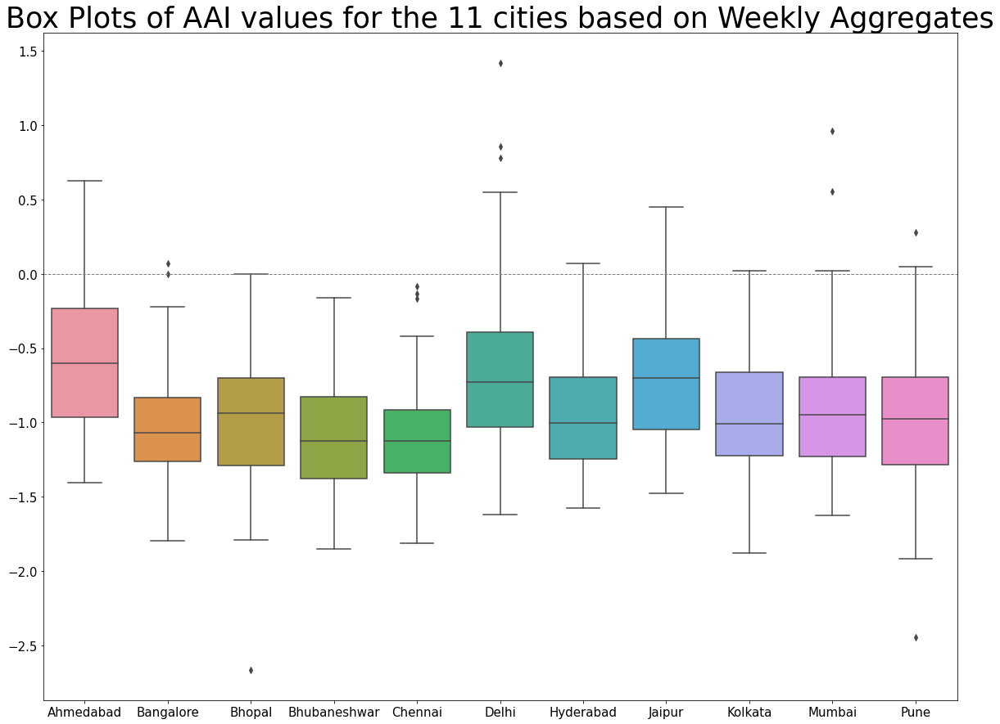

In [124]:
plt.figure(figsize = (20,15))
sns.boxplot(data= weekly_data_mean)
plt.axhline(0.0, color='gray', linestyle='dashed',
            linewidth=1, label = "Mean")
plt.title("Box Plots of AAI values for the 11 cities based on Weekly Aggregates",fontsize = 35)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.show()

The box plots shows that some cities like Ahmedabad, Delhi, Jaipur have the Absorbing Aerosol Index values above 0 which is a sign of hazardous levels of pollution in these cities. In cities like Delhi, there are a few out liers which signifies that there a some weeks where there the smoke and dust level are very high and vidibility is quite low, justified by high AAI values. Mumbai has comparitively lesser weeks like this and it is less extreme.

In [125]:
# Summary Statistics Weekly
weekly_data_mean.describe()

,Ahmedabad,Bangalore,Bhopal,Bhubaneshwar,Chennai,Delhi,Hyderabad,Jaipur,Kolkata,Mumbai,Pune
count,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000,119.000000
mean,-0.582159,-1.034328,-0.964281,-1.095213,-1.100871,-0.654578,-0.948809,-0.683146,-0.945886,-0.932589,-0.993879
std,0.467442,0.313817,0.457652,0.343291,0.332805,0.547450,0.330388,0.448705,0.365945,0.408459,0.430942
min,-1.404141,-1.793873,-2.663199,-1.847646,-1.810164,-1.620755,-1.573841,-1.476412,-1.875154,-1.626773,-2.441827
25%,-0.965512,-1.259664,-1.286647,-1.376484,-1.339684,-1.028708,-1.242476,-1.046962,-1.223273,-1.229079,-1.285855
50%,-0.599787,-1.068108,-0.939337,-1.123672,-1.123548,-0.727903,-1.002705,-0.697938,-1.009371,-0.950023,-0.975512
75%,-0.234328,-0.832001,-0.698949,-0.828347,-0.913961,-0.389772,-0.696824,-0.438290,-0.664147,-0.697365,-0.696135
max,0.628108,0.072607,-0.003475,-0.160723,-0.082220,1.415602,0.070294,0.451761,0.018691,0.958713,0.278316


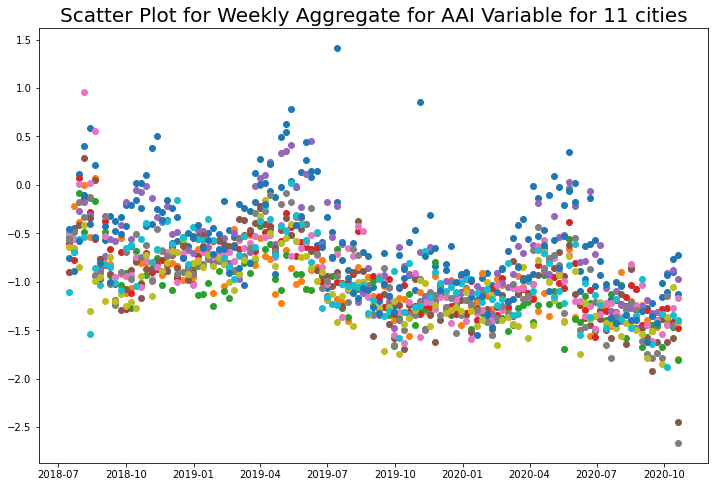

In [126]:
# sns.boxplot(data= weekly_data_mean)
plt.figure(figsize = (12,8))
for i in cities1:
    plt.scatter(x = weekly_data_mean.index, y = weekly_data_mean[i],label = i)
# plt.legend()
plt.title("Scatter Plot for Weekly Aggregate for AAI Variable for 11 cities", fontsize= 20)
plt.setp(plt.gca().get_xticklabels(), fontsize=10)
plt.show()

The scatter plot of weekly aggregate shows a seasonal trend wehere there is are extreme values of AAI in summers and comparitively lower values in winter.

In [127]:
monthly_data_mean = pd.read_csv("Cleaned CSVs/MONTH_DATA/monthly_collab.csv")

In [128]:
# Summary Statistics Monthly
monthly_data_mean.describe()

,Ahmedabad,Bangalore,Bhopal,Bhubaneshwar,Chennai,Delhi,Hyderabad,Jaipur,Kolkata,Mumbai,Pune
count,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000
mean,-0.586662,-1.035066,-0.961516,-1.089359,-1.103280,-0.662504,-0.949568,-0.686848,-0.950377,-0.932042,-0.993262
std,0.418977,0.271389,0.389578,0.292168,0.288606,0.429254,0.292071,0.387927,0.320910,0.356192,0.382903
min,-1.250079,-1.518255,-1.711059,-1.658433,-1.552375,-1.319630,-1.382430,-1.286629,-1.567887,-1.506054,-1.687852
25%,-0.952383,-1.205974,-1.291184,-1.330089,-1.305032,-1.032945,-1.195781,-1.047640,-1.144023,-1.234692,-1.308180
50%,-0.549166,-1.106315,-0.932946,-1.122891,-1.118413,-0.602278,-0.906686,-0.626147,-0.978432,-0.874155,-0.982953
75%,-0.297980,-0.889730,-0.700275,-0.878198,-0.946842,-0.421228,-0.787334,-0.437523,-0.697642,-0.749008,-0.757161
max,0.194117,-0.352060,-0.266061,-0.511579,-0.394543,0.152676,-0.429574,0.103095,-0.307695,-0.010012,-0.322667


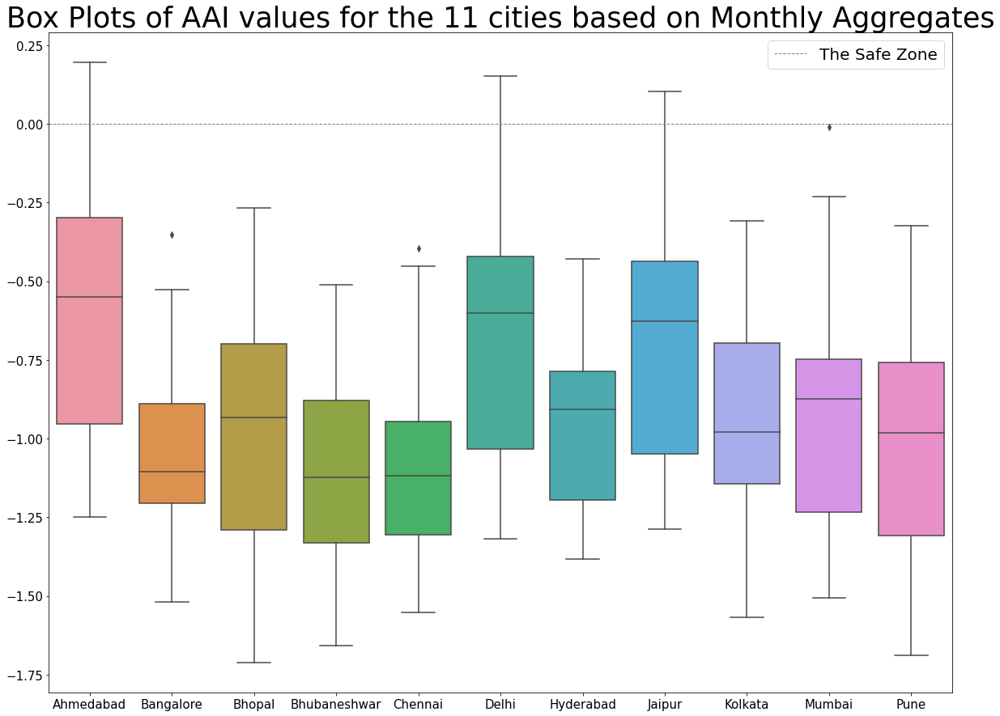

In [129]:
plt.figure(figsize = (20,15))
sns.boxplot(data= monthly_data_mean)
plt.axhline(0.0, color='gray', linestyle='dashed',
            linewidth=1, label = "The Safe Zone")
plt.title("Box Plots of AAI values for the 11 cities based on Monthly Aggregates",fontsize = 35)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.legend(fontsize = 20)
plt.show()

The box plots shows that some cities like Ahmedabad, Delhi, Jaipur have the Absorbing Aerosol Index values above 0 which is a sign of hazardous levels of pollution in these cities. In these cities, we can observe that there are some months where the smoke and dust levels are very high and vidibility is quite low, justified by high AAI values.

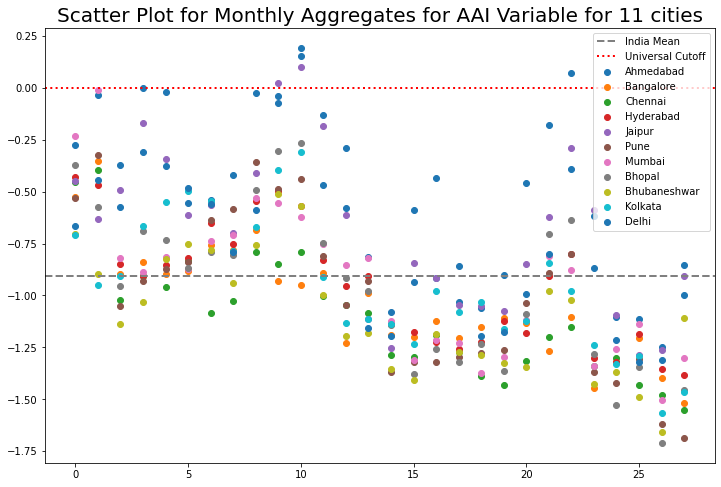

In [130]:
plt.figure(figsize = (12,8))
mn = 0
for i in cities1:
    plt.scatter(x = monthly_data_mean.index, y = monthly_data_mean[i],label = i)
    mn += monthly_data_mean[i].mean()

plt.axhline(mn/11.0, color='gray', linestyle='dashed',
            linewidth=2, label = "India Mean")
plt.axhline(0.0, color='red', linestyle='dotted',
            linewidth=2, label = "Universal Cutoff")
plt.title("Scatter Plot for Monthly Aggregates for AAI Variable for 11 cities", fontsize= 20)
plt.setp(plt.gca().get_xticklabels(), fontsize=10)
plt.legend()
plt.show()

The scatter plot of monthly aggregate of AAI, also show a similar trend in the AAI values. The value 0 on  x-axis indicates July 2018 and the next values corresponding to their respective months. The Plot also signifies a downward shift in the overall values of AAI since 2018.

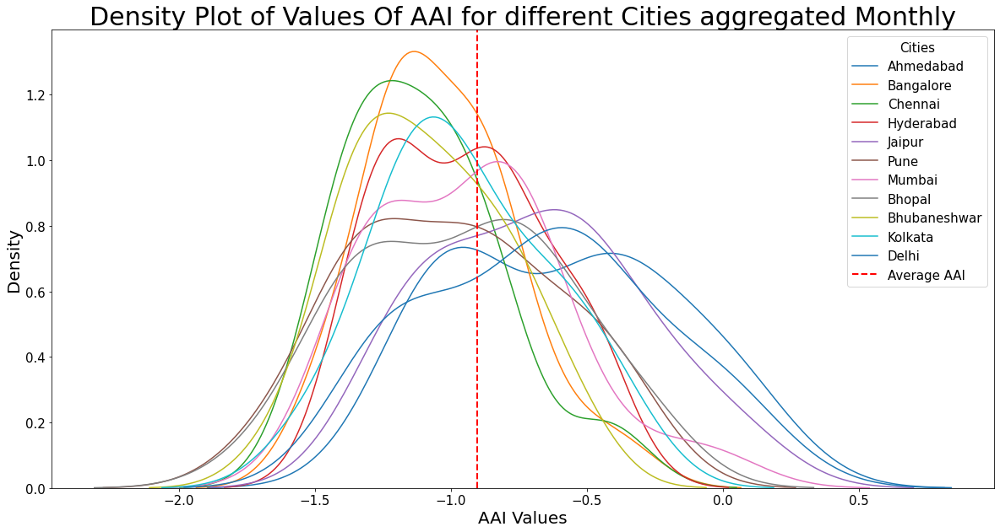

In [131]:
plt.figure(figsize = (20,10))
for i in cities1:
    sns.kdeplot(monthly_data_mean[i], label = i)

plt.title("Density Plot of Values Of AAI for different Cities aggregated Monthly",fontsize = 30)
plt.xlabel("AAI Values",fontsize = 20)
plt.ylabel("Density",fontsize = 20)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.gca().axvline(x=mn/11.0,color='r', linestyle='--', lw=2, label = "Average AAI")
plt.legend(fontsize = 15, title ="Cities",title_fontsize = 15 )
plt.show()

Curves for most cities end near 0.25. But Cities like Ahmedabad, Delhi, Jaipur have a steeper curve and a lot of values of the Absorbing Aerosol Index above 0 which is a sign of hazardous levels of pollution in these cities. Delhi is the curve which ends the last signifying threatening levels of AAI Values on some occasions

## Grouping Cities into Categories.
If mean of the AOD value for a city is greater than the overall mean of all cities, they are placed in Group 1.
The cities not in Group 1 are placed in Group 2

In [132]:
cities_describe = monthly_data_mean.describe()
grp1=[]
grp2=[]
for i in cities1:
    if(cities_describe[i]["mean"] > mn/11.0):
        grp1.append(i)
    else:
        grp2.append(i)
print("Group 1 of Cities: ", grp1)
print("Group 2 of Cities: ", grp2)

Group 1 of Cities:  ['Ahmedabad', 'Jaipur', 'Delhi']
Group 2 of Cities:  ['Bangalore', 'Chennai', 'Hyderabad', 'Pune', 'Mumbai', 'Bhopal', 'Bhubaneshwar', 'Kolkata']


In [133]:
cities_describe

,Ahmedabad,Bangalore,Bhopal,Bhubaneshwar,Chennai,Delhi,Hyderabad,Jaipur,Kolkata,Mumbai,Pune
count,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000,28.000000
mean,-0.586662,-1.035066,-0.961516,-1.089359,-1.103280,-0.662504,-0.949568,-0.686848,-0.950377,-0.932042,-0.993262
std,0.418977,0.271389,0.389578,0.292168,0.288606,0.429254,0.292071,0.387927,0.320910,0.356192,0.382903
min,-1.250079,-1.518255,-1.711059,-1.658433,-1.552375,-1.319630,-1.382430,-1.286629,-1.567887,-1.506054,-1.687852
25%,-0.952383,-1.205974,-1.291184,-1.330089,-1.305032,-1.032945,-1.195781,-1.047640,-1.144023,-1.234692,-1.308180
50%,-0.549166,-1.106315,-0.932946,-1.122891,-1.118413,-0.602278,-0.906686,-0.626147,-0.978432,-0.874155,-0.982953
75%,-0.297980,-0.889730,-0.700275,-0.878198,-0.946842,-0.421228,-0.787334,-0.437523,-0.697642,-0.749008,-0.757161
max,0.194117,-0.352060,-0.266061,-0.511579,-0.394543,0.152676,-0.429574,0.103095,-0.307695,-0.010012,-0.322667


In [134]:
# color scheme
vmin, vmax = min(cities_describe.loc["50%"]),max(cities_describe.loc["50%"])
vmin,vmax

(-1.1228910785, -0.5491664955)

**We classified cities into 2 separate categories based on the spread of the values**

**Group 1** Contains cities whose median values lie above the overall mean of the cities.
- Delhi
- Ahmedabad
- Jaipur


**Group 2** contains the other cities
- Mumbai
- Bangalore  
- Bhubaneshwar
- Chennai 
- Hyderabad 
- Pune
- Bhopal
- Kolkata

## Comparison among Group 1 and Group 2

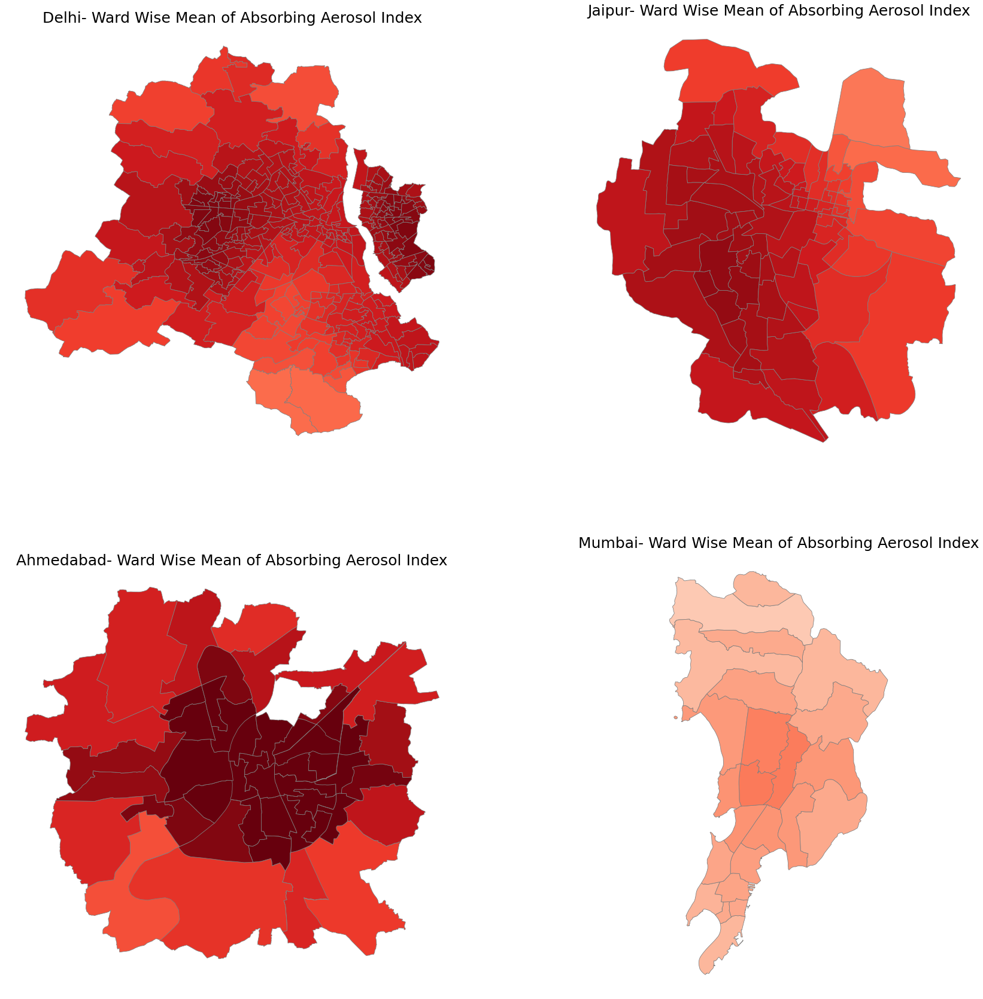

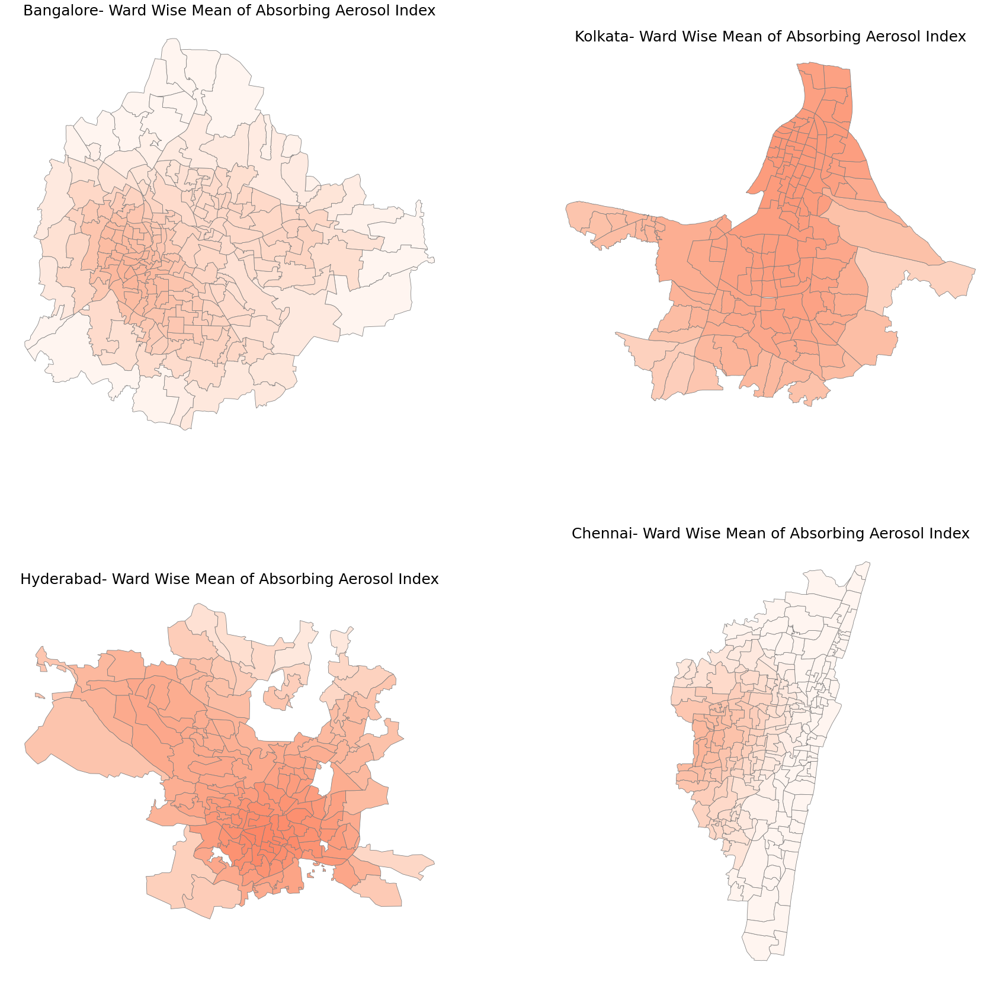

In [135]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values

# create figure and axes for Matplotlib
fig, axes = plt.subplots(nrows = 2,ncols = 2, figsize=(30, 30))
# remove the axis
axes[0][0].axis('off')
axes[0][1].axis('off')
# add a title and annotation
axes[0][0].set_title('Delhi- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
axes[0][1].set_title('Jaipur- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})


# sm = fig.cm.ScalarMappable(cmap='Reds',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 

# sm.set_array([]) 
# # # add the colorbar to the figure
# fig.colorbar(sm)



# remove the axis
axes[1][0].axis('off')
axes[1][1].axis('off')
# add a title and annotation
axes[1][0].set_title('Ahmedabad- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
axes[1][1].set_title('Mumbai- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})


# sm = fig.cm.ScalarMappable(cmap='Reds',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 

# sm.set_array([]) 
# # # add the colorbar to the figure
# fig.colorbar(sm)


# create map
merged_Ahmedabad.plot(column=variable, cmap='Reds',vmax = vmax,vmin = vmin, linewidth=0.8, ax=axes[1][0], edgecolor='0.5', figsize = (5,15))
merged_Mumbai.plot(column=variable, cmap='Reds',vmax = vmax,vmin = vmin, linewidth=0.8, ax=axes[1][1], edgecolor='0.5', figsize = (5,15))
# create map
merged_Delhi.plot(column=variable, cmap='Reds',vmax = vmax,vmin = vmin, linewidth=0.8, ax=axes[0][0], edgecolor='0.5', figsize = (5,15))
merged_Jaipur.plot(column=variable, cmap='Reds',vmax = vmax,vmin = vmin, linewidth=0.8, ax=axes[0][1], edgecolor='0.5', figsize = (5,15))
plt.show()

# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values

# create figure and axes for Matplotlib
fig, axes = plt.subplots(nrows = 2,ncols = 2, figsize=(30, 30))
# remove the axis
axes[0][0].axis('off')
axes[0][1].axis('off')
# add a title and annotation
axes[0][0].set_title('Bangalore- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
axes[0][1].set_title('Kolkata- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})


# remove the axis
axes[1][0].axis('off')
axes[1][1].axis('off')
# add a title and annotation
axes[1][0].set_title('Hyderabad- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
axes[1][1].set_title('Chennai- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})



# create map
merged_Hyderabad.plot(column=variable, cmap='Reds',vmax = vmax,vmin = vmin, linewidth=0.8, ax=axes[1][0], edgecolor='0.5', figsize = (5,15))
merged_Chennai.plot(column=variable, cmap='Reds',vmax = vmax,vmin = vmin, linewidth=0.8, ax=axes[1][1], edgecolor='0.5', figsize = (5,15))
# create map
merged_Bangalore.plot(column=variable, cmap='Reds',vmax = vmax,vmin = vmin, linewidth=0.8, ax=axes[0][0], edgecolor='0.5', figsize = (5,15))
merged_Kolkata.plot(column=variable, cmap='Reds',vmax = vmax,vmin = vmin, linewidth=0.8, ax=axes[0][1], edgecolor='0.5', figsize = (5,15))
plt.show()

**We can clearly observe that Group 1 cities have very high AAI values when compared to Group 2 cities. Now we will dive in to comparison of 2 specific cities picked randomly from Group 1 and Group 2 respectively.**

## Comparative Case Study Of Group 1 and Group 2 cities with Delhi And Hyderabad as Prime Cities on Absorbing Aerosol Index(AAI)

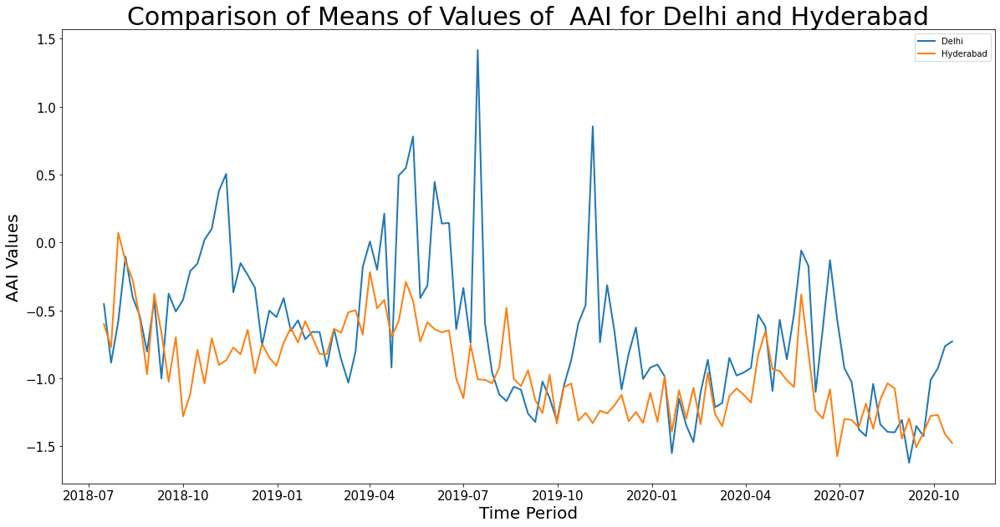

In [136]:
plt.figure(figsize = (20,10))
plt.plot(Weekly_Delhi_mean.index, Weekly_Delhi_mean["mean"], label = "Delhi", lw = 2)
plt.plot(Weekly_Hyderabad_mean.index, Weekly_Hyderabad_mean["mean"], label = "Hyderabad", lw =2 )
plt.xlabel("Time Period",fontsize = 20)
plt.ylabel("AAI Values", fontsize = 20)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.title("Comparison of Means of Values of  AAI for Delhi and Hyderabad", fontsize = 30)
plt.legend()


We can observe that the curve of **Delhi (Group1)** is normally higher than **Hyderabad (Group 2)** at most points. Also **Delhi (Group1)** has larger peaks indicating its high mean AAI values.

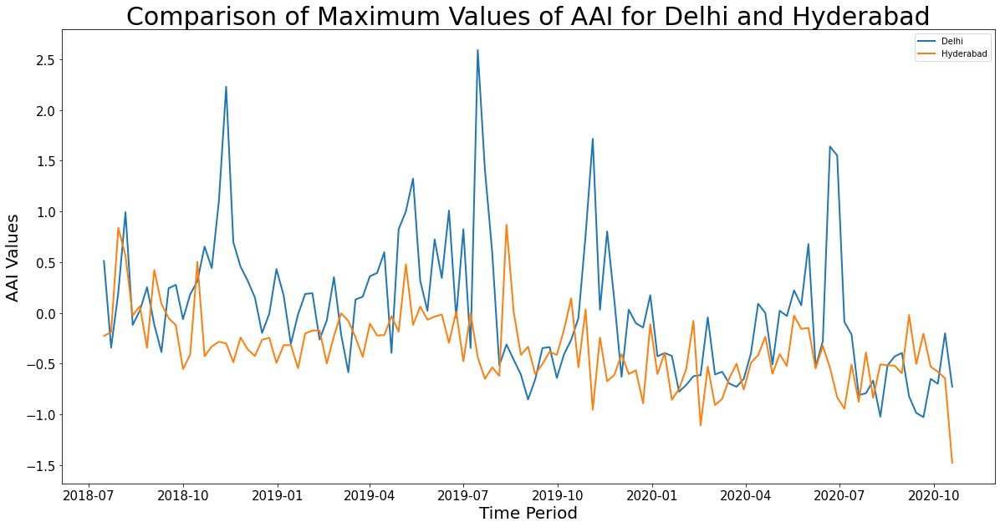

In [137]:
plt.figure(figsize = (20,10))
plt.plot(Weekly_Delhi_max.index, Weekly_Delhi_max["mean"], label = "Delhi", lw = 2)
plt.plot(Weekly_Hyderabad_max.index, Weekly_Hyderabad_max["mean"], label = "Hyderabad", lw =2 )
plt.xlabel("Time Period",fontsize = 20)
plt.ylabel("AAI Values", fontsize = 20)
plt.setp(plt.gca().get_xticklabels(), fontsize=15)
plt.setp(plt.gca().get_yticklabels(), fontsize=15)
plt.title("Comparison of Maximum Values of AAI for Delhi and Hyderabad", fontsize = 30)
plt.legend()


We can observe that the curve of **Delhi (Group1)** is mostly higher than **Hyderabad (Group 2)** at most points. Also **Delhi (Group1)** has larger peaks indicating its high max AAI values.

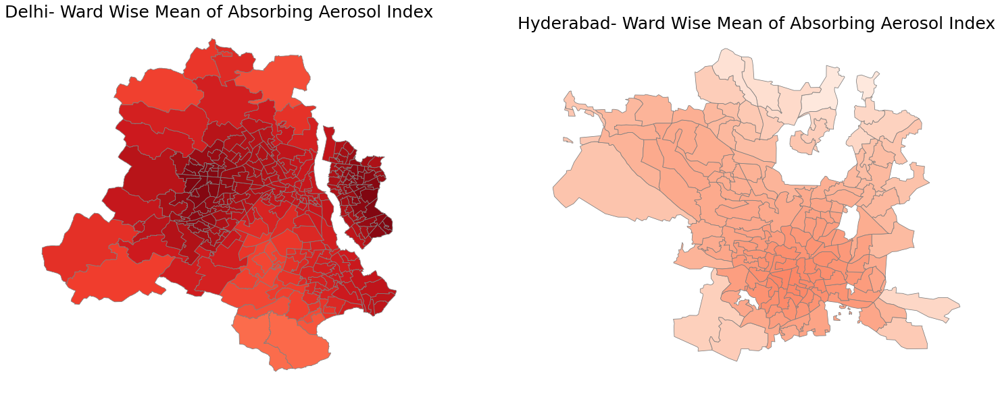

In [138]:
# Plotting chloropleth 
# set the value column that will be visualised
variable = 'mean'
# # set the range for the choropleth values

# create figure and axes for Matplotlib
fig, axes = plt.subplots(ncols = 2, figsize=(30, 10))
fig.subplots_adjust(right=0.8)
# remove the axis
axes[0].axis('off')
axes[1].axis('off')
# add a title and annotation
axes[0].set_title('Delhi- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})
axes[1].set_title('Hyderabad- Ward Wise Mean of Absorbing Aerosol Index', fontdict={'fontsize': '25', 'fontweight' : '3'})


# sm = fig.cm.ScalarMappable(cmap='coolwarm',norm=plt.Normalize(vmin=vmin, vmax=vmax )) 

# sm.set_array([]) 
# # # add the colorbar to the figure
# fig.colorbar(sm)


# create map
merged_Delhi.plot(column=variable, cmap='Reds',vmax = vmax,vmin = vmin, linewidth=0.8, ax=axes[0], edgecolor='0.5', figsize = (5,15))
merged_Hyderabad.plot(column=variable, cmap='Reds',vmax = vmax,vmin = vmin, linewidth=0.8, ax=axes[1], edgecolor='0.5', figsize = (5,15))
plt.show()

**Conclusion**

Delhi representing Group 1 have very high AAI Values depciting high presence of Aerosols. Where Hyderabad representing Group 2 is on a lighter shade.






Aerosols have a wide affect on the climatic conditions of the region. And due to presence of Aerosols which are produced by man made activities, it has further affected a region adversely. Initiatives have been taken by the Goverments of the Nations to curb this and move towards Sustainable Development. And we can see the results above where we had seen that climate had indeed gotten better than the previous year attributed to Corona Virus Pandemic where the working class was restricted to staying indoors. There is light at the end of this dark tunnel and we are currently heading towards it. Advancing in Technology to make use of Renewable Resources seems to be the next way forward.

**Thank You**